# Input & algorithm

In [7]:
%config InlineBackend.figure_format = 'retina'

In [8]:
# import packages
import h5py # read h5

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime
from matplotlib import rc
from cycler import cycler

import numpy as np
import pandas as pd

from merge_h5_files import merge_preserve_time
import os
import glob
from tomlkit import date


# Figure format
rc = {'axes.facecolor':'white',
      'figure.figsize': (12, 6),
      'savefig.dpi': 600,
#       'axes.grid' : False,
      'axes.edgecolor' : '0.15',
      
      'font.family':'Times New Roman',
      'font.serif': ['Times New Roman', 'Times', 'STIXGeneral'],  # 备选
      # —— 数学字体（$...$ 内）——
      'mathtext.fontset': 'stix',     # 关键：让 μ、ε 等用 STIX（Times 风格）
      'axes.unicode_minus': False,    # 让负号显示为正常的连字符


      'axes.labelsize': 20,         # X、Y 轴标题字体
      'axes.labelweight': 'bold',   # X、Y 轴标题加粗
      'xtick.labelsize': 20,        # X轴刻度文字
      'ytick.labelsize': 20,        # Y轴刻度文字
      'legend.fontsize': 20,       # 图例字体

      # 线宽与颜色顺序
      'lines.linewidth': 2.25,      # 所有线条默认 2.25 pt
      'axes.prop_cycle': cycler('color', list(('k', 'r', 'b', 'g', 'm', 'c', 'y'))),

      # 刻度朝外 & 粗细
      'xtick.direction': 'out',
      'ytick.direction': 'out',
      'xtick.major.size': 6,
      'ytick.major.size': 6,
      'xtick.major.width': 2.0,
      'ytick.major.width': 2.0,

      # 坐标轴（内框）线宽
      'axes.linewidth': 2.0,
      } 
# lack of font size
plt.rcParams.update(rc)

In [9]:
import numpy as np
import matplotlib.pyplot as plt

def _merge_intervals(intervals):
    if not intervals:
        return []
    intervals = sorted(intervals, key=lambda x: (x[0], x[1]))
    merged = [list(intervals[0])]
    for a, b in intervals[1:]:
        if a <= merged[-1][1]:
            merged[-1][1] = max(merged[-1][1], b)
        else:
            merged.append([a, b])
    return [tuple(x) for x in merged]

def plot_response_intervals(
    total_range,
    intervals,
    *,
    merge=True,
    normalize=False,
    show_labels=False,
    show_legend=False,
    band_height=0.3,
    figsize=(11, 2.2),
    title=None,
    cmap_name="tab20",   # 你可以换成 "hsv", "turbo", "viridis" 等
):
    L, R = map(float, total_range)
    if L > R:
        L, R = R, L

    # sanitize + clip
    cleaned = []
    for a, b in intervals:
        a, b = float(a), float(b)
        if a > b:
            a, b = b, a
        aa, bb = max(a, L), min(b, R)
        if bb > aa:
            cleaned.append((aa, bb))

    if merge:
        cleaned = _merge_intervals(cleaned)

    def xmap(x):
        return (x - L) / (R - L) if normalize else x

    xL, xR = xmap(L), xmap(R)

    fig, ax = plt.subplots(figsize=figsize)

    # baseline
    ax.hlines(0, xL, xR, linewidth=2)

    # === 按区间数量分配不同颜色 ===
    n = len(cleaned)
    cmap = plt.get_cmap(cmap_name)
    # 均匀采样 n 个颜色（避免 tab20 不够用时全挤在前面）
    colors = cmap(np.linspace(0, 1, max(n, 1)))

    y0 = -band_height / 2
    handles = []
    labels = []

    for i, (a, b) in enumerate(cleaned):
        xa, xb = xmap(a), xmap(b)
        w = xb - xa
        min_w = 8 if not normalize else 0.002   # 不 normalize 时，最小 8 个 channel；normalize 时给一个小比例
        w = max(w, min_w)

        ax.broken_barh([(xa, w)], (y0, band_height),
                    facecolors=colors[i-1], alpha=0.9)

        if show_labels:
            mid = (xa + xb) / 2

            # 文字向上移动：在色带上方一点
            y_text = y0 + band_height + 0.10 * band_height  # 你可以把 0.10 调大/调小
            ax.text(mid, y_text, f"{i}",
                ha="center", va="bottom", fontsize=9)
            # ax.text(mid, 0, f"{int(a)}–{int(b)}", ha="center", va="center", fontsize=9)

        if show_legend:
            # 用一个不可见的 bar 当 legend 句柄
            h = ax.bar(-1, 0, color=colors[i], label=f"{int(a)}–{int(b)}")[0]
            handles.append(h)
            labels.append(f"{int(a)}–{int(b)}")

    # cosmetics
    ax.set_ylim(-0.3, 0.7)
    ax.set_yticks([])
    if normalize:
        ax.set_xlim(0, 1)
        ax.set_xlabel("Position in total range (0–100%)")
        ax.set_xticks([0, 0.25, 0.5, 0.75, 1.0])
        ax.set_xticklabels(["0%", "25%", "50%", "75%", "100%"])
    else:
        ax.set_xlim(L, R)
        # ax.set_xlabel("Channel")

    if title:
        ax.set_title(title)

    for spine in ["left", "right", "top"]:
        ax.spines[spine].set_visible(False)

    if show_legend and n > 0:
        ax.legend(handles=handles, labels=labels, loc="upper center",
                  bbox_to_anchor=(0.5, 1.35), ncol=min(6, n), frameon=False, fontsize=15)

    plt.tight_layout()
    return fig, ax, cleaned




plt.show()


# EVO 7

## show channels

(<Figure size 1500x300 with 1 Axes>,
 <Axes: >,
 [(38364.0, 38434.0),
  (38869.0, 38922.0),
  (39593.0, 39605.0),
  (39653.0, 39659.0),
  (41410.0, 41422.0),
  (43122.0, 43159.0),
  (43230.0, 43236.0),
  (43934.0, 43962.0),
  (44126.0, 44146.0),
  (44858.0, 44866.0),
  (44970.0, 45004.0),
  (45756.0, 45804.0),
  (45848.0, 45886.0),
  (46696.0, 46710.0),
  (47410.0, 47440.0),
  (47534.0, 47546.0),
  (47600.0, 47644.0),
  (48522.0, 48540.0)])

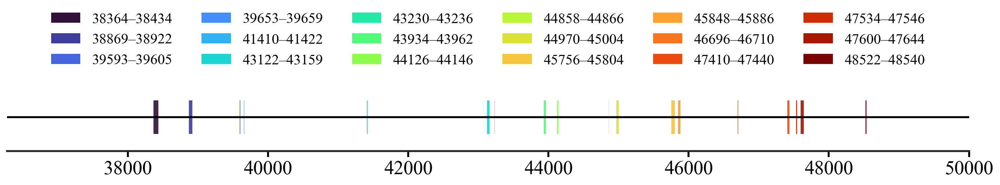

In [13]:
# ======= 示例 =======
from pickle import TRUE


total = (36276, 50000)
resp_intervals = [
    (38364,38434), #1
    (38869,38922), #2
    (39593,39605),  #3
    (39653,39659),  #4
    (41410,41422),  #5
    (43122,43159),  #6
    (43230,43236),  #7
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    (45756,45804),  #12
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    (47600,47644),  #17
    (48522,48540),  #18
]

plot_response_intervals(
    total, resp_intervals,
    figsize=(15, 3),
    merge=False,          # 如果你想“每段都不同颜色”，建议先别 merge
    normalize=False,
    show_labels=False,
    show_legend=TRUE    ,    # 区间多的话 legend 会很挤
    cmap_name="turbo",    # 区间>20时可换 "hsv" 或 "turbo"
    # title="Fracture-response intervals (strain change)"
)

In [5]:
len(resp_intervals)

18

## show both channels and strain change

### V1

dstrain shape: (3415, 57204)


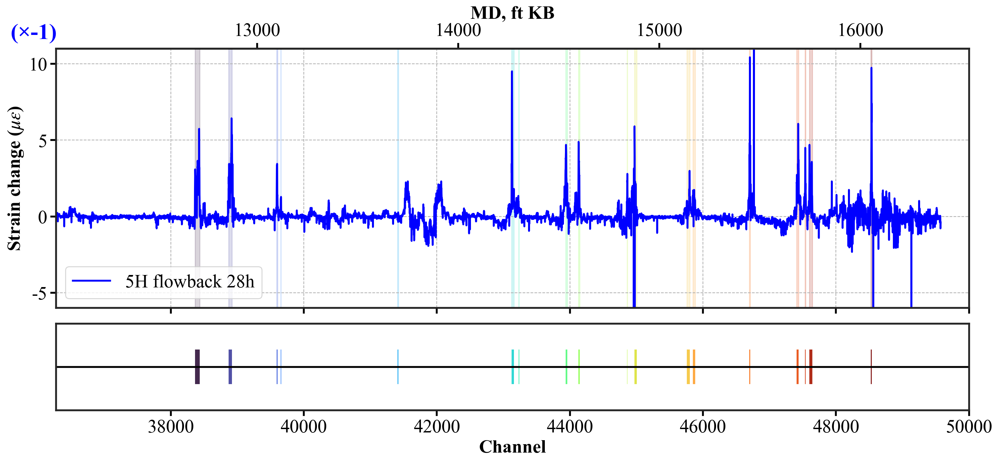

In [ ]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex

# =======================
# 1. 读取 HDF5 数据
# =======================
f1 = h5py.File(
    r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5',
    'r'
)

dstrain = f1['strain_corrected'][...]   # (time, depth)
depth   = np.asarray(f1['depth'][...])  # (ndepth,)
stamps  = f1['stamps']

print("dstrain shape:", dstrain.shape)

stamps_idx = decode_stamps_to_datetimeindex(
    stamps,
    fmt='%m/%d/%Y %H:%M:%S.%f'
)

# =======================
# 2. depth window (你想看的MD范围)
# =======================
depth_min = 12000
depth_max = 16400
depth_mask = (depth >= depth_min) & (depth <= depth_max)

depth_window = depth[depth_mask]

# =======================
# 3. test times
# =======================
start_time = datetime.datetime(2022, 6, 2, 8, 0)
test_time = [start_time + datetime.timedelta(hours=h) for h in [0, 4, 8, 12, 24, 28]]

point_labels = [f"P{i+1}" for i in range(len(test_time))]
points_target = dict(zip(point_labels, test_time))

# =======================
# 4. 找最近时间索引
# =======================
def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    deltas = idx - target
    return int(np.abs(deltas).argmin())

point_indices = {}
for label, t_target in points_target.items():
    point_indices[label] = find_nearest_time_index(stamps_idx, pd.to_datetime(t_target))

# =======================
# 5. extract profiles (每个Pi对应一个深度profile)
# =======================
profiles = {}
for label in point_labels:
    i = point_indices[label]
    profiles[label] = dstrain[i, depth_mask]

# =======================
# 6. outputs (你的运算)
# =======================
output5 = -1 * (profiles["P6"] - profiles["P1"])

outputs = {"5H flowback 28h": output5}

default_style = {"linewidth": 2, "alpha": 1, "linestyle": "-", "color": "#0000FF"}

# =======================
# 7. fracture response intervals (channel区间)
# =======================
resp_intervals = [
    (38364,38434),
    (38869,38922),
    (39593,39605),
    (39653,39659),
    (41410,41422),
    (43122,43159),
    (43230,43236),
    (43934,43962),
    (44126,44146),
    (44858,44866),
    (44970,45004),
    (45756,45804),
    (45848,45886),
    (46696,46710),
    (47410,47440),
    (47534,47546),
    (47600,47644),
    (48522,48540),
]
total = (36276, 50000)   # 下面区间图的channel总范围
L, R = total

# =======================
# 8. channel system (depth[i] <-> channel i)
# =======================
channel = np.arange(len(depth))
channel_window = channel[depth_mask]

# 关键：channel->MD, MD->channel 映射（用depth数组做插值）
# depth 是随 channel 单调变化（一般是单调递增），np.interp 才靠谱
def chan_to_md(x_chan):
    return np.interp(x_chan, channel, depth)

def md_to_chan(x_md):
    return np.interp(x_md, depth, channel)

# =======================
# 9. create stacked figure
# =======================
fig, (ax1, ax2) = plt.subplots(
    2, 1,
    figsize=(15, 7),
    sharex=True,
    gridspec_kw={"height_ratios": [3, 1]}
)

# =======================
# 10. 上图：先画透明高亮，再画曲线
# =======================
cmap = plt.get_cmap("turbo")
colors = cmap(np.linspace(0, 1, len(resp_intervals)))

# 透明高亮（按下面interval的channel范围来）
for i, (a, b) in enumerate(resp_intervals):
    ax1.axvspan(a, b, color=colors[i], alpha=0.18, zorder=0)

# 曲线
for name, arr in outputs.items():
    if arr.shape != depth_window.shape:
        print(f"skip {name}: shape mismatch")
        continue
    ax1.plot(channel_window, arr, label=name, **default_style, zorder=2)

ax1.set_ylabel(r"Strain change ($\mu\varepsilon$)")
ax1.set_ylim(-6, 11)
ax1.set_yticks(np.arange(-5, 10.1, 5))
ax1.grid(True, linestyle="--", zorder=1)
ax1.legend(loc="lower left")

ax1.text(
    -0.05, 1.02, "(×-1)",
    transform=ax1.transAxes,
    ha="left", va="bottom",
    fontsize=24,
    fontweight="bold",
    color="#0000FF"
)

# =======================
# 11. 下图：interval bar（channel）
# =======================
ax2.hlines(0, L, R, linewidth=2)

band_height = 0.4
y0 = -band_height / 2

for i, (a, b) in enumerate(resp_intervals):
    width = max(b - a, 8)
    ax2.broken_barh([(a, width)], (y0, band_height), facecolors=colors[i], alpha=0.9)

ax2.set_ylim(-0.5, 0.5)
ax2.set_yticks([])

# 下图底部x轴：显示 channel
ax2.set_xlabel("Channel")

# 给 channel 一个比较舒服的刻度（你可以把 step 改小/改大）
step = 2000
ch_ticks = np.arange((L // step) * step, R + 1, step)
ax2.set_xticks(ch_ticks)

# =======================
# 12. 上图顶部x轴：显示 MD
# =======================
secax = ax1.secondary_xaxis('top', functions=(chan_to_md, md_to_chan))
secax.set_xlabel("MD, ft KB")

md_ticks = np.arange(depth_min, depth_max + 1, 1000)
secax.set_xticks(md_ticks)
secax.set_xticklabels([f"{int(m)}" for m in md_ticks])

# =======================
# 13. 统一x范围（用 total 的 channel 范围）
# =======================
ax1.set_xlim(L, R)

# =======================
# 14. 边框：打开上/右边框（以及全部边框）
# =======================
for ax in (ax1, ax2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(2)

# 顶部secondary axis也给个边框感（可选）
secax.spines["top"].set_visible(True)
secax.spines["top"].set_linewidth(2)

plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.show()

### V2

dstrain shape: (3415, 57204)


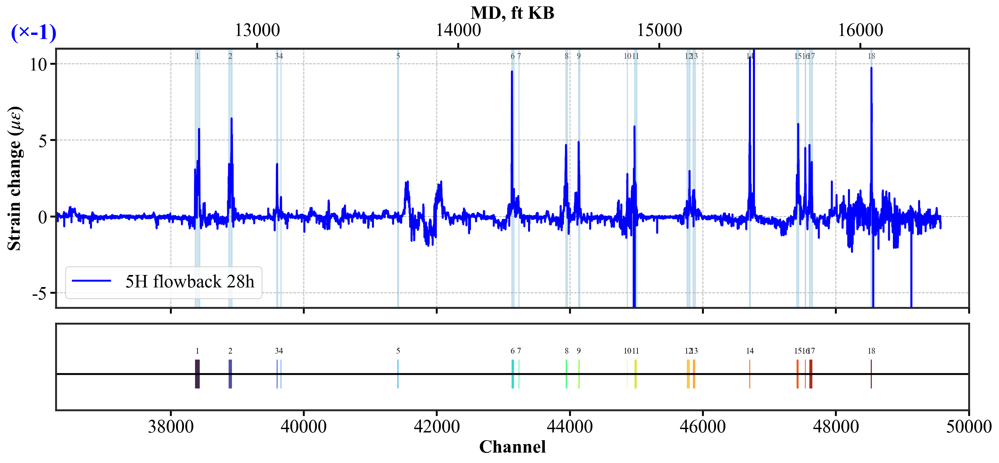

: 

In [ ]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex

# =======================
# 1) Read HDF5
# =======================
f1 = h5py.File(
    r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5',
    'r'
)

dstrain = f1['strain_corrected'][...]   # (time, depth_index)
depth   = np.asarray(f1['depth'][...])  # (ndepth,)
stamps  = f1['stamps']

print("dstrain shape:", dstrain.shape)

stamps_idx = decode_stamps_to_datetimeindex(stamps, fmt='%m/%d/%Y %H:%M:%S.%f')

# =======================
# 2) Depth window (MD range you want to show as ticks)
# =======================
depth_min = 12000
depth_max = 16400
depth_mask = (depth >= depth_min) & (depth <= depth_max)
depth_window = depth[depth_mask]

# =======================
# 3) Times -> P1..Pn
# =======================
start_time = datetime.datetime(2022, 6, 2, 8, 0)
test_time = [start_time + datetime.timedelta(hours=h) for h in [0, 4, 8, 12, 24, 28]]
point_labels = [f"P{i+1}" for i in range(len(test_time))]
points_target = dict(zip(point_labels, test_time))

# =======================
# 4) Nearest time index
# =======================
def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())

point_indices = {}
for label, t_target in points_target.items():
    point_indices[label] = find_nearest_time_index(stamps_idx, pd.to_datetime(t_target))

# =======================
# 5) Extract profiles at each Pi (within depth window)
# =======================
profiles = {}
for label in point_labels:
    i = point_indices[label]
    profiles[label] = dstrain[i, depth_mask]

# =======================
# 6) Your outputs (example: output5)
# =======================
output1 = -1*(profiles["P2"] - profiles["P1"])
output2 = -1*(profiles["P3"] - profiles["P1"])
output3 = -1*(profiles["P4"] - profiles["P1"])
output4 = -1*(profiles["P5"] - profiles["P1"])
output5 = -1*(profiles["P6"] - profiles["P1"])


outputs = {
    "5H flowback 28h": output5,
    # "5H flowback 24h": output4,
    # "5H flowback 12h": output3,
    # "5H flowback 8h": output2,
    # "5H flowback 4h": output1,
}

default_style = {"linewidth": 2, "alpha": 1, "linestyle": "-", "color": "#0000FF"}

# =======================
# 7) Response intervals (CHANNEL ranges)
# =======================
resp_intervals = [
    (38364,38434),
    (38869,38922),
    (39593,39605),
    (39653,39659),
    (41410,41422),
    (43122,43159),
    (43230,43236),
    (43934,43962),
    (44126,44146),
    (44858,44866),
    (44970,45004),
    (45756,45804),
    (45848,45886),
    (46696,46710),
    (47410,47440),
    (47534,47546),
    (47600,47644),
    (48522,48540),
]
total = (36276, 50000)
L, R = total

# =======================
# 8) Channel system (depth[i] <-> channel i)
# =======================
channel = np.arange(len(depth))
channel_window = channel[depth_mask]

# (Optional) sanity check for interpolation
if np.any(np.diff(depth) <= 0):
    print("Warning: depth is not strictly increasing with channel. MD<->channel tick mapping may be ambiguous.")

def chan_to_md(x_chan):
    return np.interp(x_chan, channel, depth)

def md_to_chan(x_md):
    return np.interp(x_md, depth, channel)

# =======================
# 9) Create stacked figure (shared x = channel)
# =======================
fig, (ax1, ax2) = plt.subplots(
    2, 1,
    figsize=(15, 7),
    sharex=True,
    gridspec_kw={"height_ratios": [3, 1]}
)

# =======================
# 10) TOP: uniform translucent highlight bands (same color for all intervals)
# =======================
highlight_color = "#9ecae1"  # light blue
highlight_alpha = 0.50

for (a, b) in resp_intervals:
    ax1.axvspan(a, b, color=highlight_color, alpha=highlight_alpha, zorder=0)

# =======================
# 11) TOP: strain curves
# =======================
for name, arr in outputs.items():
    if arr.shape != depth_window.shape:
        print(f"skip {name}: shape mismatch {arr.shape} vs {depth_window.shape}")
        continue
    ax1.plot(channel_window, arr, label=name, **default_style, zorder=2)

ax1.set_ylabel(r"Strain change ($\mu\varepsilon$)")
ax1.set_ylim(-6, 11)
ax1.set_yticks(np.arange(-5, 10.1, 5))
ax1.grid(True, linestyle="--", zorder=1)
ax1.legend(loc="lower left")

ax1.text(
    -0.05, 1.02, "(×-1)",
    transform=ax1.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color="#0000FF"
)

# =======================
# 12) BOTTOM: interval bars (keep colored), + auto numbering
# =======================
ax2.hlines(0, L, R, linewidth=2)

cmap = plt.get_cmap("turbo")
colors = cmap(np.linspace(0, 1, len(resp_intervals)))

band_height = 0.40
y0 = -band_height / 2

for k, ((a, b), c) in enumerate(zip(resp_intervals, colors), start=1):
    width = max(b - a, 8)
    ax2.broken_barh([(a, width)], (y0, band_height), facecolors=c, alpha=0.90)

    # number label on the interval bar (bottom)
    mid = 0.5 * (a + b)
    ax2.text(mid, y0 + band_height + 0.06, f"{k}",
             ha="center", va="bottom", fontsize=9)

ax2.set_ylim(-0.5, 0.7)
ax2.set_yticks([])

# bottom x-axis: show channel
ax2.set_xlabel("Channel")
step = 2000
ch_ticks = np.arange((L // step) * step, R + 1, step)
ax2.set_xticks(ch_ticks)

# =======================
# 13) TOP secondary x-axis: show MD on top (ticks in MD, mapped via depth<->channel)
# =======================
secax = ax1.secondary_xaxis('top', functions=(chan_to_md, md_to_chan))
secax.set_xlabel("MD, ft KB")

md_ticks = np.arange(depth_min, depth_max + 1, 1000)
secax.set_xticks(md_ticks)
secax.set_xticklabels([f"{int(m)}" for m in md_ticks])

# =======================
# 14) Sync interval numbering to TOP (place numbers near the top border)
# =======================
# Put labels inside the top axes, very close to the top border.
# Using x in data coords (channel), y in axes fraction.
for k, (a, b) in enumerate(resp_intervals, start=1):
    mid = 0.5 * (a + b)
    ax1.text(mid, 0.985, f"{k}",
             transform=ax1.get_xaxis_transform(),
             ha="center", va="top", fontsize=9, color="0.25")

# =======================
# 15) Limits (use the bottom interval total range)
# =======================
ax1.set_xlim(L, R)

# =======================
# 16) Spines: show full box (including top/right) on both axes + top sec axis
# =======================
for ax in (ax1, ax2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(2)

secax.spines["top"].set_visible(True)
secax.spines["top"].set_linewidth(2)

plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.show()

# EVO 5

(<Figure size 1500x400 with 1 Axes>,
 <Axes: >,
 [(36491.0, 36499.0),
  (38366.0, 38463.0),
  (38879.0, 38963.0),
  (41231.0, 41258.0),
  (41531.0, 41591.0),
  (42035.0, 42105.0),
  (43087.0, 43107.0),
  (43128.0, 43180.0),
  (43927.0, 43976.0),
  (44091.0, 44120.0),
  (44138.0, 44161.0),
  (44869.0, 44895.0),
  (44941.0, 45025.0),
  (45739.0, 45754.0),
  (45767.0, 45778.0),
  (45805.0, 45827.0),
  (45859.0, 45912.0),
  (45941.0, 45947.0),
  (45983.0, 45987.0),
  (46706.0, 46784.0),
  (47395.0, 47495.0),
  (47533.0, 47560.0),
  (47611.0, 47625.0),
  (47649.0, 47659.0),
  (48265.0, 48275.0),
  (48531.0, 48562.0),
  (48583.0, 48586.0),
  (48909.0, 48932.0),
  (49753.0, 49763.0),
  (49871.0, 49939.0)])

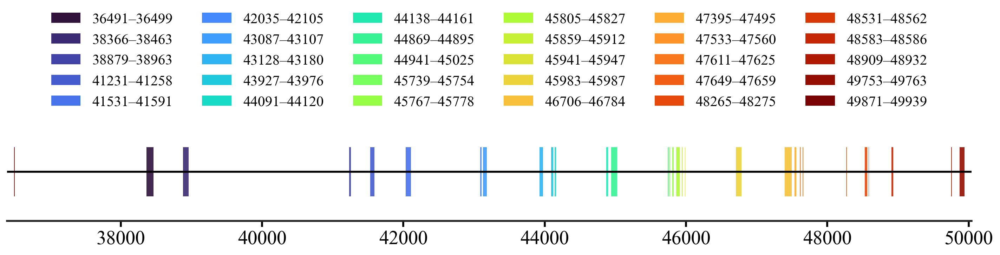

In [15]:
# ======= 示例 =======
from pickle import TRUE


total = (36391, 50038)
resp_intervals = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3   with slippage
    (41231,41258), #4   
    (41531,41591), #5   (only have response after chock)  
    (42035,42105), #6
    (43087,43107), #7
    (43128,43180), #8
    # (43217,43251), #9
    (43927,43976),  #10
    (44091,44120),  #11
    (44138,44161),  #12   #with slippage but not during 5H POP
    (44869,44895),  #13
    (44941,45025),  #14
    (45739,45754),  #15
    (45767,45778),  #16
    (45805,45827),  #17
    (45859,45912),  #18
    (45941,45947),  #19  #weak 
    (45983,45987),  #20  #weak but strong during other treatment
    (46706,46784),  #21
    (47395,47495),  #22
    (47533,47560),  #23
    (47611,47625),  #24
    (47649,47659),  #25  #not good behavior during 5H POP (only have response after chock)
    (48265,48275),  #26
    (48531,48562),  #27  #slippage in some channels
    (48583,48586),  #28  #not strong
    (48909,48932),  #29
    (49753,49763),  #30  #not good behavior during 5H POP (only have response after chock)
    (49871,49939),  #31

]

plot_response_intervals(
    total, resp_intervals,
    figsize=(15, 4),
    merge=False,          # 如果你想“每段都不同颜色”，建议先别 merge
    normalize=False,
    show_labels=False,
    show_legend=TRUE    ,    # 区间多的话 legend 会很挤
    cmap_name="turbo",    # 区间>20时可换 "hsv" 或 "turbo"
    # title="Fracture-response intervals (strain change)"
)

In [16]:
print("len(resp_intervals) =", len(resp_intervals))

len(resp_intervals) = 30


In [17]:
lengths = [(a, b, b-a) for (a, b) in resp_intervals]
lengths_sorted = sorted(lengths, key=lambda x: x[2])
print("Shortest intervals (a,b,len):")
for x in lengths_sorted[:10]:
    print(x)

Shortest intervals (a,b,len):
(48583, 48586, 3)
(45983, 45987, 4)
(45941, 45947, 6)
(36491, 36499, 8)
(47649, 47659, 10)
(48265, 48275, 10)
(49753, 49763, 10)
(45767, 45778, 11)
(47611, 47625, 14)
(45739, 45754, 15)


(<Figure size 1500x400 with 1 Axes>,
 <Axes: >,
 [(36491.0, 36499.0),
  (38366.0, 38463.0),
  (38879.0, 38963.0),
  (41231.0, 41258.0),
  (41531.0, 41591.0),
  (42035.0, 42105.0),
  (43087.0, 43107.0),
  (43128.0, 43180.0),
  (43927.0, 43976.0),
  (44091.0, 44120.0),
  (44138.0, 44161.0),
  (44869.0, 44895.0),
  (44941.0, 45025.0),
  (45739.0, 45754.0),
  (45767.0, 45778.0),
  (45805.0, 45827.0),
  (45859.0, 45912.0),
  (45941.0, 45947.0),
  (45983.0, 45987.0),
  (46706.0, 46784.0),
  (47395.0, 47495.0),
  (47533.0, 47560.0),
  (47611.0, 47625.0),
  (47649.0, 47659.0),
  (48265.0, 48275.0),
  (48531.0, 48562.0),
  (48583.0, 48586.0),
  (48909.0, 48932.0),
  (49753.0, 49763.0),
  (49871.0, 49939.0)])

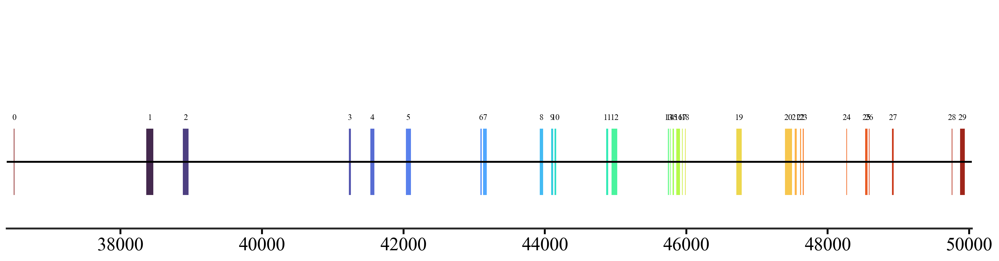

In [18]:
plot_response_intervals(
    total, resp_intervals,
    figsize=(15, 4),
    merge=False,
    normalize=False,
    show_labels=True,     # <-- 临时打开
    show_legend=False,    # <-- 关掉 legend 避免挤
    cmap_name="turbo",
)

## show channels

(<Figure size 1500x400 with 1 Axes>,
 <Axes: >,
 [(36491.0, 36499.0),
  (38366.0, 38463.0),
  (38879.0, 38963.0),
  (41231.0, 41258.0),
  (41531.0, 41591.0),
  (42035.0, 42105.0),
  (43087.0, 43107.0),
  (43128.0, 43180.0),
  (43927.0, 43976.0),
  (44091.0, 44120.0),
  (44138.0, 44161.0),
  (44869.0, 44895.0),
  (44941.0, 45025.0),
  (45739.0, 45754.0),
  (45767.0, 45778.0),
  (45805.0, 45827.0),
  (45859.0, 45912.0),
  (45941.0, 45947.0),
  (45983.0, 45987.0),
  (46706.0, 46784.0),
  (47395.0, 47495.0),
  (47533.0, 47560.0),
  (47611.0, 47625.0),
  (47649.0, 47659.0),
  (48265.0, 48275.0),
  (48531.0, 48562.0),
  (48583.0, 48586.0),
  (48909.0, 48932.0),
  (49753.0, 49763.0),
  (49871.0, 49939.0)])

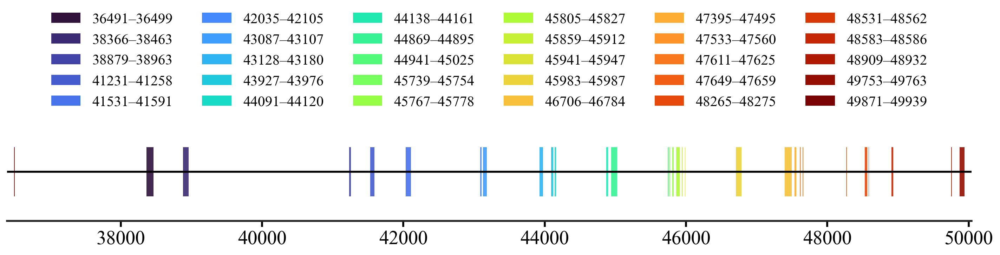

In [19]:
# ======= 示例 =======
from pickle import TRUE


total = (36391, 50038)
resp_intervals = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3   with slippage
    (41231,41258), #4   
    (41531,41591), #5   (only have response after chock)  
    (42035,42105), #6
    (43087,43107), #7
    (43128,43180), #8
    # (43217,43251), #9
    (43927,43976),  #10
    (44091,44120),  #11
    (44138,44161),  #12   #with slippage but not during 5H POP
    (44869,44895),  #13
    (44941,45025),  #14
    (45739,45754),  #15
    (45767,45778),  #16
    (45805,45827),  #17
    (45859,45912),  #18
    (45941,45947),  #19  #weak 
    (45983,45987),  #20  #weak but strong during other treatment
    (46706,46784),  #21
    (47395,47495),  #22
    (47533,47560),  #23
    (47611,47625),  #24
    (47649,47659),  #25  #not good behavior during 5H POP (only have response after chock)
    (48265,48275),  #26
    (48531,48562),  #27  #slippage in some channels
    (48583,48586),  #28  #not strong
    (48909,48932),  #29
    (49753,49763),  #30  #not good behavior during 5H POP (only have response after chock)
    (49871,49939),  #31

]

plot_response_intervals(
    total, resp_intervals,
    figsize=(15, 4),
    merge=False,          # 如果你想“每段都不同颜色”，建议先别 merge
    normalize=False,
    show_labels=False,
    show_legend=TRUE    ,    # 区间多的话 legend 会很挤
    cmap_name="turbo",    # 区间>20时可换 "hsv" 或 "turbo"
    # title="Fracture-response intervals (strain change)"
)

In [20]:
len(resp_intervals)

30

## show both channels and strain change

### V2

dstrain shape: (7008, 57218)


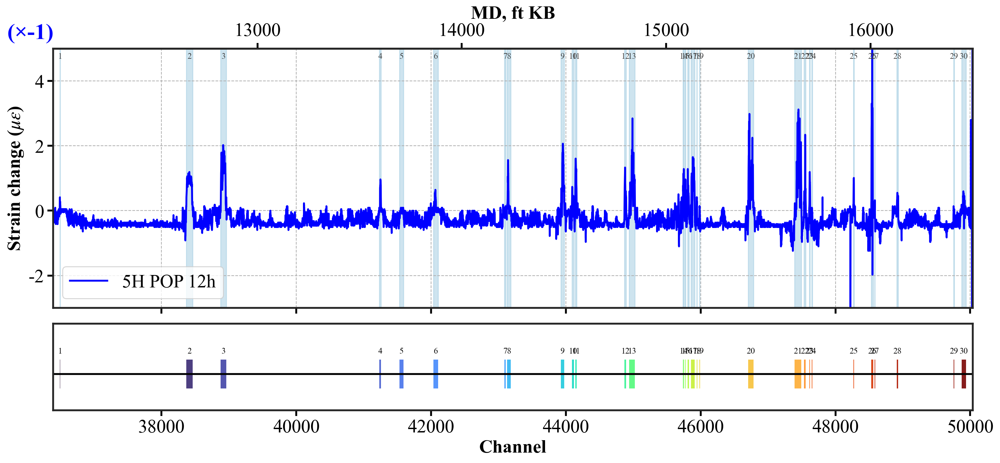

In [24]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex

# =======================
# 1) Read HDF5
# =======================
f1 = h5py.File(
    r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5',
    'r'


)

dstrain = f1['data'][...]   # (time, depth_index)
depth   = np.asarray(f1['depth'][...])  # (ndepth,)
stamps  = f1['stamps']

print("dstrain shape:", dstrain.shape)

stamps_idx = decode_stamps_to_datetimeindex(stamps, fmt='%m/%d/%Y %H:%M:%S.%f')

# =======================
# 2) Depth window (MD range you want to show as ticks)
# =======================
depth_min = 12000
depth_max = 16500
depth_mask = (depth >= depth_min) & (depth <= depth_max)
depth_window = depth[depth_mask]

# =======================
# 3) Times -> P1..Pn
# =======================
start_time = datetime.datetime(2022, 3, 15, 9, 0)
test_time = [start_time + datetime.timedelta(hours=h) for h in [0, 12]]
point_labels = [f"P{i+1}" for i in range(len(test_time))]
points_target = dict(zip(point_labels, test_time))

# =======================
# 4) Nearest time index
# =======================
def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())

point_indices = {}
for label, t_target in points_target.items():
    point_indices[label] = find_nearest_time_index(stamps_idx, pd.to_datetime(t_target))

# =======================
# 5) Extract profiles at each Pi (within depth window)
# =======================
profiles = {}
for label in point_labels:
    i = point_indices[label]
    profiles[label] = dstrain[i, depth_mask]

# =======================
# 6) Your outputs (example: output5)
# =======================
output1 = -1*(profiles["P2"] - profiles["P1"])
# output2 = -1*(profiles["P3"] - profiles["P1"])
# output3 = -1*(profiles["P4"] - profiles["P1"])
# output4 = -1*(profiles["P5"] - profiles["P1"])
# output5 = -1*(profiles["P6"] - profiles["P1"])


outputs = {

    "5H POP 12h": output1,

}

default_style = {"linewidth": 2, "alpha": 1, "linestyle": "-", "color": "#0000FF"}

# =======================
# 7) Response intervals (CHANNEL ranges)
# =======================



resp_intervals = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3   with slippage
    (41231,41258), #4   
    (41531,41591), #5   (only have response after chock)  
    (42035,42105), #6
    (43087,43107), #7
    (43128,43180), #8
    # (43217,43251), #9
    (43927,43976),  #10
    (44091,44120),  #11
    (44138,44161),  #12   #with slippage but not during 5H POP
    (44869,44895),  #13
    (44941,45025),  #14
    (45739,45754),  #15
    (45767,45778),  #16
    (45805,45827),  #17
    (45859,45912),  #18
    (45941,45947),  #19  #weak 
    (45983,45987),  #20  #weak but strong during other treatment
    (46706,46784),  #21
    (47395,47495),  #22
    (47533,47560),  #23
    (47611,47625),  #24
    (47649,47659),  #25  #not good behavior during 5H POP (only have response after chock)
    (48265,48275),  #26
    (48531,48562),  #27  #slippage in some channels
    (48583,48586),  #28  #not strong
    (48909,48932),  #29
    (49753,49763),  #30  #not good behavior during 5H POP (only have response after chock)
    (49871,49939),  #31

]


total = (36391, 50038)
L, R = total

# =======================
# 8) Channel system (depth[i] <-> channel i)
# =======================
channel = np.arange(len(depth))
channel_window = channel[depth_mask]

# (Optional) sanity check for interpolation
if np.any(np.diff(depth) <= 0):
    print("Warning: depth is not strictly increasing with channel. MD<->channel tick mapping may be ambiguous.")

def chan_to_md(x_chan):
    return np.interp(x_chan, channel, depth)

def md_to_chan(x_md):
    return np.interp(x_md, depth, channel)

# =======================
# 9) Create stacked figure (shared x = channel)
# =======================
fig, (ax1, ax2) = plt.subplots(
    2, 1,
    figsize=(15, 7),
    sharex=True,
    gridspec_kw={"height_ratios": [3, 1]}
)

# =======================
# 10) TOP: uniform translucent highlight bands (same color for all intervals)
# =======================
highlight_color = "#9ecae1"  # light blue
highlight_alpha = 0.50

for (a, b) in resp_intervals:
    ax1.axvspan(a, b, color=highlight_color, alpha=highlight_alpha, zorder=0)

# =======================
# 11) TOP: strain curves
# =======================
for name, arr in outputs.items():
    if arr.shape != depth_window.shape:
        print(f"skip {name}: shape mismatch {arr.shape} vs {depth_window.shape}")
        continue
    ax1.plot(channel_window, arr, label=name, **default_style, zorder=2)

ax1.set_ylabel(r"Strain change ($\mu\varepsilon$)")
ax1.set_ylim(-3, 5)
ax1.set_yticks(np.arange(-2, 6, 2))
ax1.grid(True, linestyle="--", zorder=1)
ax1.legend(loc="lower left")

ax1.text(
    -0.05, 1.02, "(×-1)",
    transform=ax1.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color="#0000FF"
)

# =======================
# 12) BOTTOM: interval bars (keep colored), + auto numbering
# =======================
ax2.hlines(0, L, R, linewidth=2)

cmap = plt.get_cmap("turbo")
colors = cmap(np.linspace(0, 1, len(resp_intervals)))

band_height = 0.40
y0 = -band_height / 2

for k, ((a, b), c) in enumerate(zip(resp_intervals, colors), start=1):
    width = max(b - a, 8)
    ax2.broken_barh([(a, width)], (y0, band_height), facecolors=c, alpha=0.90)

    # number label on the interval bar (bottom)
    mid = 0.5 * (a + b)
    ax2.text(mid, y0 + band_height + 0.06, f"{k}",
             ha="center", va="bottom", fontsize=9)

ax2.set_ylim(-0.5, 0.7)
ax2.set_yticks([])

# bottom x-axis: show channel
ax2.set_xlabel("Channel")
step = 2000
ch_ticks = np.arange((L // step) * step, R + 1, step)
ax2.set_xticks(ch_ticks)

# =======================
# 13) TOP secondary x-axis: show MD on top (ticks in MD, mapped via depth<->channel)
# =======================
secax = ax1.secondary_xaxis('top', functions=(chan_to_md, md_to_chan))
secax.set_xlabel("MD, ft KB")

md_ticks = np.arange(depth_min, depth_max + 1, 1000)
secax.set_xticks(md_ticks)
secax.set_xticklabels([f"{int(m)}" for m in md_ticks])

# =======================
# 14) Sync interval numbering to TOP (place numbers near the top border)
# =======================
# Put labels inside the top axes, very close to the top border.
# Using x in data coords (channel), y in axes fraction.
for k, (a, b) in enumerate(resp_intervals, start=1):
    mid = 0.5 * (a + b)
    ax1.text(mid, 0.985, f"{k}",
             transform=ax1.get_xaxis_transform(),
             ha="center", va="top", fontsize=9, color="0.25")

# =======================
# 15) Limits (use the bottom interval total range)
# =======================
ax1.set_xlim(L, R)

# =======================
# 16) Spines: show full box (including top/right) on both axes + top sec axis
# =======================
for ax in (ax1, ax2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(2)

secax.spines["top"].set_visible(True)
secax.spines["top"].set_linewidth(2)

plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.show()

# calibration

## V1

In [1]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'
EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration for Evo7 (piecewise linear shift)
#    Rule you gave:
#    at 12000 ft: Evo7 depth -40 ft = Evo5 depth (raw)
#    at 16000 ft: Evo7 depth -45 ft = Evo5 depth (raw)
#    others linearly interpolated
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift  # calibrated depth


def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())


def channel_to_md_map(depth_arr):
    """depth[i] <-> channel i mapping helpers for np.interp."""
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))
    if np.any(np.diff(depth_arr) <= 0):
        print("Warning: depth is not strictly increasing with channel. MD<->channel mapping may be ambiguous.")
    def chan_to_md(x_chan):
        return np.interp(x_chan, ch, depth_arr)
    def md_to_chan(x_md):
        return np.interp(x_md, depth_arr, ch)
    return chan_to_md, md_to_chan


def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    """Convert (ch_a, ch_b) to (md_a, md_b) using depth_arr (already calibrated if needed)."""
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a); b = float(b)
        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))
        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)
        if hi > lo:
            out.append((lo, hi))
    return out


def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)


# =========================================================
# 2) EVO5 settings (from your code)
# =========================================================
EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 12]   # P1, P2
EVO5_LABEL = "5H POP 12h"
EVO5_YLIM = (-3, 5)
EVO5_YTICKS = np.arange(-2, 6, 2)

RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    (41531,41591), #5
    (42035,42105), #6
    (43087,43107), #7
    (43128,43180), #8
    (43927,43976), #10
    (44091,44120), #11
    (44138,44161), #12
    (44869,44895), #13
    (44941,45025), #14
    (45739,45754), #15
    (45767,45778), #16
    (45805,45827), #17
    (45859,45912), #18
    (45941,45947), #19
    (45983,45987), #20
    (46706,46784), #21
    (47395,47495), #22
    (47533,47560), #23
    (47611,47625), #24
    (47649,47659), #25
    (48265,48275), #26
    (48531,48562), #27
    (48583,48586), #28
    (48909,48932), #29
    (49753,49763), #30
    (49871,49939), #31
]
TOTAL_EVO5 = (36391, 50038)


# =========================================================
# 3) EVO7 settings (from your code)
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0, 4, 8, 12, 24, 28]  # P1..P6
EVO7_LABEL = "5H flowback 28h"
EVO7_YLIM = (-6, 11)
EVO7_YTICKS = np.arange(-5, 10.1, 5)

RESP_INTERVALS_EVO7 = [
    (38364,38434),
    (38869,38922),
    (39593,39605),
    (39653,39659),
    (41410,41422),
    (43122,43159),
    (43230,43236),
    (43934,43962),
    (44126,44146),
    (44858,44866),
    (44970,45004),
    (45756,45804),
    (45848,45886),
    (46696,46710),
    (47410,47440),
    (47534,47546),
    (47600,47644),
    (48522,48540),
]
TOTAL_EVO7 = (36276, 50000)


# =========================================================
# 4) Shared styles (match your scripts)
# =========================================================
default_style = {"linewidth": 2, "alpha": 1, "linestyle": "-", "color": "#0000FF"}

highlight_color = "#9ecae1"
highlight_alpha = 0.50

interval_cmap_name = "turbo"
band_height = 0.22
y0 = -band_height / 2


# =========================================================
# 5) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

# depth window mask (Evo5 raw depth)
mask5 = (depth5 >= EVO5_DEPTH_MIN) & (depth5 <= EVO5_DEPTH_MAX)
depth5_win = depth5[mask5]

# find time indices
test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

# output1 = -1*(P2 - P1)
out5 = -1 * (profiles5["P2"] - profiles5["P1"])

# convert Evo5 intervals (channel -> MD using Evo5 raw depth)
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, EVO5_DEPTH_MIN, EVO5_DEPTH_MAX)


# =========================================================
# 6) Load EVO7 + apply MD calibration to depth
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

# apply MD calibration
depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0)

# depth window mask (Evo7 calibrated depth!)
# 为了和 Evo5 对齐显示，这里直接用 Evo5 的 MD_MAX=16500 作为共享窗口上限
MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

# find time indices
test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

# output5 = -1*(P6 - P1)
out7 = -1 * (profiles7["P6"] - profiles7["P1"])

# convert Evo7 intervals (channel -> MD using Evo7 CALIBRATED depth!)
intervals7_md = intervals_channel_to_md(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)






[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


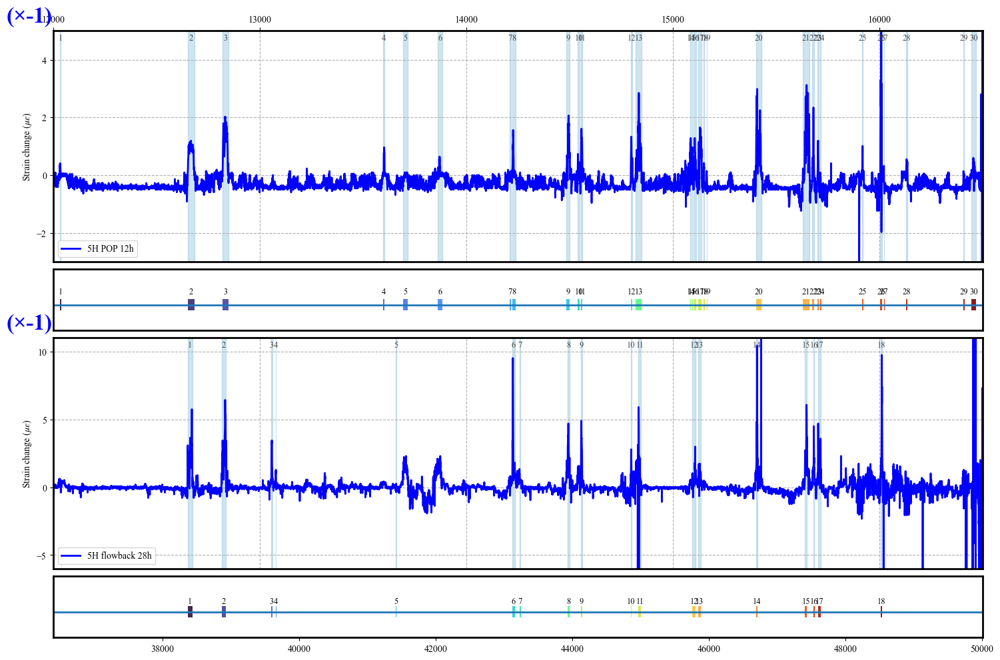

In [2]:

# =========================================================
# 7) Plot 4 rows in one column (shared x = MD)
#    Row1: Evo5 strain (MD shown on TOP)
#    Row2: Evo5 intervals (Channel shown on BOTTOM as secondary axis)
#    Row3: Evo7 strain (after MD calibration, MD shown on TOP)
#    Row4: Evo7 intervals (after MD calibration, Channel shown on BOTTOM)
# =========================================================

# =========================================================
# 7) Plot 4 rows in one column (shared x = MD)
# =========================================================
fig, axes = plt.subplots(
    4, 1,
    figsize=(15, 10),
    sharex=True,
    gridspec_kw={"height_ratios": [3, 0.8, 3, 0.8]}
)

ax5_str, ax5_int, ax7_str, ax7_int = axes


# ---------- Row1: Evo5 strain ----------
for (a, b) in intervals5_md:
    ax5_str.axvspan(a, b, color=highlight_color, alpha=highlight_alpha, zorder=0)

ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **default_style, zorder=2)
ax5_str.set_ylabel(r"Strain change ($\mu\varepsilon$)")
ax5_str.set_ylim(*EVO5_YLIM)
ax5_str.set_yticks(EVO5_YTICKS)
ax5_str.grid(True, linestyle="--", zorder=1)
ax5_str.legend(loc="lower left")

ax5_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax5_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color="#0000FF"
)

ax5_str.tick_params(axis="x", top=True, labeltop=True, bottom=False, labelbottom=False)
ax5_str.xaxis.set_label_position("top")
# ax5_str.set_xlabel("MD, ft KB")


for k, (a, b) in enumerate(intervals5_md, start=1):
    mid = 0.5 * (a + b)
    ax5_str.text(mid, 0.985, f"{k}",
                 transform=ax5_str.get_xaxis_transform(),
                 ha="center", va="top", fontsize=9, color="0.25")


# ---------- Row2: Evo5 intervals ----------
ax5_int.hlines(0, MD_MIN, MD_MAX, linewidth=2)

cmap = plt.get_cmap(interval_cmap_name)
colors5 = cmap(np.linspace(0, 1, len(intervals5_md)))

for k, ((a, b), c) in enumerate(zip(intervals5_md, colors5), start=1):
    w = max(b - a, 5.0)
    ax5_int.broken_barh([(a, w)], (y0, band_height), facecolors=c, alpha=0.90)
    ax5_int.text(0.5 * (a + b), y0 + band_height + 0.06, f"{k}",
                 ha="center", va="bottom", fontsize=9)

ax5_int.set_ylim(-0.5, 0.7)
ax5_int.set_yticks([])

ax5_int.tick_params(axis="x", bottom=False, labelbottom=False, top=False, labeltop=False)

chan_to_md5, md_to_chan5 = channel_to_md_map(depth5)
sec5 = ax5_int.secondary_xaxis('bottom', functions=(md_to_chan5, chan_to_md5))
# sec5.set_xlabel("Channel")

step = 2000
sec5.set_xticks(np.arange((TOTAL_EVO5[0] // step) * step, TOTAL_EVO5[1] + 1, step))
sec5.set_xticks([])  # hide secondary x-ticks (MD) on the interval row

# ---------- Row3: Evo7 strain ----------
for (a, b) in intervals7_md:
    ax7_str.axvspan(a, b, color=highlight_color, alpha=highlight_alpha, zorder=0)

ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **default_style, zorder=2)
ax7_str.set_ylabel(r"Strain change ($\mu\varepsilon$)")
ax7_str.set_ylim(*EVO7_YLIM)
ax7_str.set_yticks(EVO7_YTICKS)
ax7_str.grid(True, linestyle="--", zorder=1)
ax7_str.legend(loc="lower left")

ax7_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax7_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color="#0000FF"
)

ax7_str.tick_params(axis="x", top=False, labeltop=False, bottom=False, labelbottom=False)
ax7_str.xaxis.set_label_position("top")
# ax7_str.set_xlabel("MD, ft KB")

for k, (a, b) in enumerate(intervals7_md, start=1):
    mid = 0.5 * (a + b)
    ax7_str.text(mid, 0.985, f"{k}",
                 transform=ax7_str.get_xaxis_transform(),
                 ha="center", va="top", fontsize=9, color="0.25")


# ---------- Row4: Evo7 intervals ----------
ax7_int.hlines(0, MD_MIN, MD_MAX, linewidth=2)

colors7 = cmap(np.linspace(0, 1, len(intervals7_md)))

for k, ((a, b), c) in enumerate(zip(intervals7_md, colors7), start=1):
    w = max(b - a, 5.0)
    ax7_int.broken_barh([(a, w)], (y0, band_height), facecolors=c, alpha=0.90)
    ax7_int.text(0.5 * (a + b), y0 + band_height + 0.01, f"{k}",
                 ha="center", va="bottom", fontsize=9)

ax7_int.set_ylim(-0.5, 0.7)
ax7_int.set_yticks([])

ax7_int.tick_params(axis="x", bottom=False, labelbottom=False, top=False, labeltop=False)

chan_to_md7, md_to_chan7 = channel_to_md_map(depth7)
sec7 = ax7_int.secondary_xaxis('bottom', functions=(md_to_chan7, chan_to_md7))
# sec7.set_xlabel("Channel")
sec7.set_xticks(np.arange((TOTAL_EVO7[0] // step) * step, TOTAL_EVO7[1] + 1, step))


# ---------- Shared settings ----------
for ax in axes:
    ax.set_xlim(MD_MIN, MD_MAX)
    style_full_box(ax, lw=2)

md_ticks = np.arange(int(MD_MIN), int(MD_MAX) + 1, 1000)
ax5_str.set_xticks(md_ticks)
ax7_str.set_xticks(md_ticks)

# 关键：减小行距
plt.tight_layout()
plt.subplots_adjust(hspace=0.05)


plt.show()


## V2

[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


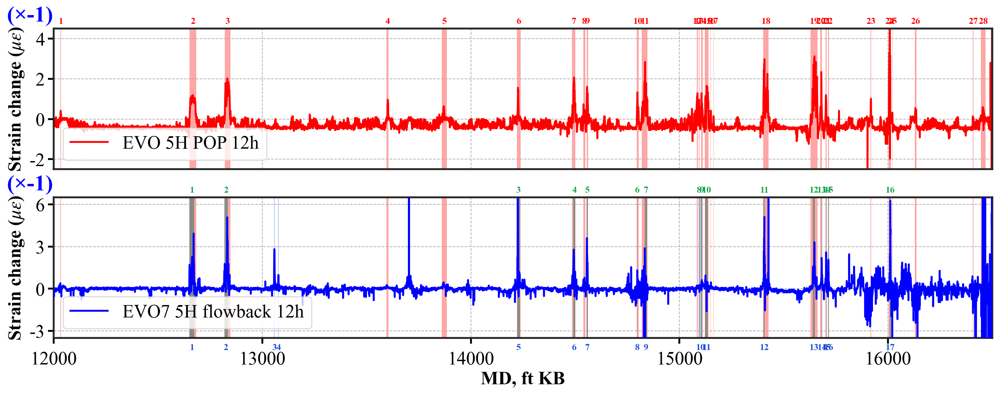

In [ ]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'
EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration for Evo7
#    12000 ft: Evo7 depth -40 ft = Evo5 depth(raw)
#    16000 ft: Evo7 depth -45 ft = Evo5 depth(raw)
#    others linearly interpolated
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift

def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())

def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    """
    Convert channel intervals -> MD intervals using depth_arr
    depth_arr should already be calibrated if needed.
    """
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi))

    return out

def merge_intervals(intervals):
    if not intervals:
        return []

    intervals = sorted(intervals, key=lambda x: (x[0], x[1]))
    merged = [list(intervals[0])]

    for a, b in intervals[1:]:
        if a <= merged[-1][1]:
            merged[-1][1] = max(merged[-1][1], b)
        else:
            merged.append([a, b])

    return [tuple(x) for x in merged]

def intersect_intervals(intervals_a, intervals_b):
    """
    Return intersections between two interval lists.
    """
    A = merge_intervals(intervals_a)
    B = merge_intervals(intervals_b)

    i, j = 0, 0
    out = []

    while i < len(A) and j < len(B):
        a1, a2 = A[i]
        b1, b2 = B[j]

        lo = max(a1, b1)
        hi = min(a2, b2)

        if hi > lo:
            out.append((lo, hi))

        if a2 < b2:
            i += 1
        else:
            j += 1

    return merge_intervals(out)

def subtract_intervals(base_intervals, cut_intervals):
    """
    base - cut
    """
    base = merge_intervals(base_intervals)
    cut  = merge_intervals(cut_intervals)

    out = []

    for a, b in base:
        curr_segments = [(a, b)]

        for c, d in cut:
            new_segments = []

            for x, y in curr_segments:
                if d <= x or c >= y:
                    new_segments.append((x, y))
                else:
                    if c > x:
                        new_segments.append((x, c))
                    if d < y:
                        new_segments.append((d, y))

            curr_segments = new_segments

            if not curr_segments:
                break

        out.extend(curr_segments)

    return merge_intervals(out)

def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)

def add_span(ax, a, b, color, alpha=0.35, zorder=0):
    ax.axvspan(
        a, b,
        facecolor=color,
        edgecolor='none',
        linewidth=0,
        antialiased=False,
        alpha=alpha,
        zorder=zorder
    )

def add_interval_labels(ax, intervals, color, y_axes, fontsize=10):
    """
    在指定轴上，按 x=data 坐标、y=axes fraction 坐标写编号
    y_axes:
        >1   -> 轴上方
        0~1  -> 轴内部
        <0   -> 轴下方
    """
    for k, (a, b) in enumerate(intervals, start=1):
        mid = 0.5 * (a + b)
        ax.text(
            mid, y_axes, f"{k}",
            transform=ax.get_xaxis_transform(),
            ha="center", va="center",
            fontsize=fontsize,
            color=color,
            fontweight="bold",
            clip_on=False
        )

# =========================================================
# 2) EVO5 settings
# =========================================================
EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 12]
EVO5_LABEL = "EVO 5H POP 12h"
EVO5_YLIM = (-2.5, 4.5)
EVO5_YTICKS = np.arange(-2, 5, 2)


RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    # (41531,41591), #5     not good behavior when marked the peak
    (42035,42105), #6
    # (43087,43107), #7     not good behavior when marked the peak
    (43128,43180), #8
    (43927,43976), #9
    (44091,44120), #10
    (44138,44161), #11
    (44869,44895), #12
    (44941,45025), #13
    (45739,45754), #14
    (45767,45778), #15
    (45805,45827), #16
    (45859,45912), #17
    (45941,45947), #18
    (45983,45987), #19
    (46706,46784), #20
    (47395,47495), #21
    (47533,47560), #22
    (47611,47625), #23
    (47649,47659), #24
    (48265,48275), #25
    (48531,48562), #26
    (48583,48586), #27
    (48909,48932), #28
    (49753,49763), #29
    (49871,49939), #30
]



# =========================================================
# 3) EVO7 settings
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0, 4, 8, 12, 24, 28]
EVO7_LABEL = "EVO7 5H flowback 12h"
EVO7_YLIM = (-3.5, 6.5)
EVO7_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO7 = [
    (38364,38434),  #1
    (38869,38922),  #2
    (39593,39605),  #3  new fracture
    (39653,39659),  #4  new fracture
    # (41410,41422),  #5  small magnitude, delayed response, deleted
    (43122,43159),  #6
    # (43230,43236),  #7  small magnitude, deleted
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    # (45756,45804),  #12 delayed response, deleted
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    # (47600,47644),  #old 17 , separated into 2 
    (47600,47610),  #17a
    (47635,47644),  #17b
    (48522,48540),  #18
]


# =========================================================
# 4) Shared styles
# =========================================================
style_evo5 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "red"
}

style_evo7 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "#0000FF"
}

# 颜色定义
POP_ONLY_COLOR   = "red"
OVERLAP_COLOR    = "#16A34A"
EVO7_ONLY_COLOR  = "#1D4ED8"
HIGHLIGHT_ALPHA  = 0.35


# =========================================================
# 5) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

mask5 = (depth5 >= EVO5_DEPTH_MIN) & (depth5 <= EVO5_DEPTH_MAX)
depth5_win = depth5[mask5]

test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

out5 = -1 * (profiles5["P2"] - profiles5["P1"])


# =========================================================
# 6) Load EVO7 + apply MD calibration
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0)

MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

out7 = -1 * (profiles7["P4"] - profiles7["P1"])


# =========================================================
# 7) Convert intervals to MD
# =========================================================
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals7_md = intervals_channel_to_md(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)

# 做集合运算
overlap_md   = intersect_intervals(intervals5_md, intervals7_md)
pop_only_md  = subtract_intervals(intervals5_md, overlap_md)
evo7_only_md = subtract_intervals(intervals7_md, overlap_md)


# =========================================================
# 8) Plot ONLY 2 rows
#    Row1: EVO5 strain
#    Row2: EVO7 strain
# =========================================================
fig, axes = plt.subplots(
    2, 1,
    figsize=(15, 6),
    sharex=True,
    gridspec_kw={"height_ratios": [1, 1]}
)

ax5_str, ax7_str = axes

# =========================================================
# 9) Row1: EVO5 strain
#    - show ORIGINAL 31 red intervals
#    - label ORIGINAL 31 intervals
# =========================================================
for (a, b) in intervals5_md:
    ax5_str.axvspan(
        a, b,
        facecolor=POP_ONLY_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )

ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **style_evo5, zorder=2)
ax5_str.set_ylabel(r"Strain change ($\mu\varepsilon$)")
ax5_str.set_ylim(*EVO5_YLIM)
ax5_str.set_yticks(EVO5_YTICKS)
ax5_str.grid(True, linestyle="--", zorder=1)
ax5_str.legend(loc="lower left")

ax5_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax5_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color="#0000FF"
)

# 第一张图：完全取消 x 轴
ax5_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

# 红色编号：标原始31个区间
add_interval_labels(ax5_str, intervals5_md, color=POP_ONLY_COLOR, y_axes=1.05, fontsize=10)

# =========================================================
# 10) Row2: EVO7 strain
#     - show ORIGINAL 18 blue intervals, and label them
#     - overlay ORIGINAL 31 red intervals, no labels
#     - overlay overlap as green, and label overlap
# =========================================================

# 先画原始18个蓝色区间
for (a, b) in intervals7_md:
    ax7_str.axvspan(
        a, b,
        facecolor=EVO7_ONLY_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )

# 再叠加原始31个红色区间（不标号）
for (a, b) in intervals5_md:
    ax7_str.axvspan(
        a, b,
        facecolor=POP_ONLY_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=1
    )

# 最后把重合部分盖成绿色
for (a, b) in overlap_md:
    ax7_str.axvspan(
        a, b,
        facecolor=OVERLAP_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=2
    )

ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **style_evo7, zorder=3)
ax7_str.set_ylabel(r"Strain change ($\mu\varepsilon$)")
ax7_str.set_ylim(*EVO7_YLIM)
ax7_str.set_yticks(EVO7_YTICKS)
ax7_str.grid(True, linestyle="--", zorder=1)
ax7_str.legend(loc="lower left")

ax7_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax7_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color="#0000FF"
)

# 第二张图：只保留下方 MD
md_ticks = np.arange(int(MD_MIN), int(MD_MAX) + 1, 1000)
ax7_str.set_xticks(md_ticks)
ax7_str.set_xlabel("MD, ft KB")
ax7_str.tick_params(axis="x", top=False, bottom=True, labeltop=False, labelbottom=True, pad=8)

# 蓝色编号：标原始18个区间
add_interval_labels(ax7_str, intervals7_md, color=EVO7_ONLY_COLOR, y_axes=-0.07, fontsize=10)

# 绿色编号：标重合区间
add_interval_labels(ax7_str, overlap_md, color=OVERLAP_COLOR, y_axes=1.05, fontsize=10)

# =========================================================
# 11) Shared settings
# =========================================================
for ax in axes:
    ax.set_xlim(MD_MIN, MD_MAX)
    style_full_box(ax, lw=2)

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)

plt.show()

f5.close()
f7.close()

## V3

[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


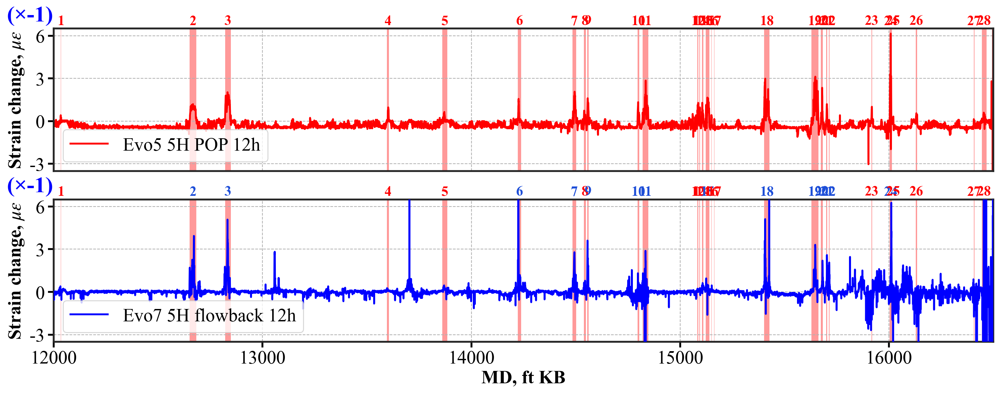

In [54]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'
EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration for Evo7
#    12000 ft: Evo7 depth -40 ft = Evo5 depth(raw)
#    16000 ft: Evo7 depth -45 ft = Evo5 depth(raw)
#    others linearly interpolated
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift

def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())

def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    """
    Convert channel intervals -> MD intervals using depth_arr
    depth_arr should already be calibrated if needed.
    """
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi))

    return out

def merge_intervals(intervals):
    if not intervals:
        return []

    intervals = sorted(intervals, key=lambda x: (x[0], x[1]))
    merged = [list(intervals[0])]

    for a, b in intervals[1:]:
        if a <= merged[-1][1]:
            merged[-1][1] = max(merged[-1][1], b)
        else:
            merged.append([a, b])

    return [tuple(x) for x in merged]

def intersect_intervals(intervals_a, intervals_b):
    """
    Return intersections between two interval lists.
    """
    A = merge_intervals(intervals_a)
    B = merge_intervals(intervals_b)

    i, j = 0, 0
    out = []

    while i < len(A) and j < len(B):
        a1, a2 = A[i]
        b1, b2 = B[j]

        lo = max(a1, b1)
        hi = min(a2, b2)

        if hi > lo:
            out.append((lo, hi))

        if a2 < b2:
            i += 1
        else:
            j += 1

    return merge_intervals(out)

def subtract_intervals(base_intervals, cut_intervals):
    """
    base - cut
    """
    base = merge_intervals(base_intervals)
    cut  = merge_intervals(cut_intervals)

    out = []

    for a, b in base:
        curr_segments = [(a, b)]

        for c, d in cut:
            new_segments = []

            for x, y in curr_segments:
                if d <= x or c >= y:
                    new_segments.append((x, y))
                else:
                    if c > x:
                        new_segments.append((x, c))
                    if d < y:
                        new_segments.append((d, y))

            curr_segments = new_segments

            if not curr_segments:
                break

        out.extend(curr_segments)

    return merge_intervals(out)

def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)

def add_span(ax, a, b, color, alpha=0.35, zorder=0):
    ax.axvspan(
        a, b,
        facecolor=color,
        edgecolor='none',
        linewidth=0,
        antialiased=False,
        alpha=alpha,
        zorder=zorder
    )

def add_interval_labels(ax, intervals, color, y_axes, fontsize=10,
                        special_ids=None, special_color=None):
    """
    special_ids: 需要特殊着色的编号集合，例如 {5, 8, 11, 16}
    special_color: 这些编号使用的颜色
    在指定轴上，按 x=data 坐标、y=axes fraction 坐标写编号
    y_axes:
        >1   -> 轴上方
        0~1  -> 轴内部
        <0   -> 轴下方
    """
    if special_ids is None:
        special_ids = set()

    for k, (a, b) in enumerate(intervals, start=1):
        mid = 0.5 * (a + b)

        this_color = special_color if (k in special_ids and special_color is not None) else color

        ax.text(
            mid, y_axes, f"{k}",
            transform=ax.get_xaxis_transform(),
            ha="center", va="center",
            fontsize=fontsize,
            color=this_color,
            fontweight="bold",
            clip_on=False
        )


# =========================================================
# 2) EVO5 settings
# =========================================================
EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 12]
EVO5_LABEL = "Evo5 5H POP 12h"
EVO5_YLIM = (-3.5, 6.5)
EVO5_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    # (41531,41591), #5     not good behavior when marked the peak
    (42035,42105), #6
    # (43087,43107), #7     not good behavior when marked the peak
    (43128,43180), #8
    (43927,43976), #9
    (44091,44120), #10
    (44138,44161), #11
    (44869,44895), #12
    (44941,45025), #13
    (45739,45754), #14
    (45767,45778), #15
    (45805,45827), #16
    (45859,45912), #17
    (45941,45947), #18
    (45983,45987), #19
    (46706,46784), #20
    (47395,47495), #21
    (47533,47560), #22
    (47611,47625), #23
    (47649,47659), #24
    (48265,48275), #25
    (48531,48562), #26
    (48583,48586), #27
    (48909,48932), #28
    (49753,49763), #29
    (49871,49939), #30
]


# =========================================================
# 3) EVO7 settings
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0, 4, 8, 12, 24, 28]
EVO7_LABEL = "Evo7 5H flowback 12h"
EVO7_YLIM = (-3.5, 6.5)
EVO7_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO7 = [
    (38364,38434),  #1
    (38869,38922),  #2
    (39593,39605),  #3  new fracture
    (39653,39659),  #4  new fracture
    # (41410,41422),  #5  small magnitude, delayed response, deleted
    (43122,43159),  #6
    # (43230,43236),  #7  small magnitude, deleted
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    # (45756,45804),  #12 delayed response, deleted
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    # (47600,47644),  #old 17 , separated into 2 
    (47600,47610),  #17a
    (47635,47644),  #17b
    (48522,48540),  #18
]


# =========================================================
# 4) Shared styles
# =========================================================
style_evo5 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "red"
}

style_evo7 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "#0000FF"
}

# 颜色定义
POP_ONLY_COLOR   = "red"
OVERLAP_COLOR    = "#16A34A"
EVO7_ONLY_COLOR  = "#1D4ED8"
HIGHLIGHT_ALPHA  = 0.4


# =========================================================
# 5) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

mask5 = (depth5 >= EVO5_DEPTH_MIN) & (depth5 <= EVO5_DEPTH_MAX)
depth5_win = depth5[mask5]

test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

out5 = -1 * (profiles5["P2"] - profiles5["P1"])


# =========================================================
# 6) Load EVO7 + apply MD calibration
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0)

MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

out7 = -1 * (profiles7["P4"] - profiles7["P1"])


# =========================================================
# 7) Convert intervals to MD
# =========================================================
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals7_md = intervals_channel_to_md(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)

# 做集合运算
overlap_md   = intersect_intervals(intervals5_md, intervals7_md)
pop_only_md  = subtract_intervals(intervals5_md, overlap_md)
evo7_only_md = subtract_intervals(intervals7_md, overlap_md)


# =========================================================
# 8) Plot ONLY 2 rows
#    Row1: EVO5 strain
#    Row2: EVO7 strain
# =========================================================
fig, axes = plt.subplots(
    2, 1,
    figsize=(15, 6),
    sharex=True,
    gridspec_kw={"height_ratios": [1, 1]}
)

ax5_str, ax7_str = axes

# =========================================================
# 9) Row1: EVO5 strain
#    - show ORIGINAL 31 red intervals
#    - label ORIGINAL 31 intervals
# =========================================================
for (a, b) in intervals5_md:
    ax5_str.axvspan(
        a, b,
        facecolor=POP_ONLY_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )

ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **style_evo5, zorder=2)
ax5_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax5_str.set_ylim(*EVO5_YLIM)
ax5_str.set_yticks(EVO5_YTICKS)
ax5_str.grid(True, linestyle="--", zorder=1)
ax5_str.legend(loc="lower left")

ax5_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax5_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color="#0000FF"
)

# 第一张图：完全取消 x 轴
ax5_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

# 红色编号：标原始31个区间
add_interval_labels(ax5_str, intervals5_md, color=POP_ONLY_COLOR, y_axes=1.05, fontsize=15)

# =========================================================
# 10) Row2: EVO7 strain
#     - show ORIGINAL 18 blue intervals, and label them
#     - overlay ORIGINAL 31 red intervals, no labels
#     - overlay overlap as green, and label overlap
# =========================================================
for (a, b) in intervals5_md:
    ax7_str.axvspan(
        a, b,
        facecolor=POP_ONLY_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=1
    )

ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **style_evo7, zorder=3)
ax7_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax7_str.set_ylim(*EVO7_YLIM)
ax7_str.set_yticks(EVO7_YTICKS)
ax7_str.grid(True, linestyle="--", zorder=1)
ax7_str.legend(loc="lower left")

ax7_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax7_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color="#0000FF"
)

# 第二张图：只保留下方 MD
md_ticks = np.arange(int(MD_MIN), int(MD_MAX) + 1, 1000)
ax7_str.set_xticks(md_ticks)
ax7_str.set_xlabel("MD, ft KB")
ax7_str.tick_params(axis="x", top=False, bottom=True, labeltop=False, labelbottom=True, pad=3)


# 第二张图标号: 红色编号：标原始31个区间
# add_interval_labels(ax7_str, intervals5_md, color=POP_ONLY_COLOR, y_axes=1.05, fontsize=15)
add_interval_labels(
    ax7_str,
    intervals5_md,
    color=POP_ONLY_COLOR,
    y_axes=1.05,
    fontsize=15,
    special_ids={2, 3, 6, 7, 9, 10, 11,
                 15, 18, 19, 20, 21, 22, 24},
    special_color=EVO7_ONLY_COLOR
)

# =========================================================
# 11) Shared settings
# =========================================================
for ax in axes:
    ax.set_xlim(MD_MIN, MD_MAX)
    style_full_box(ax, lw=2)

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)

plt.show()

f5.close()
f7.close()

## V4 8h

[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


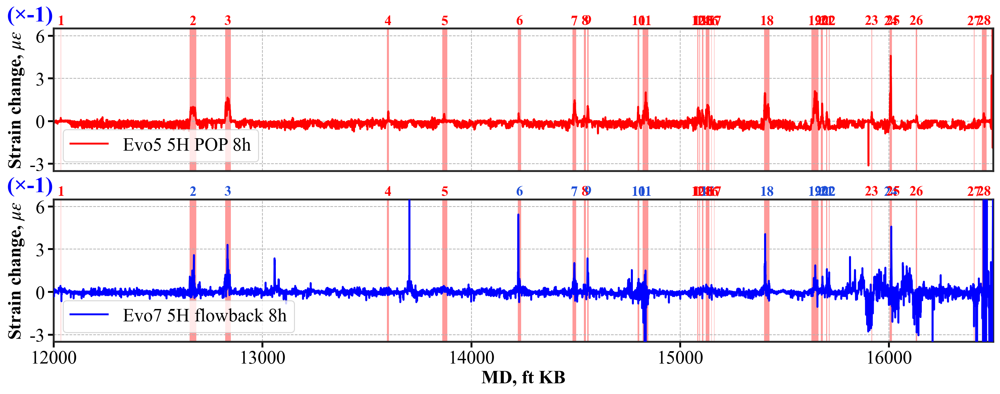

In [6]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'
EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration for Evo7
#    12000 ft: Evo7 depth -40 ft = Evo5 depth(raw)
#    16000 ft: Evo7 depth -45 ft = Evo5 depth(raw)
#    others linearly interpolated
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift

def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())

def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    """
    Convert channel intervals -> MD intervals using depth_arr
    depth_arr should already be calibrated if needed.
    """
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi))

    return out

def merge_intervals(intervals):
    if not intervals:
        return []

    intervals = sorted(intervals, key=lambda x: (x[0], x[1]))
    merged = [list(intervals[0])]

    for a, b in intervals[1:]:
        if a <= merged[-1][1]:
            merged[-1][1] = max(merged[-1][1], b)
        else:
            merged.append([a, b])

    return [tuple(x) for x in merged]

def intersect_intervals(intervals_a, intervals_b):
    """
    Return intersections between two interval lists.
    """
    A = merge_intervals(intervals_a)
    B = merge_intervals(intervals_b)

    i, j = 0, 0
    out = []

    while i < len(A) and j < len(B):
        a1, a2 = A[i]
        b1, b2 = B[j]

        lo = max(a1, b1)
        hi = min(a2, b2)

        if hi > lo:
            out.append((lo, hi))

        if a2 < b2:
            i += 1
        else:
            j += 1

    return merge_intervals(out)

def subtract_intervals(base_intervals, cut_intervals):
    """
    base - cut
    """
    base = merge_intervals(base_intervals)
    cut  = merge_intervals(cut_intervals)

    out = []

    for a, b in base:
        curr_segments = [(a, b)]

        for c, d in cut:
            new_segments = []

            for x, y in curr_segments:
                if d <= x or c >= y:
                    new_segments.append((x, y))
                else:
                    if c > x:
                        new_segments.append((x, c))
                    if d < y:
                        new_segments.append((d, y))

            curr_segments = new_segments

            if not curr_segments:
                break

        out.extend(curr_segments)

    return merge_intervals(out)

def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)

def add_span(ax, a, b, color, alpha=0.35, zorder=0):
    ax.axvspan(
        a, b,
        facecolor=color,
        edgecolor='none',
        linewidth=0,
        antialiased=False,
        alpha=alpha,
        zorder=zorder
    )

def add_interval_labels(ax, intervals, color, y_axes, fontsize=10,
                        special_ids=None, special_color=None):
    """
    special_ids: 需要特殊着色的编号集合，例如 {5, 8, 11, 16}
    special_color: 这些编号使用的颜色
    在指定轴上，按 x=data 坐标、y=axes fraction 坐标写编号
    y_axes:
        >1   -> 轴上方
        0~1  -> 轴内部
        <0   -> 轴下方
    """
    if special_ids is None:
        special_ids = set()

    for k, (a, b) in enumerate(intervals, start=1):
        mid = 0.5 * (a + b)

        this_color = special_color if (k in special_ids and special_color is not None) else color

        ax.text(
            mid, y_axes, f"{k}",
            transform=ax.get_xaxis_transform(),
            ha="center", va="center",
            fontsize=fontsize,
            color=this_color,
            fontweight="bold",
            clip_on=False
        )


# =========================================================
# 2) EVO5 settings
# =========================================================
EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 8]
EVO5_LABEL = "Evo5 5H POP 8h"
EVO5_YLIM = (-3.5, 6.5)
EVO5_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    # (41531,41591), #5     not good behavior when marked the peak
    (42035,42105), #6
    # (43087,43107), #7     not good behavior when marked the peak
    (43128,43180), #8
    (43927,43976), #9
    (44091,44120), #10
    (44138,44161), #11
    (44869,44895), #12
    (44941,45025), #13
    (45739,45754), #14
    (45767,45778), #15
    (45805,45827), #16
    (45859,45912), #17
    (45941,45947), #18
    (45983,45987), #19
    (46706,46784), #20
    (47395,47495), #21
    (47533,47560), #22
    (47611,47625), #23
    (47649,47659), #24
    (48265,48275), #25
    (48531,48562), #26
    (48583,48586), #27
    (48909,48932), #28
    (49753,49763), #29
    (49871,49939), #30
]


# =========================================================
# 3) EVO7 settings
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0,  8]
EVO7_LABEL = "Evo7 5H flowback 8h"
EVO7_YLIM = (-3.5, 6.5)
EVO7_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO7 = [
    (38364,38434),  #1
    (38869,38922),  #2
    (39593,39605),  #3  new fracture
    (39653,39659),  #4  new fracture
    # (41410,41422),  #5  small magnitude, delayed response, deleted
    (43122,43159),  #6
    # (43230,43236),  #7  small magnitude, deleted
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    # (45756,45804),  #12 delayed response, deleted
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    # (47600,47644),  #old 17 , separated into 2 
    (47600,47610),  #17a
    (47635,47644),  #17b
    (48522,48540),  #18
]


# =========================================================
# 4) Shared styles
# =========================================================
style_evo5 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "red"
}

style_evo7 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "#0000FF"
}

# 颜色定义
POP_ONLY_COLOR   = "red"
OVERLAP_COLOR    = "#16A34A"
EVO7_ONLY_COLOR  = "#1D4ED8"
HIGHLIGHT_ALPHA  = 0.4


# =========================================================
# 5) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

mask5 = (depth5 >= EVO5_DEPTH_MIN) & (depth5 <= EVO5_DEPTH_MAX)
depth5_win = depth5[mask5]

test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

out5 = -1 * (profiles5["P2"] - profiles5["P1"])


# =========================================================
# 6) Load EVO7 + apply MD calibration
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0)

MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

out7 = -1 * (profiles7["P2"] - profiles7["P1"])


# =========================================================
# 7) Convert intervals to MD
# =========================================================
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals7_md = intervals_channel_to_md(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)

# 做集合运算
overlap_md   = intersect_intervals(intervals5_md, intervals7_md)
pop_only_md  = subtract_intervals(intervals5_md, overlap_md)
evo7_only_md = subtract_intervals(intervals7_md, overlap_md)


# =========================================================
# 8) Plot ONLY 2 rows
#    Row1: EVO5 strain
#    Row2: EVO7 strain
# =========================================================
fig, axes = plt.subplots(
    2, 1,
    figsize=(15, 6),
    sharex=True,
    gridspec_kw={"height_ratios": [1, 1]}
)

ax5_str, ax7_str = axes

# =========================================================
# 9) Row1: EVO5 strain
#    - show ORIGINAL 31 red intervals
#    - label ORIGINAL 31 intervals
# =========================================================
for (a, b) in intervals5_md:
    ax5_str.axvspan(
        a, b,
        facecolor=POP_ONLY_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )

ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **style_evo5, zorder=2)
ax5_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax5_str.set_ylim(*EVO5_YLIM)
ax5_str.set_yticks(EVO5_YTICKS)
ax5_str.grid(True, linestyle="--", zorder=1)
ax5_str.legend(loc="lower left")

ax5_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax5_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color="#0000FF"
)

# 第一张图：完全取消 x 轴
ax5_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

# 红色编号：标原始31个区间
add_interval_labels(ax5_str, intervals5_md, color=POP_ONLY_COLOR, y_axes=1.05, fontsize=15)

# =========================================================
# 10) Row2: EVO7 strain
#     - show ORIGINAL 18 blue intervals, and label them
#     - overlay ORIGINAL 31 red intervals, no labels
#     - overlay overlap as green, and label overlap
# =========================================================
for (a, b) in intervals5_md:
    ax7_str.axvspan(
        a, b,
        facecolor=POP_ONLY_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=1
    )

ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **style_evo7, zorder=3)
ax7_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax7_str.set_ylim(*EVO7_YLIM)
ax7_str.set_yticks(EVO7_YTICKS)
ax7_str.grid(True, linestyle="--", zorder=1)
ax7_str.legend(loc="lower left")

ax7_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax7_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color="#0000FF"
)

# 第二张图：只保留下方 MD
md_ticks = np.arange(int(MD_MIN), int(MD_MAX) + 1, 1000)
ax7_str.set_xticks(md_ticks)
ax7_str.set_xlabel("MD, ft KB")
ax7_str.tick_params(axis="x", top=False, bottom=True, labeltop=False, labelbottom=True, pad=3)


# 第二张图标号: 红色编号：标原始31个区间
# add_interval_labels(ax7_str, intervals5_md, color=POP_ONLY_COLOR, y_axes=1.05, fontsize=15)
add_interval_labels(
    ax7_str,
    intervals5_md,
    color=POP_ONLY_COLOR,
    y_axes=1.05,
    fontsize=15,
    special_ids={2, 3, 6, 7, 9, 10, 11,
                 15, 18, 19, 20, 21, 22, 24},
    special_color=EVO7_ONLY_COLOR
)

# =========================================================
# 11) Shared settings
# =========================================================
for ax in axes:
    ax.set_xlim(MD_MIN, MD_MAX)
    style_full_box(ax, lw=2)

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)

plt.show()

f5.close()
f7.close()

## separate drawing

#### V1

[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


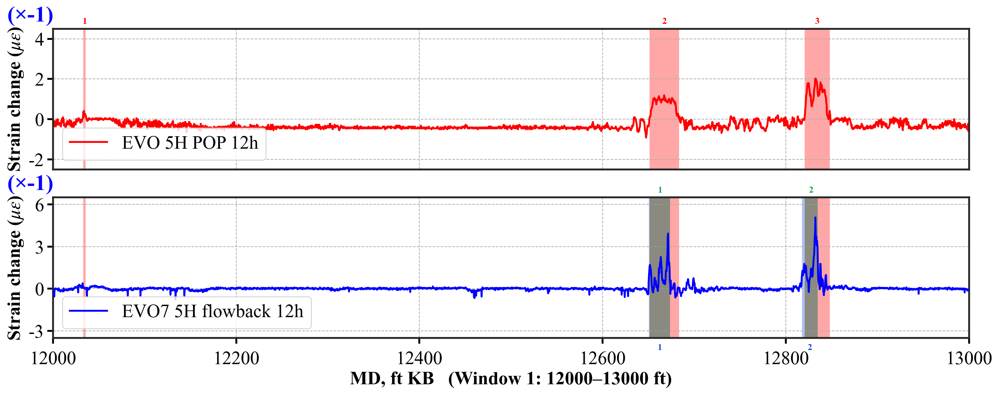

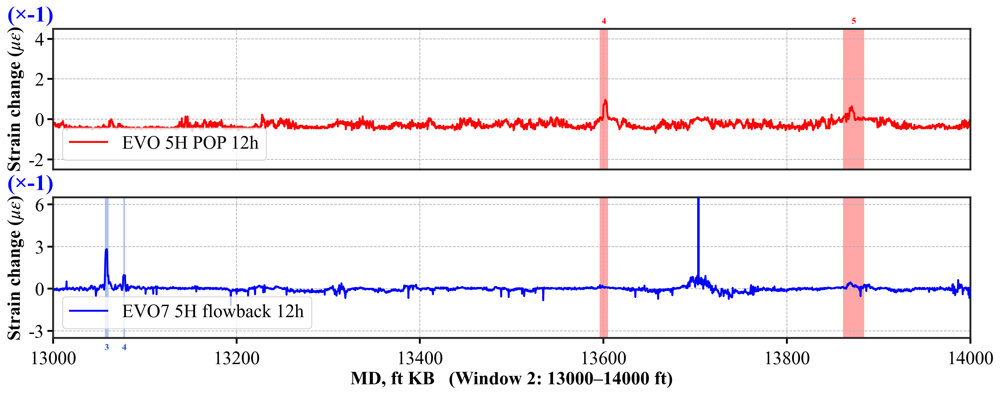

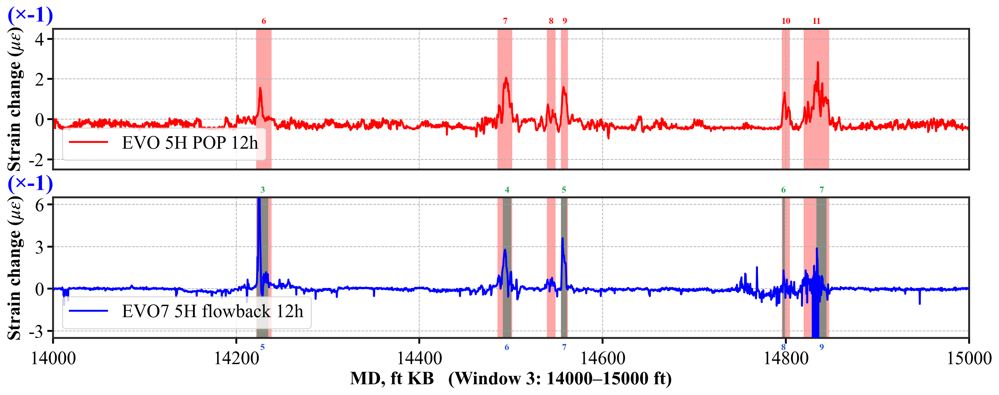

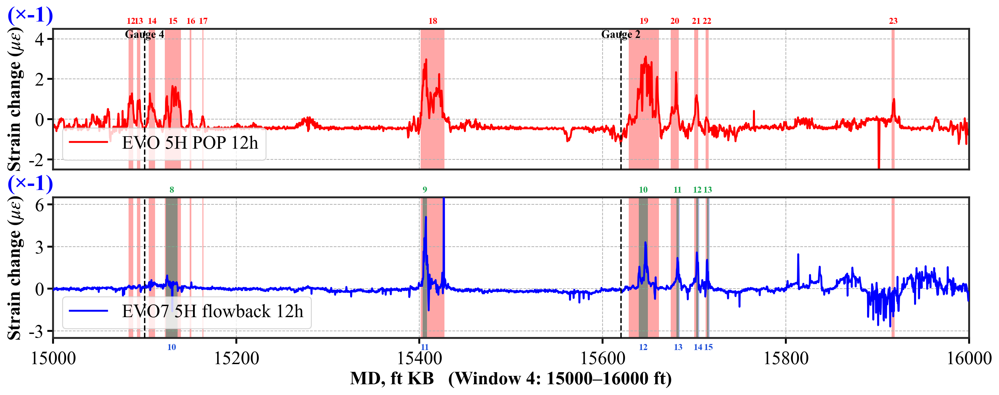

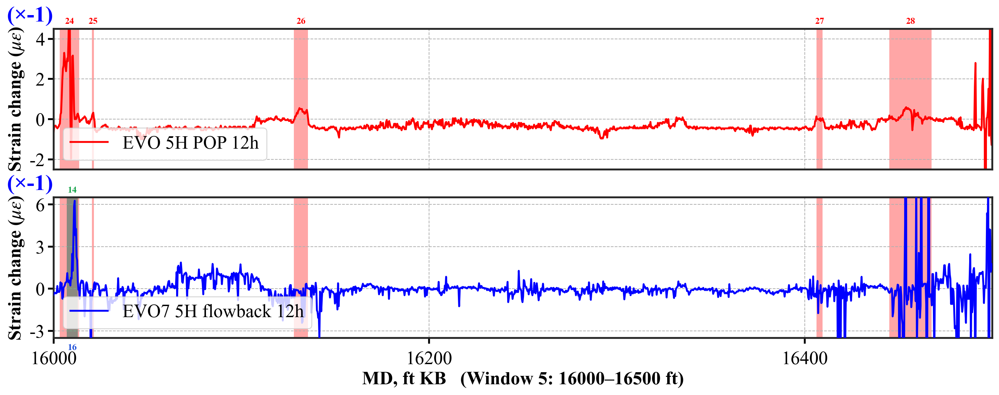

In [ ]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'
EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration for Evo7
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift

def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())

def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    """
    Convert channel intervals -> MD intervals using depth_arr
    """
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi))

    return out

def intervals_channel_to_md_labeled(intervals_ch, depth_arr, md_min, md_max):
    """
    Convert channel intervals -> MD intervals, and keep original numbering.
    Return: [(md_lo, md_hi, label), ...]
    """
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for k, (a, b) in enumerate(intervals_ch, start=1):
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi, k))

    return out

def merge_intervals(intervals):
    if not intervals:
        return []

    intervals = sorted(intervals, key=lambda x: (x[0], x[1]))
    merged = [list(intervals[0])]

    for a, b in intervals[1:]:
        if a <= merged[-1][1]:
            merged[-1][1] = max(merged[-1][1], b)
        else:
            merged.append([a, b])

    return [tuple(x) for x in merged]

def intersect_intervals(intervals_a, intervals_b):
    A = merge_intervals(intervals_a)
    B = merge_intervals(intervals_b)

    i, j = 0, 0
    out = []

    while i < len(A) and j < len(B):
        a1, a2 = A[i]
        b1, b2 = B[j]

        lo = max(a1, b1)
        hi = min(a2, b2)

        if hi > lo:
            out.append((lo, hi))

        if a2 < b2:
            i += 1
        else:
            j += 1

    return merge_intervals(out)

def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)

def add_interval_labels(ax, labeled_intervals, color, y_axes, fontsize=10):
    """
    labeled_intervals: [(a, b, label), ...]
    """
    for a, b, label in labeled_intervals:
        mid = 0.5 * (a + b)
        ax.text(
            mid, y_axes, f"{label}",
            transform=ax.get_xaxis_transform(),
            ha="center", va="center",
            fontsize=fontsize,
            color=color,
            fontweight="bold",
            clip_on=False
        )

def filter_labeled_intervals(labeled_intervals, x0, x1):
    """
    Keep only intervals intersecting [x0, x1], and clip them to the window.
    """
    out = []
    for a, b, label in labeled_intervals:
        lo = max(a, x0)
        hi = min(b, x1)
        if hi > lo:
            out.append((lo, hi, label))
    return out

def filter_plain_intervals(intervals, x0, x1):
    """
    Keep only intervals intersecting [x0, x1], and clip them to the window.
    """
    out = []
    for a, b in intervals:
        lo = max(a, x0)
        hi = min(b, x1)
        if hi > lo:
            out.append((lo, hi))
    return out

# =========================================================
# 2) EVO5 settings
# =========================================================
EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 12]
EVO5_LABEL = "EVO5 5H POP 12h"
EVO5_YLIM = (-2.5, 4.5)
EVO5_YTICKS = np.arange(-2, 5, 2)


RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    # (41531,41591), #5     not good behavior when marked the peak
    (42035,42105), #6
    # (43087,43107), #7     not good behavior when marked the peak
    (43128,43180), #8
    (43927,43976), #9
    (44091,44120), #10
    (44138,44161), #11
    (44869,44895), #12
    (44941,45025), #13
    (45739,45754), #14
    (45767,45778), #15
    (45805,45827), #16
    (45859,45912), #17
    (45941,45947), #18
    (45983,45987), #19
    (46706,46784), #20
    (47395,47495), #21
    (47533,47560), #22
    (47611,47625), #23
    (47649,47659), #24
    (48265,48275), #25
    (48531,48562), #26
    (48583,48586), #27
    (48909,48932), #28
    (49753,49763), #29
    (49871,49939), #30
]


# =========================================================
# 3) EVO7 settings
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0, 4, 8, 12, 24, 28]
EVO7_LABEL = "EVO7 5H flowback 12h"
EVO7_YLIM = (-3.5, 6.5)
EVO7_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO7 = [
    (38364,38434),  #1
    (38869,38922),  #2
    (39593,39605),  #3  new fracture
    (39653,39659),  #4  new fracture
    # (41410,41422),  #5  small magnitude, delayed response, deleted
    (43122,43159),  #6
    # (43230,43236),  #7  small magnitude, deleted
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    # (45756,45804),  #12 delayed response, deleted
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    # (47600,47644),  #old 17 , separated into 2 
    (47600,47610),  #17a
    (47635,47644),  #17b
    (48522,48540),  #18
]

GAUGE_MDS = {
    "Gauge 4": 15100.0,
    "Gauge 2": 15620.0,
}
# =========================================================
# 4) Shared styles
# =========================================================
style_evo5 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "red"
}

style_evo7 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "#0000FF"
}

POP_ONLY_COLOR   = "red"
OVERLAP_COLOR    = "#16A34A"
EVO7_ONLY_COLOR  = "#1D4ED8"
HIGHLIGHT_ALPHA  = 0.35


# =========================================================
# 5) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

mask5 = (depth5 >= EVO5_DEPTH_MIN) & (depth5 <= EVO5_DEPTH_MAX)
depth5_win = depth5[mask5]

test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

out5 = -1 * (profiles5["P2"] - profiles5["P1"])


# =========================================================
# 6) Load EVO7 + apply MD calibration
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0)

MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

out7 = -1 * (profiles7["P4"] - profiles7["P1"])


# =========================================================
# 7) Convert intervals to MD
# =========================================================
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals7_md = intervals_channel_to_md(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)

intervals5_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals7_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)

overlap_md = intersect_intervals(intervals5_md, intervals7_md)
overlap_md_labeled = [(a, b, i + 1) for i, (a, b) in enumerate(overlap_md)]


# =========================================================
# 8) Build 5 separate windows and plot one-by-one
# =========================================================
windows = []
for start in np.arange(12000.0, 16500.0, 1000.0):
    end = min(start + 1000.0, MD_MAX)
    if end > start:
        windows.append((start, end))

for iwin, (x0, x1) in enumerate(windows, start=1):

    # windowed intervals for this figure
    win_red_plain   = filter_plain_intervals(intervals5_md, x0, x1)
    win_blue_plain  = filter_plain_intervals(intervals7_md, x0, x1)
    win_green_plain = filter_plain_intervals(overlap_md, x0, x1)

    win_red_labeled   = filter_labeled_intervals(intervals5_md_labeled, x0, x1)
    win_blue_labeled  = filter_labeled_intervals(intervals7_md_labeled, x0, x1)
    win_green_labeled = filter_labeled_intervals(overlap_md_labeled, x0, x1)

    fig, axes = plt.subplots(
        2, 1,
        figsize=(15, 6),
        sharex=True,
        gridspec_kw={"height_ratios": [1, 1]}
    )

    ax5_str, ax7_str = axes

    # -----------------------------------------------------
    # Row1: EVO5
    # -----------------------------------------------------
    for (a, b) in win_red_plain:
        ax5_str.axvspan(
            a, b,
            facecolor=POP_ONLY_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=0
        )

    ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **style_evo5, zorder=2)
    ax5_str.set_ylabel(r"Strain change ($\mu\varepsilon$)")
    ax5_str.set_ylim(*EVO5_YLIM)
    ax5_str.set_yticks(EVO5_YTICKS)
    ax5_str.grid(True, linestyle="--", zorder=1)
    ax5_str.legend(loc="lower left")

    ax5_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax5_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color="#0000FF"
    )

    ax5_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

    add_interval_labels(ax5_str, win_red_labeled, color=POP_ONLY_COLOR, y_axes=1.05, fontsize=10)

    # -----------------------------------------------------
    # Row2: EVO7
    # -----------------------------------------------------
    # blue original 18
    for (a, b) in win_blue_plain:
        ax7_str.axvspan(
            a, b,
            facecolor=EVO7_ONLY_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=0
        )

    # red original 31 overlay, no labels
    for (a, b) in win_red_plain:
        ax7_str.axvspan(
            a, b,
            facecolor=POP_ONLY_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=1
        )

    # green overlap
    for (a, b) in win_green_plain:
        ax7_str.axvspan(
            a, b,
            facecolor=OVERLAP_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=2
        )

    ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **style_evo7, zorder=3)
    ax7_str.set_ylabel(r"Strain change ($\mu\varepsilon$)")
    ax7_str.set_ylim(*EVO7_YLIM)
    ax7_str.set_yticks(EVO7_YTICKS)
    ax7_str.grid(True, linestyle="--", zorder=1)
    ax7_str.legend(loc="lower left")

    ax7_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax7_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color="#0000FF"
    )

    ax7_str.set_xticks(np.arange(x0, x1 + 1, 200))
    ax7_str.set_xlabel(f"MD, ft KB   (Window {iwin}: {int(x0)}–{int(x1)} ft)")
    ax7_str.tick_params(axis="x", top=False, bottom=True, labeltop=False, labelbottom=True, pad=8)

    # blue labels = original 18 numbering
    add_interval_labels(ax7_str, win_blue_labeled, color=EVO7_ONLY_COLOR, y_axes=-0.07, fontsize=10)

    # green labels = overlap numbering
    add_interval_labels(ax7_str, win_green_labeled, color=OVERLAP_COLOR, y_axes=1.05, fontsize=10)


    # shared settings
    for ax in axes:
        ax.set_xlim(x0, x1)
        style_full_box(ax, lw=2)

    # 在包含 15000 ft 的窗口里加 gauge 竖线
    for gauge_name, gauge_md in GAUGE_MDS.items():
        if x0 <= gauge_md <= x1:
            for ax in axes:
                ax.axvline(
                    gauge_md,
                    color="black",
                    linestyle="--",
                    linewidth=1.5,
                    zorder=10
                )

            ax5_str.text(
                gauge_md,
                0.92,
                gauge_name,
                transform=ax5_str.get_xaxis_transform(),
                ha="center",
                va="bottom",
                fontsize=12,
                color="black",
                fontweight="bold"
            )


    plt.tight_layout()
    plt.subplots_adjust(hspace=0.2)
    plt.show()

# close files
f5.close()
f7.close()

#### V2

[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


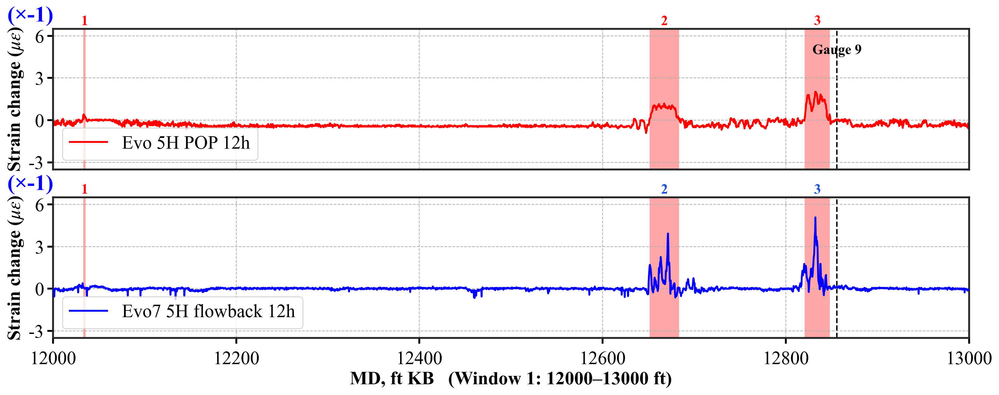

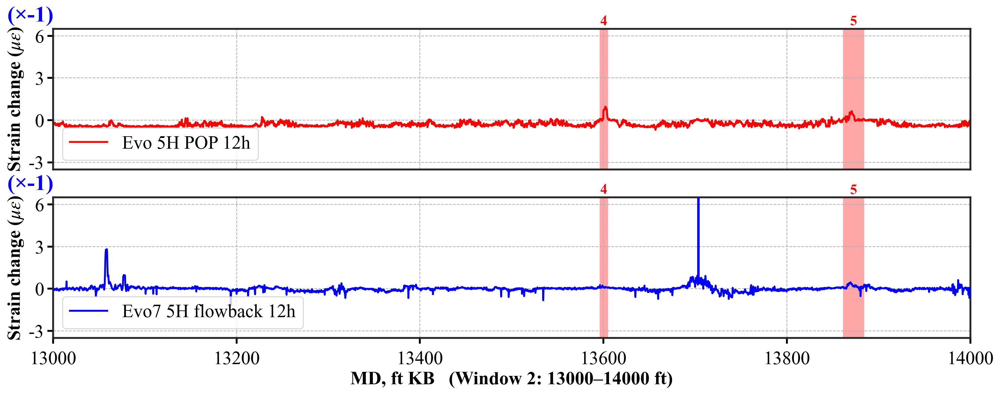

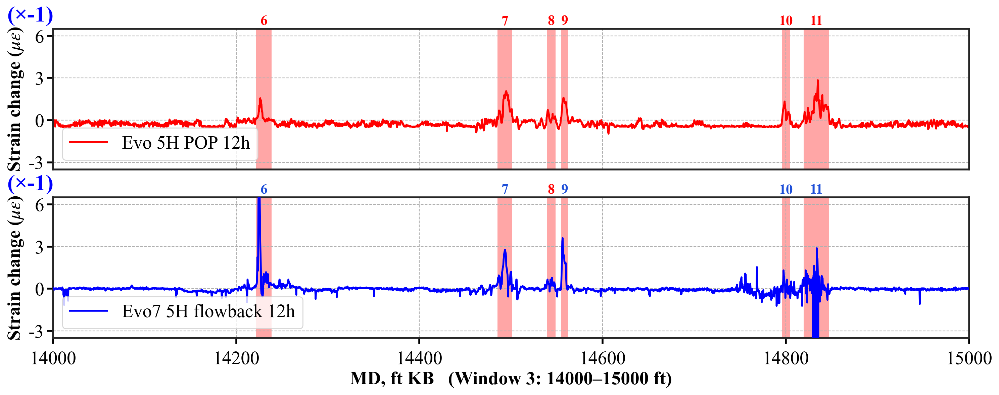

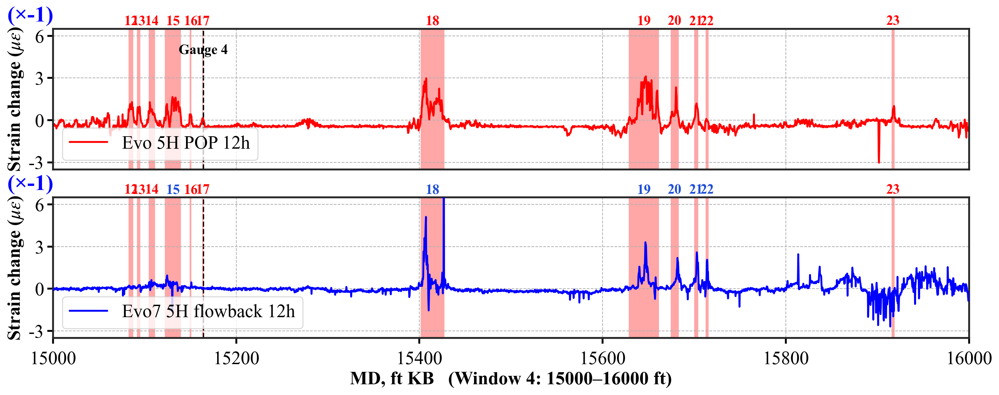

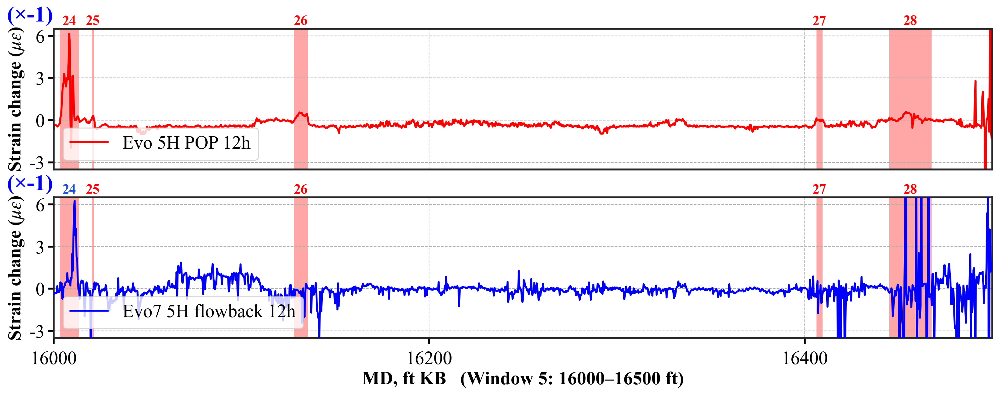

In [5]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'
EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration for Evo7
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift

def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())

def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    """
    Convert channel intervals -> MD intervals using depth_arr
    """
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi))

    return out

def intervals_channel_to_md_labeled(intervals_ch, depth_arr, md_min, md_max):
    """
    Convert channel intervals -> MD intervals, and keep original numbering.
    Return: [(md_lo, md_hi, label), ...]
    """
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for k, (a, b) in enumerate(intervals_ch, start=1):
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi, k))

    return out

def merge_intervals(intervals):
    if not intervals:
        return []

    intervals = sorted(intervals, key=lambda x: (x[0], x[1]))
    merged = [list(intervals[0])]

    for a, b in intervals[1:]:
        if a <= merged[-1][1]:
            merged[-1][1] = max(merged[-1][1], b)
        else:
            merged.append([a, b])

    return [tuple(x) for x in merged]

def intersect_intervals(intervals_a, intervals_b):
    A = merge_intervals(intervals_a)
    B = merge_intervals(intervals_b)

    i, j = 0, 0
    out = []

    while i < len(A) and j < len(B):
        a1, a2 = A[i]
        b1, b2 = B[j]

        lo = max(a1, b1)
        hi = min(a2, b2)

        if hi > lo:
            out.append((lo, hi))

        if a2 < b2:
            i += 1
        else:
            j += 1

    return merge_intervals(out)

def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)

def add_interval_labels(ax, intervals, color, y_axes, fontsize=10,
                        special_ids=None, special_color=None):
    """
    intervals 可以是：
      [(a, b), ...]
    或
      [(a, b, label), ...]

    special_ids: 需要特殊着色的编号集合，例如 {5, 8, 11, 16}
    special_color: 这些编号使用的颜色
    """
    if special_ids is None:
        special_ids = set()

    for k, item in enumerate(intervals, start=1):
        if len(item) == 2:
            a, b = item
            label = k
        elif len(item) == 3:
            a, b, label = item
        else:
            raise ValueError(f"interval item must have length 2 or 3, got: {item}")

        mid = 0.5 * (a + b)

        # special_ids 按显示出来的 label 判断
        this_color = special_color if (label in special_ids and special_color is not None) else color

        ax.text(
            mid, y_axes, f"{label}",
            transform=ax.get_xaxis_transform(),
            ha="center", va="center",
            fontsize=fontsize,
            color=this_color,
            fontweight="bold",
            clip_on=False
        )

def filter_labeled_intervals(labeled_intervals, x0, x1):
    """
    Keep only intervals intersecting [x0, x1], and clip them to the window.
    """
    out = []
    for a, b, label in labeled_intervals:
        lo = max(a, x0)
        hi = min(b, x1)
        if hi > lo:
            out.append((lo, hi, label))
    return out

def filter_plain_intervals(intervals, x0, x1):
    """
    Keep only intervals intersecting [x0, x1], and clip them to the window.
    """
    out = []
    for a, b in intervals:
        lo = max(a, x0)
        hi = min(b, x1)
        if hi > lo:
            out.append((lo, hi))
    return out

# =========================================================
# 2) EVO5 settings
# =========================================================

EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 12]
EVO5_LABEL = "Evo 5H POP 12h"
EVO5_YLIM = (-3.5, 6.5)
EVO5_YTICKS = np.arange(-3, 7, 3)


RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    # (41531,41591), #5     not good behavior when marked the peak
    (42035,42105), #6
    # (43087,43107), #7     not good behavior when marked the peak
    (43128,43180), #8
    (43927,43976), #9
    (44091,44120), #10
    (44138,44161), #11
    (44869,44895), #12
    (44941,45025), #13
    (45739,45754), #14
    (45767,45778), #15
    (45805,45827), #16
    (45859,45912), #17
    (45941,45947), #18
    (45983,45987), #19
    (46706,46784), #20
    (47395,47495), #21
    (47533,47560), #22
    (47611,47625), #23
    (47649,47659), #24
    (48265,48275), #25
    (48531,48562), #26
    (48583,48586), #27
    (48909,48932), #28
    (49753,49763), #29
    (49871,49939), #30
]



# =========================================================
# 3) EVO7 settings
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0, 4, 8, 12, 24, 28]
EVO7_LABEL = "Evo7 5H flowback 12h"
EVO7_YLIM = (-3.5, 6.5)
EVO7_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO7 = [
    (38364,38434),  #1
    (38869,38922),  #2
    (39593,39605),  #3  new fracture
    (39653,39659),  #4  new fracture
    # (41410,41422),  #5  small magnitude, delayed response, deleted
    (43122,43159),  #6
    # (43230,43236),  #7  small magnitude, deleted
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    # (45756,45804),  #12 delayed response, deleted
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    # (47600,47644),  #old 17 , separated into 2 
    (47600,47610),  #17a
    (47635,47644),  #17b
    (48522,48540),  #18
]

GAUGE_MDS = {
    "Gauge 4": 15164.13,
    "Gauge 9": 12855.79,
}

# =========================================================
# 4) Shared styles
# =========================================================
style_evo5 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "red"
}

style_evo7 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "#0000FF"
}

POP_ONLY_COLOR   = "red"
OVERLAP_COLOR    = "#16A34A"
EVO7_ONLY_COLOR  = "#1D4ED8"
HIGHLIGHT_ALPHA  = 0.35


# =========================================================
# 5) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

mask5 = (depth5 >= EVO5_DEPTH_MIN) & (depth5 <= EVO5_DEPTH_MAX)
depth5_win = depth5[mask5]

test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

out5 = -1 * (profiles5["P2"] - profiles5["P1"])


# =========================================================
# 6) Load EVO7 + apply MD calibration
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0)

MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

out7 = -1 * (profiles7["P4"] - profiles7["P1"])


# =========================================================
# 7) Convert intervals to MD
# =========================================================
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals7_md = intervals_channel_to_md(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)

intervals5_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals7_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)

overlap_md = intersect_intervals(intervals5_md, intervals7_md)
overlap_md_labeled = [(a, b, i + 1) for i, (a, b) in enumerate(overlap_md)]


# =========================================================
# 8) Build 5 separate windows and plot one-by-one
# =========================================================
windows = []
for start in np.arange(12000.0, 16500.0, 1000.0):  #(12000.0, 16500.0, 1000.0):
    end = min(start + 1000.0, MD_MAX)
    if end > start:
        windows.append((start, end))

for iwin, (x0, x1) in enumerate(windows, start=1):

    # windowed intervals for this figure
    win_red_plain   = filter_plain_intervals(intervals5_md, x0, x1)
    win_blue_plain  = filter_plain_intervals(intervals7_md, x0, x1)
    win_green_plain = filter_plain_intervals(overlap_md, x0, x1)

    win_red_labeled   = filter_labeled_intervals(intervals5_md_labeled, x0, x1)
    win_blue_labeled  = filter_labeled_intervals(intervals7_md_labeled, x0, x1)
    win_green_labeled = filter_labeled_intervals(overlap_md_labeled, x0, x1)

    fig, axes = plt.subplots(
        2, 1,
        figsize=(15, 6),
        sharex=True,
        gridspec_kw={"height_ratios": [1, 1]}
    )

    ax5_str, ax7_str = axes

    # -----------------------------------------------------
    # Row1: EVO5
    # -----------------------------------------------------
    for (a, b) in win_red_plain:
        ax5_str.axvspan(
            a, b,
            facecolor=POP_ONLY_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=0
        )

    ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **style_evo5, zorder=2)
    ax5_str.set_ylabel(r"Strain change ($\mu\varepsilon$)")
    ax5_str.set_ylim(*EVO5_YLIM)
    ax5_str.set_yticks(EVO5_YTICKS)
    ax5_str.grid(True, linestyle="--", zorder=1)
    ax5_str.legend(loc="lower left")

    ax5_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax5_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color="#0000FF"
    )

    ax5_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

    add_interval_labels(ax5_str, win_red_labeled, color=POP_ONLY_COLOR, y_axes=1.05, fontsize=15)

    # -----------------------------------------------------
    # Row2: EVO7
    # -----------------------------------------------------
    # red original 31 overlay, no labels
    for (a, b) in win_red_plain:
        ax7_str.axvspan(
            a, b,
            facecolor=POP_ONLY_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=1
        )



    ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **style_evo7, zorder=3)
    ax7_str.set_ylabel(r"Strain change ($\mu\varepsilon$)")
    ax7_str.set_ylim(*EVO7_YLIM)
    ax7_str.set_yticks(EVO7_YTICKS)
    ax7_str.grid(True, linestyle="--", zorder=1)
    ax7_str.legend(loc="lower left")

    ax7_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax7_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color="#0000FF"
    )

    ax7_str.set_xticks(np.arange(x0, x1 + 1, 200))
    ax7_str.set_xlabel(f"MD, ft KB   (Window {iwin}: {int(x0)}–{int(x1)} ft)")
    ax7_str.tick_params(axis="x", top=False, bottom=True, labeltop=False, labelbottom=True, pad=8)


    # 第二张图标号: 红色编号：标原始31个区间
    # add_interval_labels(ax7_str, intervals5_md, color=POP_ONLY_COLOR, y_axes=1.05, fontsize=15)
    add_interval_labels(
        ax7_str,
        win_red_labeled,
        color=POP_ONLY_COLOR,
        y_axes=1.05,
        fontsize=15,
        special_ids={2, 3, 6, 7, 9, 10, 11,
                     15, 18, 19, 20, 21, 22, 24},
        special_color=EVO7_ONLY_COLOR
    )

    # shared settings
    for ax in axes:
        ax.set_xlim(x0, x1)
        style_full_box(ax, lw=2)

    # 在包含 15000 ft 的窗口里加 gauge 竖线
    for gauge_name, gauge_md in GAUGE_MDS.items():
        if x0 <= gauge_md <= x1:
            for ax in axes:
                ax.axvline(
                    gauge_md,
                    color="black",
                    linestyle="--",
                    linewidth=1.5,
                    zorder=0
                )

            ax5_str.text(
                gauge_md,
                0.8,
                gauge_name,
                transform=ax5_str.get_xaxis_transform(),
                ha="center",
                va="bottom",
                fontsize=15,
                color="black",
                fontweight="bold"
            )

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.2)
    plt.show()

# close files
f5.close()
f7.close()

### V3 8h

[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


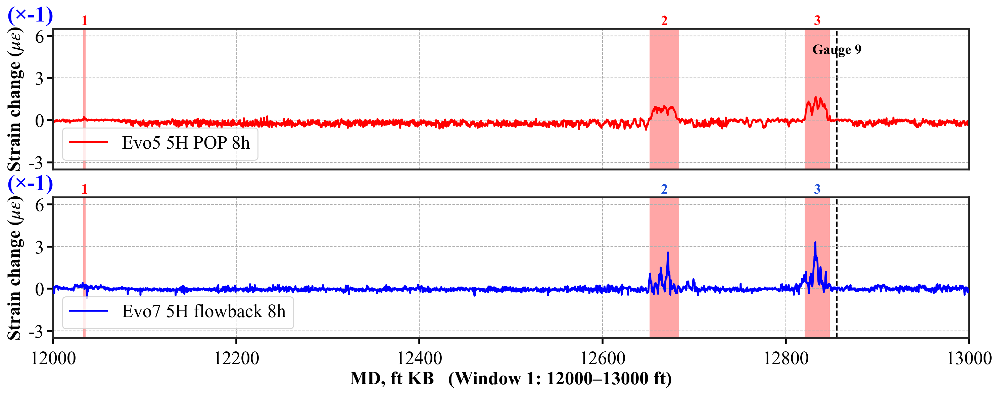

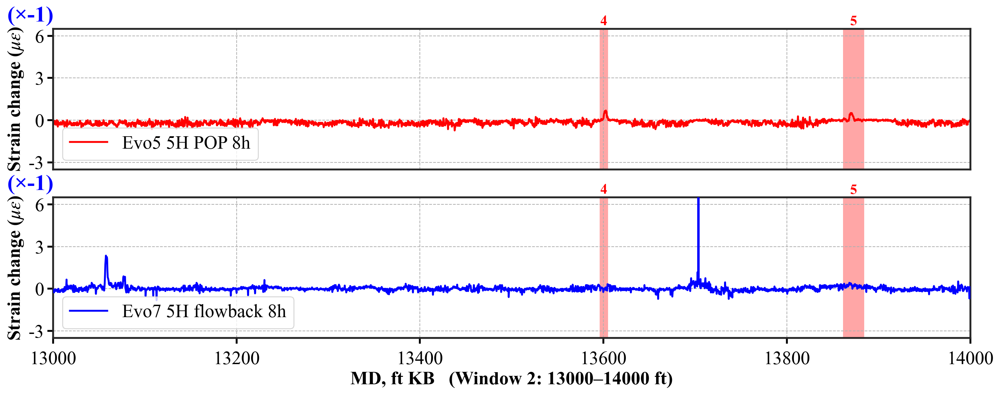

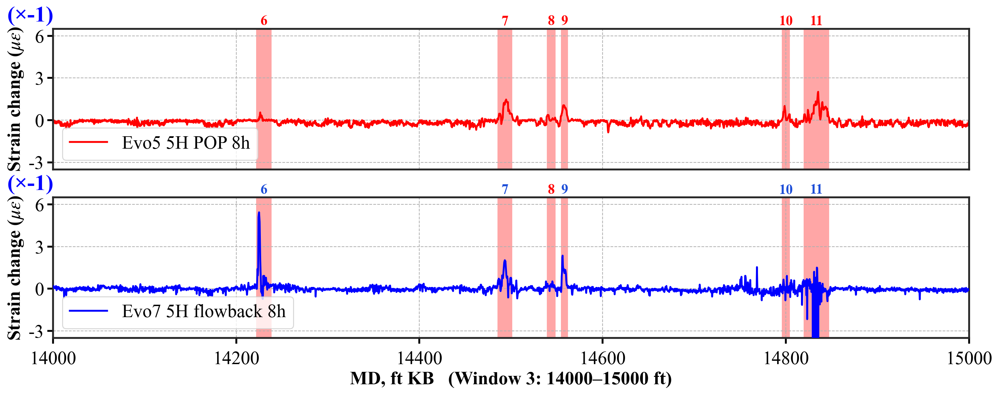

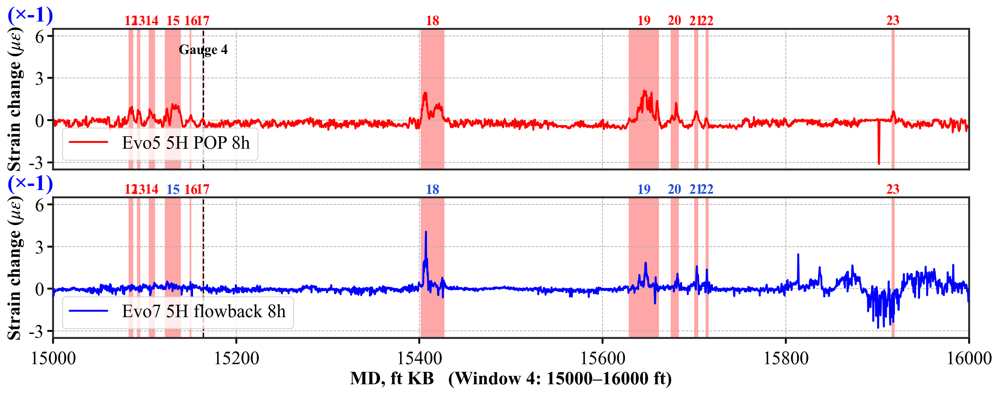

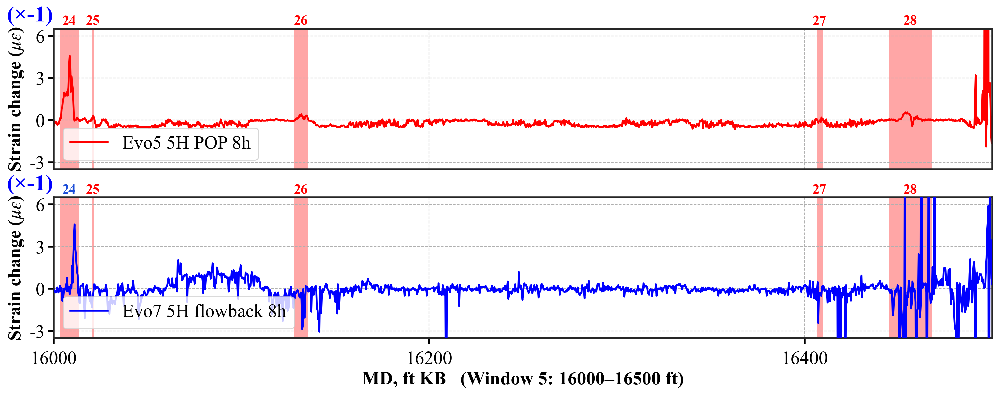

In [5]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'
EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration for Evo7
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift

def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())

def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    """
    Convert channel intervals -> MD intervals using depth_arr
    """
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi))

    return out

def intervals_channel_to_md_labeled(intervals_ch, depth_arr, md_min, md_max):
    """
    Convert channel intervals -> MD intervals, and keep original numbering.
    Return: [(md_lo, md_hi, label), ...]
    """
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for k, (a, b) in enumerate(intervals_ch, start=1):
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi, k))

    return out

def merge_intervals(intervals):
    if not intervals:
        return []

    intervals = sorted(intervals, key=lambda x: (x[0], x[1]))
    merged = [list(intervals[0])]

    for a, b in intervals[1:]:
        if a <= merged[-1][1]:
            merged[-1][1] = max(merged[-1][1], b)
        else:
            merged.append([a, b])

    return [tuple(x) for x in merged]

def intersect_intervals(intervals_a, intervals_b):
    A = merge_intervals(intervals_a)
    B = merge_intervals(intervals_b)

    i, j = 0, 0
    out = []

    while i < len(A) and j < len(B):
        a1, a2 = A[i]
        b1, b2 = B[j]

        lo = max(a1, b1)
        hi = min(a2, b2)

        if hi > lo:
            out.append((lo, hi))

        if a2 < b2:
            i += 1
        else:
            j += 1

    return merge_intervals(out)

def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)

def add_interval_labels(ax, intervals, color, y_axes, fontsize=10,
                        special_ids=None, special_color=None):
    """
    intervals 可以是：
      [(a, b), ...]
    或
      [(a, b, label), ...]

    special_ids: 需要特殊着色的编号集合，例如 {5, 8, 11, 16}
    special_color: 这些编号使用的颜色
    """
    if special_ids is None:
        special_ids = set()

    for k, item in enumerate(intervals, start=1):
        if len(item) == 2:
            a, b = item
            label = k
        elif len(item) == 3:
            a, b, label = item
        else:
            raise ValueError(f"interval item must have length 2 or 3, got: {item}")

        mid = 0.5 * (a + b)

        # special_ids 按显示出来的 label 判断
        this_color = special_color if (label in special_ids and special_color is not None) else color

        ax.text(
            mid, y_axes, f"{label}",
            transform=ax.get_xaxis_transform(),
            ha="center", va="center",
            fontsize=fontsize,
            color=this_color,
            fontweight="bold",
            clip_on=False
        )

def filter_labeled_intervals(labeled_intervals, x0, x1):
    """
    Keep only intervals intersecting [x0, x1], and clip them to the window.
    """
    out = []
    for a, b, label in labeled_intervals:
        lo = max(a, x0)
        hi = min(b, x1)
        if hi > lo:
            out.append((lo, hi, label))
    return out

def filter_plain_intervals(intervals, x0, x1):
    """
    Keep only intervals intersecting [x0, x1], and clip them to the window.
    """
    out = []
    for a, b in intervals:
        lo = max(a, x0)
        hi = min(b, x1)
        if hi > lo:
            out.append((lo, hi))
    return out

# =========================================================
# 2) EVO5 settings
# =========================================================

EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 8]
EVO5_LABEL = "Evo5 5H POP 8h"
EVO5_YLIM = (-3.5, 6.5)
EVO5_YTICKS = np.arange(-3, 7, 3)


RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    # (41531,41591), #5     not good behavior when marked the peak
    (42035,42105), #6
    # (43087,43107), #7     not good behavior when marked the peak
    (43128,43180), #8
    (43927,43976), #9
    (44091,44120), #10
    (44138,44161), #11
    (44869,44895), #12
    (44941,45025), #13
    (45739,45754), #14
    (45767,45778), #15
    (45805,45827), #16
    (45859,45912), #17
    (45941,45947), #18
    (45983,45987), #19
    (46706,46784), #20
    (47395,47495), #21
    (47533,47560), #22
    (47611,47625), #23
    (47649,47659), #24
    (48265,48275), #25
    (48531,48562), #26
    (48583,48586), #27
    (48909,48932), #28
    (49753,49763), #29
    (49871,49939), #30
]



# =========================================================
# 3) EVO7 settings
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0, 8]
EVO7_LABEL = "Evo7 5H flowback 8h"
EVO7_YLIM = (-3.5, 6.5)
EVO7_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO7 = [
    (38364,38434),  #1
    (38869,38922),  #2
    (39593,39605),  #3  new fracture
    (39653,39659),  #4  new fracture
    # (41410,41422),  #5  small magnitude, delayed response, deleted
    (43122,43159),  #6
    # (43230,43236),  #7  small magnitude, deleted
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    # (45756,45804),  #12 delayed response, deleted
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    # (47600,47644),  #old 17 , separated into 2 
    (47600,47610),  #17a
    (47635,47644),  #17b
    (48522,48540),  #18
]

GAUGE_MDS = {
    "Gauge 4": 15164.13,
    "Gauge 9": 12855.79,
}

# =========================================================
# 4) Shared styles
# =========================================================
style_evo5 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "red"
}

style_evo7 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "#0000FF"
}

POP_ONLY_COLOR   = "red"
OVERLAP_COLOR    = "#16A34A"
EVO7_ONLY_COLOR  = "#1D4ED8"
HIGHLIGHT_ALPHA  = 0.35


# =========================================================
# 5) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

mask5 = (depth5 >= EVO5_DEPTH_MIN) & (depth5 <= EVO5_DEPTH_MAX)
depth5_win = depth5[mask5]

test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

out5 = -1 * (profiles5["P2"] - profiles5["P1"])


# =========================================================
# 6) Load EVO7 + apply MD calibration
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0)

MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

out7 = -1 * (profiles7["P2"] - profiles7["P1"])


# =========================================================
# 7) Convert intervals to MD
# =========================================================
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals7_md = intervals_channel_to_md(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)

intervals5_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals7_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)

overlap_md = intersect_intervals(intervals5_md, intervals7_md)
overlap_md_labeled = [(a, b, i + 1) for i, (a, b) in enumerate(overlap_md)]


# =========================================================
# 8) Build 5 separate windows and plot one-by-one
# =========================================================
windows = []
for start in np.arange(12000.0, 16500.0, 1000.0):  #(12000.0, 16500.0, 1000.0):
    end = min(start + 1000.0, MD_MAX)
    if end > start:
        windows.append((start, end))

for iwin, (x0, x1) in enumerate(windows, start=1):

    # windowed intervals for this figure
    win_red_plain   = filter_plain_intervals(intervals5_md, x0, x1)
    win_blue_plain  = filter_plain_intervals(intervals7_md, x0, x1)
    win_green_plain = filter_plain_intervals(overlap_md, x0, x1)

    win_red_labeled   = filter_labeled_intervals(intervals5_md_labeled, x0, x1)
    win_blue_labeled  = filter_labeled_intervals(intervals7_md_labeled, x0, x1)
    win_green_labeled = filter_labeled_intervals(overlap_md_labeled, x0, x1)

    fig, axes = plt.subplots(
        2, 1,
        figsize=(15, 6),
        sharex=True,
        gridspec_kw={"height_ratios": [1, 1]}
    )

    ax5_str, ax7_str = axes

    # -----------------------------------------------------
    # Row1: EVO5
    # -----------------------------------------------------
    for (a, b) in win_red_plain:
        ax5_str.axvspan(
            a, b,
            facecolor=POP_ONLY_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=0
        )

    ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **style_evo5, zorder=2)
    ax5_str.set_ylabel(r"Strain change ($\mu\varepsilon$)")
    ax5_str.set_ylim(*EVO5_YLIM)
    ax5_str.set_yticks(EVO5_YTICKS)
    ax5_str.grid(True, linestyle="--", zorder=1)
    ax5_str.legend(loc="lower left")

    ax5_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax5_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color="#0000FF"
    )

    ax5_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

    add_interval_labels(ax5_str, win_red_labeled, color=POP_ONLY_COLOR, y_axes=1.05, fontsize=15)

    # -----------------------------------------------------
    # Row2: EVO7
    # -----------------------------------------------------
    # red original 31 overlay, no labels
    for (a, b) in win_red_plain:
        ax7_str.axvspan(
            a, b,
            facecolor=POP_ONLY_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=1
        )



    ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **style_evo7, zorder=3)
    ax7_str.set_ylabel(r"Strain change ($\mu\varepsilon$)")
    ax7_str.set_ylim(*EVO7_YLIM)
    ax7_str.set_yticks(EVO7_YTICKS)
    ax7_str.grid(True, linestyle="--", zorder=1)
    ax7_str.legend(loc="lower left")

    ax7_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax7_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color="#0000FF"
    )

    ax7_str.set_xticks(np.arange(x0, x1 + 1, 200))
    ax7_str.set_xlabel(f"MD, ft KB   (Window {iwin}: {int(x0)}–{int(x1)} ft)")
    ax7_str.tick_params(axis="x", top=False, bottom=True, labeltop=False, labelbottom=True, pad=8)


    # 第二张图标号: 红色编号：标原始31个区间
    # add_interval_labels(ax7_str, intervals5_md, color=POP_ONLY_COLOR, y_axes=1.05, fontsize=15)
    add_interval_labels(
        ax7_str,
        win_red_labeled,
        color=POP_ONLY_COLOR,
        y_axes=1.05,
        fontsize=15,
        special_ids={2, 3, 6, 7, 9, 10, 11,
                     15, 18, 19, 20, 21, 22, 24},
        special_color=EVO7_ONLY_COLOR
    )

    # shared settings
    for ax in axes:
        ax.set_xlim(x0, x1)
        style_full_box(ax, lw=2)

    # 在包含 15000 ft 的窗口里加 gauge 竖线
    for gauge_name, gauge_md in GAUGE_MDS.items():
        if x0 <= gauge_md <= x1:
            for ax in axes:
                ax.axvline(
                    gauge_md,
                    color="black",
                    linestyle="--",
                    linewidth=1.5,
                    zorder=0
                )

            ax5_str.text(
                gauge_md,
                0.8,
                gauge_name,
                transform=ax5_str.get_xaxis_transform(),
                ha="center",
                va="bottom",
                fontsize=15,
                color="black",
                fontweight="bold"
            )

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.2)
    plt.show()

# close files
f5.close()
f7.close()

# Evo 5 & 6 & 7

## V1

[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO6] dstrain: (1458, 57168)  depth: (57168,)  time: 1458
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


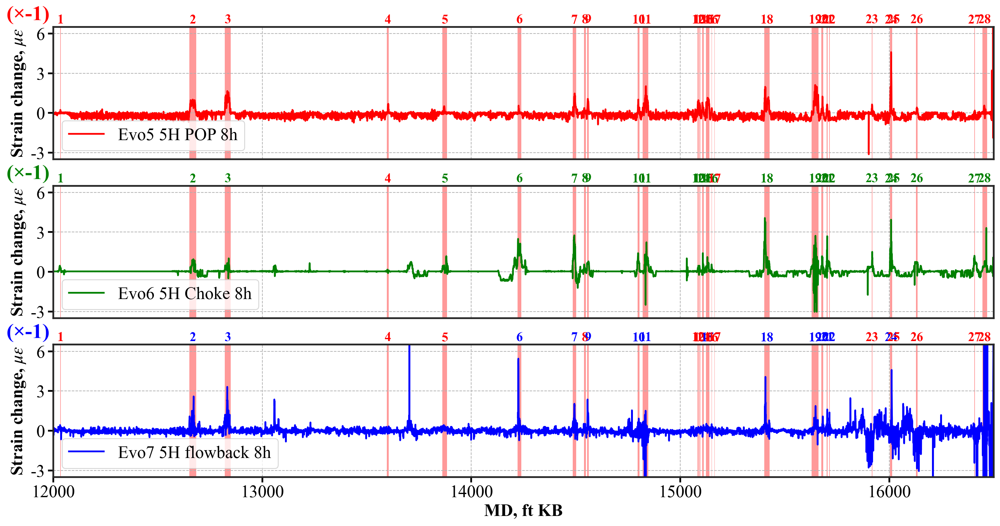

In [10]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'

EVO6_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 6 (choke)/corrected_within_1h_(with_data_wash).h5'

EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration helpers
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift


def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())


def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi))

    return out


def intervals_channel_to_md_labeled(intervals_ch, depth_arr, md_min, md_max):
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for k, (a, b) in enumerate(intervals_ch, start=1):
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi, k))

    return out


def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)


def add_interval_labels(ax, labeled_intervals, color, y_axes, fontsize=10,
                        special_ids=None, special_color=None):
    """
    labeled_intervals: [(a, b, label), ...]
    special_ids 按原始 label 判断
    """
    if special_ids is None:
        special_ids = set()

    for a, b, label in labeled_intervals:
        mid = 0.5 * (a + b)

        this_color = special_color if (label in special_ids and special_color is not None) else color

        ax.text(
            mid, y_axes, f"{label}",
            transform=ax.get_xaxis_transform(),
            ha="center", va="center",
            fontsize=fontsize,
            color=this_color,
            fontweight="bold",
            clip_on=False
        )


# =========================================================
# 2) EVO5 settings
# =========================================================
EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 8]
EVO5_LABEL = "Evo5 5H POP 8h"
EVO5_YLIM = (-3.5, 6.5)
EVO5_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    # (41531,41591), #5     not good behavior when marked the peak
    (42035,42105), #6
    # (43087,43107), #7     not good behavior when marked the peak
    (43128,43180), #8
    (43927,43976), #9
    (44091,44120), #10
    (44138,44161), #11
    (44869,44895), #12
    (44941,45025), #13
    (45739,45754), #14
    (45767,45778), #15
    (45805,45827), #16
    (45859,45912), #17
    (45941,45947), #18
    (45983,45987), #19
    (46706,46784), #20
    (47395,47495), #21
    (47533,47560), #22
    (47611,47625), #23
    (47649,47659), #24
    (48265,48275), #25
    (48531,48562), #26
    (48583,48586), #27
    (48909,48932), #28
    (49753,49763), #29
    (49871,49939), #30
]


# =========================================================
# 2.5) EVO6 settings
# =========================================================

EVO6_DATA_KEY = "strain_corrected"   
EVO6_DEPTH_MIN = 12000.0
EVO6_DEPTH_MAX = 16500.0
EVO6_START_TIME = datetime.datetime(2022, 4, 3, 1, 0)
EVO6_OFFSETS_H = [0, 8]
EVO6_LABEL = "Evo6 5H Choke 8h"

EVO6_YLIM = (-3.5, 6.5)
EVO6_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO6 = [
    # TODO: replace with real EVO6 intervals
    (36491,36499),
    (38366,38463),
]

# 是否对 EVO6 做 shift
EVO6_USE_SHIFT = True

# 如果要 shift，改这里
EVO6_SHIFT_Z0 = 12000.0
EVO6_SHIFT_Z1 = 16000.0
EVO6_SHIFT_S0 = -40.0
EVO6_SHIFT_S1 = -50.0


# =========================================================
# 3) EVO7 settings
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0, 8]
EVO7_LABEL = "Evo7 5H flowback 8h"
EVO7_YLIM = (-3.5, 6.5)
EVO7_YTICKS = np.arange(-3, 7, 3)


EVO7_SHIFT_S0 = -40.0
EVO7_SHIFT_S1 = -45.0

RESP_INTERVALS_EVO7 = [
    (38364,38434),  #1
    (38869,38922),  #2
    (39593,39605),  #3  new fracture
    (39653,39659),  #4  new fracture
    # (41410,41422),  #5  small magnitude, delayed response, deleted
    (43122,43159),  #6
    # (43230,43236),  #7  small magnitude, deleted
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    # (45756,45804),  #12 delayed response, deleted
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    # (47600,47644),  #old 17 , separated into 2 
    (47600,47610),  #17a
    (47635,47644),  #17b
    (48522,48540),  #18
]

# =========================================================
# 4) Shared styles
# =========================================================
style_evo5 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "red"
}

style_evo6 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "g"   
}

style_evo7 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "#0000FF"
}

EVO5_INTERVAL_COLOR = "red"
EVO6_INTERVAL_COLOR = "red"
EVO7_INTERVAL_COLOR = "red"

# 需要特殊改色的编号（按原始编号）
EVO5_SPECIAL_IDS = set()
EVO5_SPECIAL_COLOR = None

EVO6_SPECIAL_IDS = {1, 2, 3, 5, 
                    6, 7, 8, 9, 10, 
                    11, 12, 13, 14, 15,
                    16, 18, 19, 20,
                    21, 22, 23, 24, 25,
                    26, 27, 28 }

EVO6_SPECIAL_COLOR = "green"



EVO7_SPECIAL_IDS = {2, 3, 6, 7, 9, 10, 11, 15, 18, 19, 20, 21, 22, 24}
EVO7_SPECIAL_COLOR = "#0000FF"

HIGHLIGHT_ALPHA = 0.4


# =========================================================
# 5) Shared MD range
# =========================================================
MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX


# =========================================================
# 6) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

mask5 = (depth5 >= MD_MIN) & (depth5 <= MD_MAX)
depth5_win = depth5[mask5]

test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

# TODO: replace with your actual EVO5 output formula if needed
out5 = -1 * (profiles5["P2"] - profiles5["P1"])


# =========================================================
# 7) Load EVO6
# =========================================================
f6 = h5py.File(EVO6_H5, "r")
d6 = f6[EVO6_DATA_KEY][...]
depth6_raw = np.asarray(f6["depth"][...], float)
stamps6 = f6["stamps"]
t6 = decode_stamps_to_datetimeindex(stamps6, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO6] dstrain:", d6.shape, " depth:", depth6_raw.shape, " time:", len(t6))

if EVO6_USE_SHIFT:
    depth6 = shift_depth_piecewise(
        depth6_raw,
        z0=EVO6_SHIFT_Z0,
        z1=EVO6_SHIFT_Z1,
        s0=EVO6_SHIFT_S0,
        s1=EVO6_SHIFT_S1
    )
else:
    depth6 = depth6_raw.copy()

mask6 = (depth6 >= MD_MIN) & (depth6 <= MD_MAX)
depth6_win = depth6[mask6]

test_time6 = [EVO6_START_TIME + datetime.timedelta(hours=h) for h in EVO6_OFFSETS_H]
labels6 = [f"P{i+1}" for i in range(len(test_time6))]

idx6 = {}
for lab, tt in zip(labels6, test_time6):
    idx6[lab] = find_nearest_time_index(t6, pd.to_datetime(tt))

profiles6 = {}
for lab in labels6:
    profiles6[lab] = d6[idx6[lab], mask6]

# TODO: replace with your actual EVO6 output formula
out6 = -1 * (profiles6["P2"] - profiles6["P1"])


# =========================================================
# 8) Load EVO7 + apply MD calibration
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=EVO7_SHIFT_S0, s1=EVO7_SHIFT_S1)

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

# TODO: replace with your actual EVO7 output formula if needed
out7 = -1 * (profiles7["P2"] - profiles7["P1"])


# =========================================================
# 9) Convert intervals to MD
# =========================================================
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals5_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)

# intervals6_md = intervals_channel_to_md(RESP_INTERVALS_EVO6, depth6, MD_MIN, MD_MAX)
# intervals6_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO6, depth6, MD_MIN, MD_MAX)

# intervals7_md = intervals_channel_to_md(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)
# intervals7_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)


# =========================================================
# 10) Plot 3x1
# =========================================================
fig, axes = plt.subplots(
    3, 1,
    figsize=(16, 8.5),
    sharex=True,
    gridspec_kw={"height_ratios": [1, 1, 1]}
)

ax5_str, ax6_str, ax7_str = axes


# ---------------------------------------------------------
# Row1: EVO5
# ---------------------------------------------------------
for (a, b) in intervals5_md:
    ax5_str.axvspan(
        a, b,
        facecolor=EVO5_INTERVAL_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )


ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **style_evo5, zorder=2)
ax5_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax5_str.set_ylim(*EVO5_YLIM)
ax5_str.set_yticks(EVO5_YTICKS)
ax5_str.grid(True, linestyle="--", zorder=1)
ax5_str.legend(loc="lower left")

ax5_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax5_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color=style_evo5["color"]
)

ax5_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

add_interval_labels(
    ax5_str,
    intervals5_md_labeled,
    color=EVO5_INTERVAL_COLOR,
    y_axes=1.05,
    fontsize=15,
    special_ids=EVO5_SPECIAL_IDS,
    special_color=EVO5_SPECIAL_COLOR
)


# ---------------------------------------------------------
# Row2: EVO6
# ---------------------------------------------------------

for (a, b) in intervals5_md:
    ax6_str.axvspan(
        a, b,
        facecolor=EVO5_INTERVAL_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )


ax6_str.plot(depth6_win, out6, label=EVO6_LABEL, **style_evo6, zorder=2)
ax6_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax6_str.set_ylim(*EVO6_YLIM)
ax6_str.set_yticks(EVO6_YTICKS)
ax6_str.grid(True, linestyle="--", zorder=1)
ax6_str.legend(loc="lower left")

ax6_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax6_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color=style_evo6["color"]
)

ax6_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

add_interval_labels(
    ax6_str,
    intervals5_md_labeled,
    color=EVO6_INTERVAL_COLOR,
    y_axes=1.05,
    fontsize=15,
    special_ids=EVO6_SPECIAL_IDS,
    special_color=EVO6_SPECIAL_COLOR
)


# ---------------------------------------------------------
# Row3: EVO7
# ---------------------------------------------------------
for (a, b) in intervals5_md:
    ax7_str.axvspan(
        a, b,
        facecolor=EVO5_INTERVAL_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )

ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **style_evo7, zorder=2)
ax7_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax7_str.set_ylim(*EVO7_YLIM)
ax7_str.set_yticks(EVO7_YTICKS)
ax7_str.grid(True, linestyle="--", zorder=1)
ax7_str.legend(loc="lower left")

ax7_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax7_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color=style_evo7["color"]
)

md_ticks = np.arange(int(MD_MIN), int(MD_MAX) + 1, 1000)
ax7_str.set_xticks(md_ticks)
ax7_str.set_xlabel("MD, ft KB")
ax7_str.tick_params(axis="x", top=False, bottom=True, labeltop=False, labelbottom=True, pad=3)

add_interval_labels(
    ax7_str,
    intervals5_md_labeled,
    color=EVO7_INTERVAL_COLOR,
    y_axes=1.05,
    fontsize=15,
    special_ids=EVO7_SPECIAL_IDS,
    special_color=EVO7_SPECIAL_COLOR
)


# =========================================================
# 11) Shared settings
# =========================================================
for ax in axes:
    ax.set_xlim(MD_MIN, MD_MAX)
    style_full_box(ax, lw=2)

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)
plt.show()

f5.close()
f6.close()
f7.close()

## V2

[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO6] dstrain: (1458, 57168)  depth: (57168,)  time: 1458
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


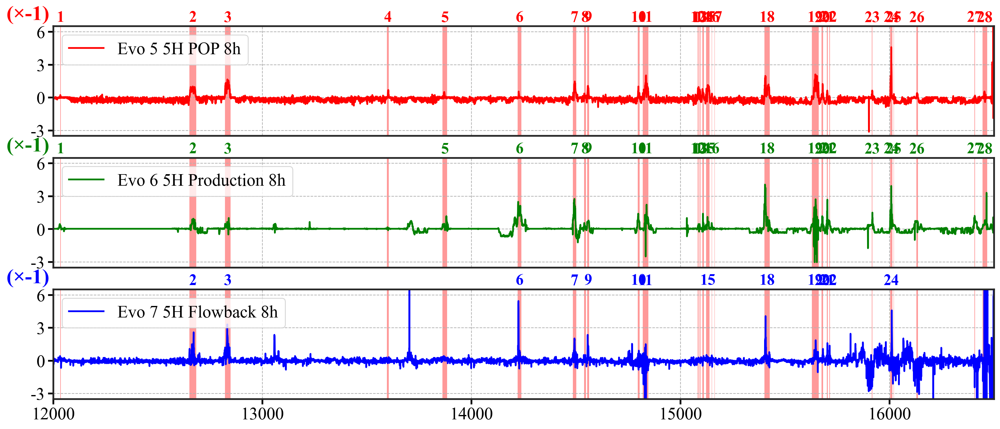

In [24]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'

EVO6_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 6 (choke)/corrected_within_1h_(with_data_wash).h5'

EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration helpers
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift


def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())


def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi))

    return out


def intervals_channel_to_md_labeled(intervals_ch, depth_arr, md_min, md_max):
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for k, (a, b) in enumerate(intervals_ch, start=1):
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi, k))

    return out


def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)


def add_interval_labels(ax, labeled_intervals, color, y_axes, fontsize=10,
                        special_ids=None, special_color=None,
                        show_only_special=False):
    """
    labeled_intervals: [(a, b, label), ...]
    show_only_special=True 时，只显示 special_ids 里的编号
    """
    if special_ids is None:
        special_ids = set()

    for a, b, label in labeled_intervals:
        if show_only_special and (label not in special_ids):
            continue

        mid = 0.5 * (a + b)
        this_color = special_color if (label in special_ids and special_color is not None) else color

        ax.text(
            mid, y_axes, f"{label}",
            transform=ax.get_xaxis_transform(),
            ha="center", va="center",
            fontsize=fontsize,
            color=this_color,
            fontweight="bold",
            clip_on=False
        )


# =========================================================
# 2) EVO5 settings
# =========================================================
EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 8]
EVO5_LABEL = "Evo 5 5H POP 8h"
EVO5_YLIM = (-3.5, 6.5)
EVO5_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    # (41531,41591), #5     not good behavior when marked the peak
    (42035,42105), #6
    # (43087,43107), #7     not good behavior when marked the peak
    (43128,43180), #8
    (43927,43976), #9
    (44091,44120), #10
    (44138,44161), #11
    (44869,44895), #12
    (44941,45025), #13
    (45739,45754), #14
    (45767,45778), #15
    (45805,45827), #16
    (45859,45912), #17
    (45941,45947), #18
    (45983,45987), #19
    (46706,46784), #20
    (47395,47495), #21
    (47533,47560), #22
    (47611,47625), #23
    (47649,47659), #24
    (48265,48275), #25
    (48531,48562), #26
    (48583,48586), #27
    (48909,48932), #28
    (49753,49763), #29
    (49871,49939), #30
]


# =========================================================
# 2.5) EVO6 settings
# =========================================================

EVO6_DATA_KEY = "strain_corrected"   
EVO6_DEPTH_MIN = 12000.0
EVO6_DEPTH_MAX = 16500.0
EVO6_START_TIME = datetime.datetime(2022, 4, 3, 1, 0)
EVO6_OFFSETS_H = [0, 8]
EVO6_LABEL = "Evo 6 5H Production 8h"

EVO6_YLIM = (-3.5, 6.5)
EVO6_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO6 = [
    # TODO: replace with real EVO6 intervals
    (36491,36499),
    (38366,38463),
]

# 是否对 EVO6 做 shift
EVO6_USE_SHIFT = True

# 如果要 shift，改这里
EVO6_SHIFT_Z0 = 12000.0
EVO6_SHIFT_Z1 = 16000.0
EVO6_SHIFT_S0 = -40.0
EVO6_SHIFT_S1 = -50.0


# =========================================================
# 3) EVO7 settings
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0, 8]
EVO7_LABEL = "Evo 7 5H Flowback 8h"
EVO7_YLIM = (-3.5, 6.5)
EVO7_YTICKS = np.arange(-3, 7, 3)


EVO7_SHIFT_S0 = -40.0
EVO7_SHIFT_S1 = -45.0

RESP_INTERVALS_EVO7 = [
    (38364,38434),  #1
    (38869,38922),  #2
    (39593,39605),  #3  new fracture
    (39653,39659),  #4  new fracture
    # (41410,41422),  #5  small magnitude, delayed response, deleted
    (43122,43159),  #6
    # (43230,43236),  #7  small magnitude, deleted
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    # (45756,45804),  #12 delayed response, deleted
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    # (47600,47644),  #old 17 , separated into 2 
    (47600,47610),  #17a
    (47635,47644),  #17b
    (48522,48540),  #18
]

# =========================================================
# 4) Shared styles
# =========================================================
style_evo5 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "red"
}

style_evo6 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "g"   
}

style_evo7 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "#0000FF"
}

EVO5_INTERVAL_COLOR = "red"
EVO6_INTERVAL_COLOR = "red"
EVO7_INTERVAL_COLOR = "red"

# 需要特殊改色的编号（按原始编号）
EVO5_SPECIAL_IDS = set()
EVO5_SPECIAL_COLOR = None

EVO6_SPECIAL_IDS = {1, 2, 3, 5, 
                    6, 7, 8, 9, 10, 
                    11, 12, 13, 14, 15,
                    16, 18, 19, 20,
                    21, 22, 23, 24, 25,
                    26, 27, 28 }

EVO6_SPECIAL_COLOR = "green"



EVO7_SPECIAL_IDS = {2, 3, 6, 7, 9, 10, 11, 15, 18, 19, 20, 21, 22, 24}
EVO7_SPECIAL_COLOR = "#0000FF"

HIGHLIGHT_ALPHA = 0.4


# =========================================================
# 5) Shared MD range
# =========================================================
MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX


# =========================================================
# 6) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

mask5 = (depth5 >= MD_MIN) & (depth5 <= MD_MAX)
depth5_win = depth5[mask5]

test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

# TODO: replace with your actual EVO5 output formula if needed
out5 = -1 * (profiles5["P2"] - profiles5["P1"])


# =========================================================
# 7) Load EVO6
# =========================================================
f6 = h5py.File(EVO6_H5, "r")
d6 = f6[EVO6_DATA_KEY][...]
depth6_raw = np.asarray(f6["depth"][...], float)
stamps6 = f6["stamps"]
t6 = decode_stamps_to_datetimeindex(stamps6, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO6] dstrain:", d6.shape, " depth:", depth6_raw.shape, " time:", len(t6))

if EVO6_USE_SHIFT:
    depth6 = shift_depth_piecewise(
        depth6_raw,
        z0=EVO6_SHIFT_Z0,
        z1=EVO6_SHIFT_Z1,
        s0=EVO6_SHIFT_S0,
        s1=EVO6_SHIFT_S1
    )
else:
    depth6 = depth6_raw.copy()

mask6 = (depth6 >= MD_MIN) & (depth6 <= MD_MAX)
depth6_win = depth6[mask6]

test_time6 = [EVO6_START_TIME + datetime.timedelta(hours=h) for h in EVO6_OFFSETS_H]
labels6 = [f"P{i+1}" for i in range(len(test_time6))]

idx6 = {}
for lab, tt in zip(labels6, test_time6):
    idx6[lab] = find_nearest_time_index(t6, pd.to_datetime(tt))

profiles6 = {}
for lab in labels6:
    profiles6[lab] = d6[idx6[lab], mask6]

# TODO: replace with your actual EVO6 output formula
out6 = -1 * (profiles6["P2"] - profiles6["P1"])


# =========================================================
# 8) Load EVO7 + apply MD calibration
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=EVO7_SHIFT_S0, s1=EVO7_SHIFT_S1)

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

# TODO: replace with your actual EVO7 output formula if needed
out7 = -1 * (profiles7["P2"] - profiles7["P1"])


# =========================================================
# 9) Convert intervals to MD
# =========================================================
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals5_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)

# intervals6_md = intervals_channel_to_md(RESP_INTERVALS_EVO6, depth6, MD_MIN, MD_MAX)
# intervals6_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO6, depth6, MD_MIN, MD_MAX)

# intervals7_md = intervals_channel_to_md(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)
# intervals7_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)


# =========================================================
# 10) Plot 3x1
# =========================================================
fig, axes = plt.subplots(
    3, 1,
    figsize=(16, 7),
    sharex=True,
    gridspec_kw={"height_ratios": [1, 1, 1]}
)

ax5_str, ax6_str, ax7_str = axes


# ---------------------------------------------------------
# Row1: EVO5
# ---------------------------------------------------------
for (a, b) in intervals5_md:
    ax5_str.axvspan(
        a, b,
        facecolor=EVO5_INTERVAL_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )


ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **style_evo5, zorder=2)
# ax5_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax5_str.set_ylim(*EVO5_YLIM)
ax5_str.set_yticks(EVO5_YTICKS)
ax5_str.grid(True, linestyle="--", zorder=1)
ax5_str.legend(loc="upper left", fontsize=20)
# ax5_str.legend(loc="lower left", fontsize=20)

ax5_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax5_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color=style_evo5["color"]
)

ax5_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

add_interval_labels(
    ax5_str,
    intervals5_md_labeled,
    color=EVO5_INTERVAL_COLOR,
    y_axes=1.075,
    fontsize=18,
    special_ids=EVO5_SPECIAL_IDS,
    special_color=EVO5_SPECIAL_COLOR
)


# ---------------------------------------------------------
# Row2: EVO6
# ---------------------------------------------------------

for (a, b) in intervals5_md:
    ax6_str.axvspan(
        a, b,
        facecolor=EVO5_INTERVAL_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )


ax6_str.plot(depth6_win, out6, label=EVO6_LABEL, **style_evo6, zorder=2)
# ax6_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax6_str.set_ylim(*EVO6_YLIM)
ax6_str.set_yticks(EVO6_YTICKS)
ax6_str.grid(True, linestyle="--", zorder=1)
ax6_str.legend(loc="upper left", fontsize=20)
# ax6_str.legend(loc="lower left", fontsize=20)

ax6_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax6_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color=style_evo6["color"]
)

ax6_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)


add_interval_labels(
    ax6_str,
    intervals5_md_labeled,
    color=EVO6_INTERVAL_COLOR,
    y_axes=1.075,
    fontsize=18,
    special_ids=EVO6_SPECIAL_IDS,
    special_color=EVO6_SPECIAL_COLOR,
    show_only_special=True
)

# add_interval_labels(
#     ax6_str,
#     intervals5_md_labeled,
#     color=EVO6_INTERVAL_COLOR,
#     y_axes=1.05,
#     fontsize=15,
#     special_ids=EVO6_SPECIAL_IDS,
#     special_color=EVO6_SPECIAL_COLOR
# )

# ---------------------------------------------------------
# Row3: EVO7
# ---------------------------------------------------------
for (a, b) in intervals5_md:
    ax7_str.axvspan(
        a, b,
        facecolor=EVO5_INTERVAL_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )

ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **style_evo7, zorder=2)
# ax7_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax7_str.set_ylim(*EVO7_YLIM)
ax7_str.set_yticks(EVO7_YTICKS)
ax7_str.grid(True, linestyle="--", zorder=1)
ax7_str.legend(loc="upper left", fontsize=20)

ax7_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax7_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color=style_evo7["color"]
)

md_ticks = np.arange(int(MD_MIN), int(MD_MAX) + 1, 1000)
ax7_str.set_xticks(md_ticks)
# ax7_str.set_xlabel("MD, ft KB")
ax7_str.tick_params(axis="x", top=False, bottom=True, labeltop=False, labelbottom=True, pad=3)


add_interval_labels(
    ax7_str,
    intervals5_md_labeled,
    color=EVO7_INTERVAL_COLOR,
    y_axes=1.075,
    fontsize=18,
    special_ids=EVO7_SPECIAL_IDS,
    special_color=EVO7_SPECIAL_COLOR,
    show_only_special=True
)


# add_interval_labels(
#     ax7_str,
#     intervals5_md_labeled,
#     color=EVO7_INTERVAL_COLOR,
#     y_axes=1.05,
#     fontsize=15,
#     special_ids=EVO7_SPECIAL_IDS,
#     special_color=EVO7_SPECIAL_COLOR
# )


# =========================================================
# 11) Shared settings
# =========================================================
for ax in axes:
    ax.set_xlim(MD_MIN, MD_MAX)
    style_full_box(ax, lw=2)

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)
plt.show()

f5.close()
f6.close()
f7.close()

[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO6] dstrain: (1458, 57168)  depth: (57168,)  time: 1458
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


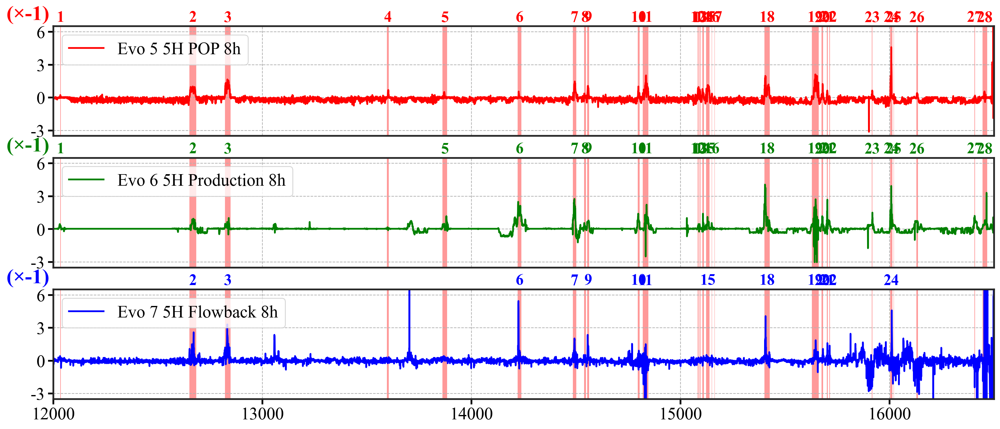

In [ ]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'

EVO6_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 6 (choke)/corrected_within_1h_(with_data_wash).h5'

EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration helpers
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift


def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())


def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi))

    return out


def intervals_channel_to_md_labeled(intervals_ch, depth_arr, md_min, md_max):
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for k, (a, b) in enumerate(intervals_ch, start=1):
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi, k))

    return out


def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)


def add_interval_labels(ax, labeled_intervals, color, y_axes, fontsize=10,
                        special_ids=None, special_color=None,
                        show_only_special=False):
    """
    labeled_intervals: [(a, b, label), ...]
    show_only_special=True 时，只显示 special_ids 里的编号
    """
    if special_ids is None:
        special_ids = set()

    for a, b, label in labeled_intervals:
        if show_only_special and (label not in special_ids):
            continue

        mid = 0.5 * (a + b)
        this_color = special_color if (label in special_ids and special_color is not None) else color

        ax.text(
            mid, y_axes, f"{label}",
            transform=ax.get_xaxis_transform(),
            ha="center", va="center",
            fontsize=fontsize,
            color=this_color,
            fontweight="bold",
            clip_on=False
        )


# =========================================================
# 2) EVO5 settings
# =========================================================
EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 8]
EVO5_LABEL = "Evo 5 5H POP 8h"
EVO5_YLIM = (-3.5, 6.5)
EVO5_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    # (41531,41591), #5     not good behavior when marked the peak
    (42035,42105), #6
    # (43087,43107), #7     not good behavior when marked the peak
    (43128,43180), #8
    (43927,43976), #9
    (44091,44120), #10
    (44138,44161), #11
    (44869,44895), #12
    (44941,45025), #13
    (45739,45754), #14
    (45767,45778), #15
    (45805,45827), #16
    (45859,45912), #17
    (45941,45947), #18
    (45983,45987), #19
    (46706,46784), #20
    (47395,47495), #21
    (47533,47560), #22
    (47611,47625), #23
    (47649,47659), #24
    (48265,48275), #25
    (48531,48562), #26
    (48583,48586), #27
    (48909,48932), #28
    (49753,49763), #29
    (49871,49939), #30
]


# =========================================================
# 2.5) EVO6 settings
# =========================================================

EVO6_DATA_KEY = "strain_corrected"   
EVO6_DEPTH_MIN = 12000.0
EVO6_DEPTH_MAX = 16500.0
EVO6_START_TIME = datetime.datetime(2022, 4, 3, 1, 0)
EVO6_OFFSETS_H = [0, 8]
EVO6_LABEL = "Evo 6 5H Production 8h"

EVO6_YLIM = (-3.5, 6.5)
EVO6_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO6 = [
    # TODO: replace with real EVO6 intervals
    (36491,36499),
    (38366,38463),
]

# 是否对 EVO6 做 shift
EVO6_USE_SHIFT = True

# 如果要 shift，改这里
EVO6_SHIFT_Z0 = 12000.0
EVO6_SHIFT_Z1 = 16000.0
EVO6_SHIFT_S0 = -40.0
EVO6_SHIFT_S1 = -50.0


# =========================================================
# 3) EVO7 settings
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0, 8]
EVO7_LABEL = "Evo 7 5H Flowback 8h"
EVO7_YLIM = (-3.5, 6.5)
EVO7_YTICKS = np.arange(-3, 7, 3)


EVO7_SHIFT_S0 = -40.0
EVO7_SHIFT_S1 = -45.0

RESP_INTERVALS_EVO7 = [
    (38364,38434),  #1
    (38869,38922),  #2
    (39593,39605),  #3  new fracture
    (39653,39659),  #4  new fracture
    # (41410,41422),  #5  small magnitude, delayed response, deleted
    (43122,43159),  #6
    # (43230,43236),  #7  small magnitude, deleted
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    # (45756,45804),  #12 delayed response, deleted
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    # (47600,47644),  #old 17 , separated into 2 
    (47600,47610),  #17a
    (47635,47644),  #17b
    (48522,48540),  #18
]

# =========================================================
# 4) Shared styles
# =========================================================
style_evo5 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "red"
}

style_evo6 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "g"   
}

style_evo7 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "#0000FF"
}

EVO5_INTERVAL_COLOR = "red"
EVO6_INTERVAL_COLOR = "red"
EVO7_INTERVAL_COLOR = "red"

# 需要特殊改色的编号（按原始编号）
EVO5_SPECIAL_IDS = set()
EVO5_SPECIAL_COLOR = None

EVO6_SPECIAL_IDS = {1, 2, 3, 5, 
                    6, 7, 8, 9, 10, 
                    11, 12, 13, 14, 15,
                    16, 18, 19, 20,
                    21, 22, 23, 24, 25,
                    26, 27, 28 }

EVO6_SPECIAL_COLOR = "green"



EVO7_SPECIAL_IDS = {2, 3, 6, 7, 9, 10, 11, 15, 18, 19, 20, 21, 22, 24}
EVO7_SPECIAL_COLOR = "#0000FF"

HIGHLIGHT_ALPHA = 0.4


# =========================================================
# 5) Shared MD range
# =========================================================
MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX


# =========================================================
# 6) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

mask5 = (depth5 >= MD_MIN) & (depth5 <= MD_MAX)
depth5_win = depth5[mask5]

test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

# TODO: replace with your actual EVO5 output formula if needed
out5 = -1 * (profiles5["P2"] - profiles5["P1"])


# =========================================================
# 7) Load EVO6
# =========================================================
f6 = h5py.File(EVO6_H5, "r")
d6 = f6[EVO6_DATA_KEY][...]
depth6_raw = np.asarray(f6["depth"][...], float)
stamps6 = f6["stamps"]
t6 = decode_stamps_to_datetimeindex(stamps6, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO6] dstrain:", d6.shape, " depth:", depth6_raw.shape, " time:", len(t6))

if EVO6_USE_SHIFT:
    depth6 = shift_depth_piecewise(
        depth6_raw,
        z0=EVO6_SHIFT_Z0,
        z1=EVO6_SHIFT_Z1,
        s0=EVO6_SHIFT_S0,
        s1=EVO6_SHIFT_S1
    )
else:
    depth6 = depth6_raw.copy()

mask6 = (depth6 >= MD_MIN) & (depth6 <= MD_MAX)
depth6_win = depth6[mask6]

test_time6 = [EVO6_START_TIME + datetime.timedelta(hours=h) for h in EVO6_OFFSETS_H]
labels6 = [f"P{i+1}" for i in range(len(test_time6))]

idx6 = {}
for lab, tt in zip(labels6, test_time6):
    idx6[lab] = find_nearest_time_index(t6, pd.to_datetime(tt))

profiles6 = {}
for lab in labels6:
    profiles6[lab] = d6[idx6[lab], mask6]

# TODO: replace with your actual EVO6 output formula
out6 = -1 * (profiles6["P2"] - profiles6["P1"])


# =========================================================
# 8) Load EVO7 + apply MD calibration
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=EVO7_SHIFT_S0, s1=EVO7_SHIFT_S1)

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

# TODO: replace with your actual EVO7 output formula if needed
out7 = -1 * (profiles7["P2"] - profiles7["P1"])


# =========================================================
# 9) Convert intervals to MD
# =========================================================
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals5_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)

# intervals6_md = intervals_channel_to_md(RESP_INTERVALS_EVO6, depth6, MD_MIN, MD_MAX)
# intervals6_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO6, depth6, MD_MIN, MD_MAX)

# intervals7_md = intervals_channel_to_md(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)
# intervals7_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO7, depth7, MD_MIN, MD_MAX)


# =========================================================
# 10) Plot 3x1
# =========================================================
fig, axes = plt.subplots(
    3, 1,
    figsize=(16, 7),
    sharex=True,
    gridspec_kw={"height_ratios": [1, 1, 1]}
)

ax5_str, ax6_str, ax7_str = axes


# ---------------------------------------------------------
# Row1: EVO5
# ---------------------------------------------------------
for (a, b) in intervals5_md:
    ax5_str.axvspan(
        a, b,
        facecolor=EVO5_INTERVAL_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )


ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **style_evo5, zorder=2)
# ax5_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax5_str.set_ylim(*EVO5_YLIM)
ax5_str.set_yticks(EVO5_YTICKS)
ax5_str.grid(True, linestyle="--", zorder=1)
ax5_str.legend(loc="upper left", fontsize=20)
# ax5_str.legend(loc="lower left", fontsize=20)

ax5_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax5_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color=style_evo5["color"]
)

ax5_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

add_interval_labels(
    ax5_str,
    intervals5_md_labeled,
    color=EVO5_INTERVAL_COLOR,
    y_axes=1.075,
    fontsize=18,
    special_ids=EVO5_SPECIAL_IDS,
    special_color=EVO5_SPECIAL_COLOR
)


# ---------------------------------------------------------
# Row2: EVO6
# ---------------------------------------------------------

for (a, b) in intervals5_md:
    ax6_str.axvspan(
        a, b,
        facecolor=EVO5_INTERVAL_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )


ax6_str.plot(depth6_win, out6, label=EVO6_LABEL, **style_evo6, zorder=2)
# ax6_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax6_str.set_ylim(*EVO6_YLIM)
ax6_str.set_yticks(EVO6_YTICKS)
ax6_str.grid(True, linestyle="--", zorder=1)
ax6_str.legend(loc="upper left", fontsize=20)
# ax6_str.legend(loc="lower left", fontsize=20)

ax6_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax6_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color=style_evo6["color"]
)

ax6_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)


add_interval_labels(
    ax6_str,
    intervals5_md_labeled,
    color=EVO6_INTERVAL_COLOR,
    y_axes=1.075,
    fontsize=18,
    special_ids=EVO6_SPECIAL_IDS,
    special_color=EVO6_SPECIAL_COLOR,
    show_only_special=True
)

# add_interval_labels(
#     ax6_str,
#     intervals5_md_labeled,
#     color=EVO6_INTERVAL_COLOR,
#     y_axes=1.05,
#     fontsize=15,
#     special_ids=EVO6_SPECIAL_IDS,
#     special_color=EVO6_SPECIAL_COLOR
# )

# ---------------------------------------------------------
# Row3: EVO7
# ---------------------------------------------------------
for (a, b) in intervals5_md:
    ax7_str.axvspan(
        a, b,
        facecolor=EVO5_INTERVAL_COLOR,
        alpha=HIGHLIGHT_ALPHA,
        edgecolor='none',
        linewidth=0,
        zorder=0
    )

ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **style_evo7, zorder=2)
# ax7_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
ax7_str.set_ylim(*EVO7_YLIM)
ax7_str.set_yticks(EVO7_YTICKS)
ax7_str.grid(True, linestyle="--", zorder=1)
ax7_str.legend(loc="upper left", fontsize=20)

ax7_str.text(
    -0.05, 1.02, "(×-1)",
    transform=ax7_str.transAxes,
    ha="left", va="bottom",
    fontsize=24, fontweight="bold",
    color=style_evo7["color"]
)

md_ticks = np.arange(int(MD_MIN), int(MD_MAX) + 1, 1000)
ax7_str.set_xticks(md_ticks)
# ax7_str.set_xlabel("MD, ft KB")
ax7_str.tick_params(axis="x", top=False, bottom=True, labeltop=False, labelbottom=True, pad=3)


add_interval_labels(
    ax7_str,
    intervals5_md_labeled,
    color=EVO7_INTERVAL_COLOR,
    y_axes=1.075,
    fontsize=18,
    special_ids=EVO7_SPECIAL_IDS,
    special_color=EVO7_SPECIAL_COLOR,
    show_only_special=True
)


# add_interval_labels(
#     ax7_str,
#     intervals5_md_labeled,
#     color=EVO7_INTERVAL_COLOR,
#     y_axes=1.05,
#     fontsize=15,
#     special_ids=EVO7_SPECIAL_IDS,
#     special_color=EVO7_SPECIAL_COLOR
# )


# =========================================================
# 11) Shared settings
# =========================================================
for ax in axes:
    ax.set_xlim(MD_MIN, MD_MAX)
    style_full_box(ax, lw=2)

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)
plt.show()

f5.close()
f6.close()
f7.close()

# Separate Evo 5 & 6 & 7

## V1

[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO6] dstrain: (1458, 57168)  depth: (57168,)  time: 1458
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


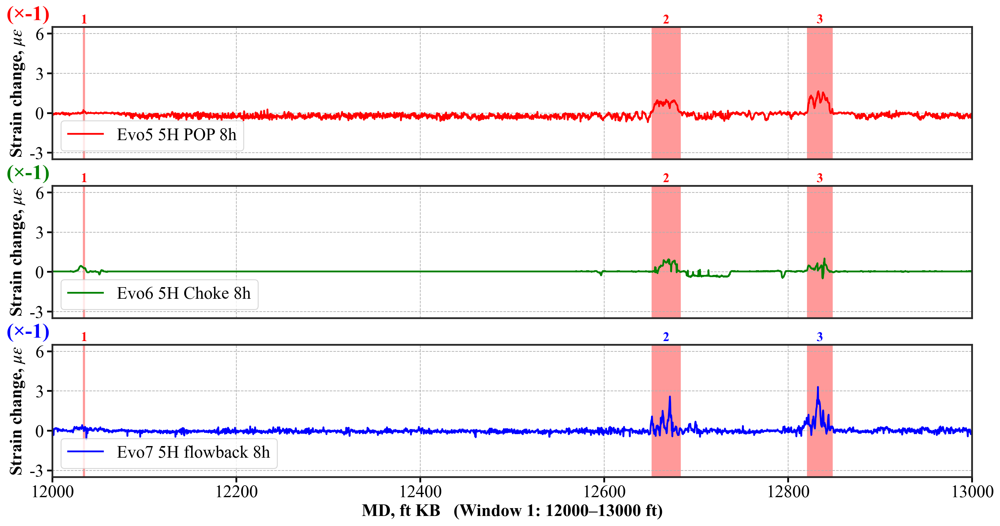

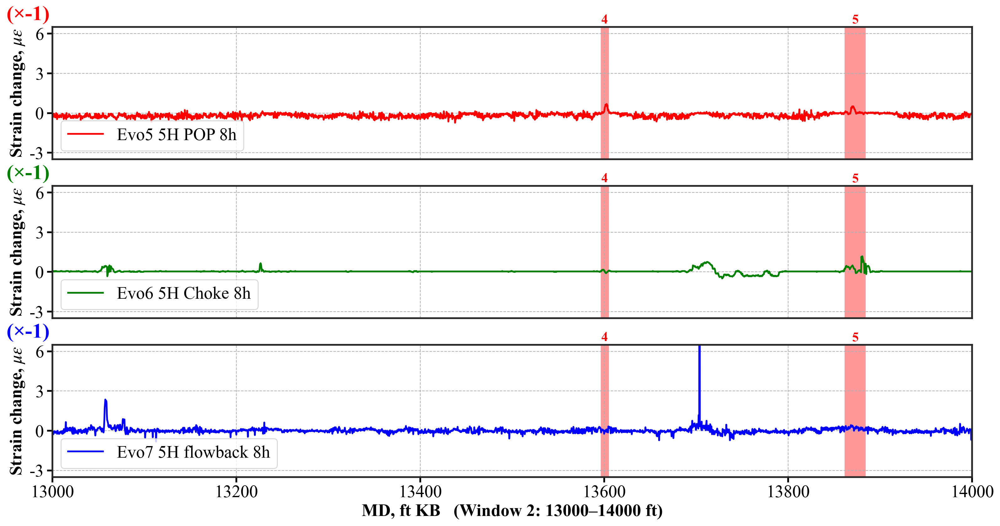

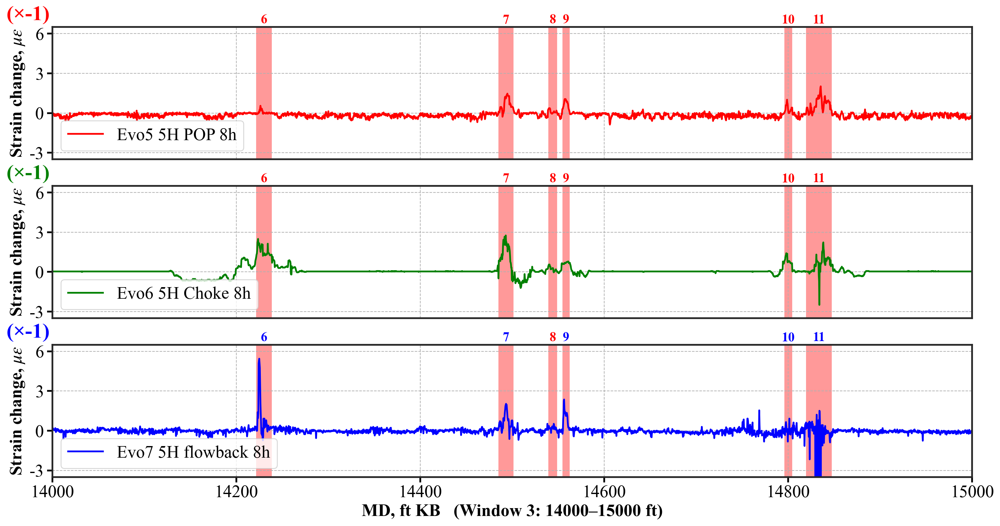

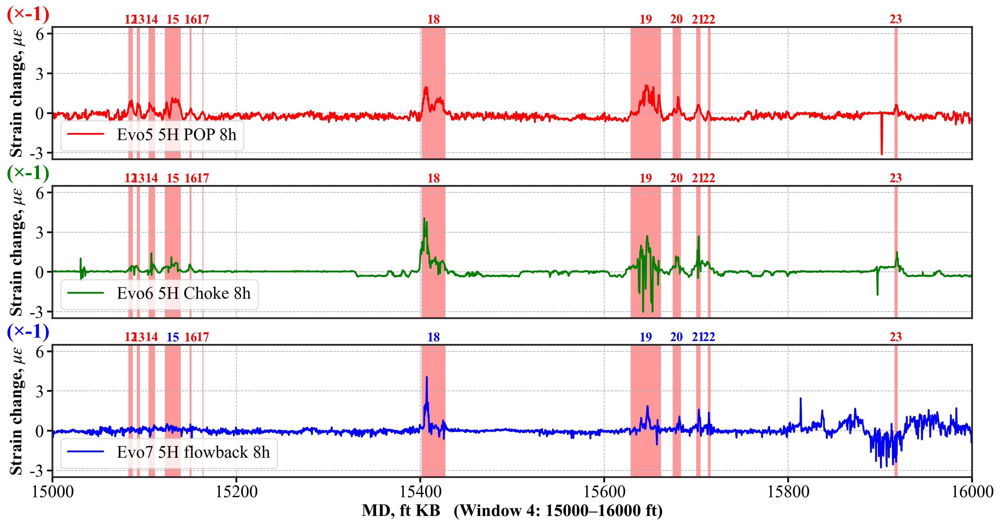

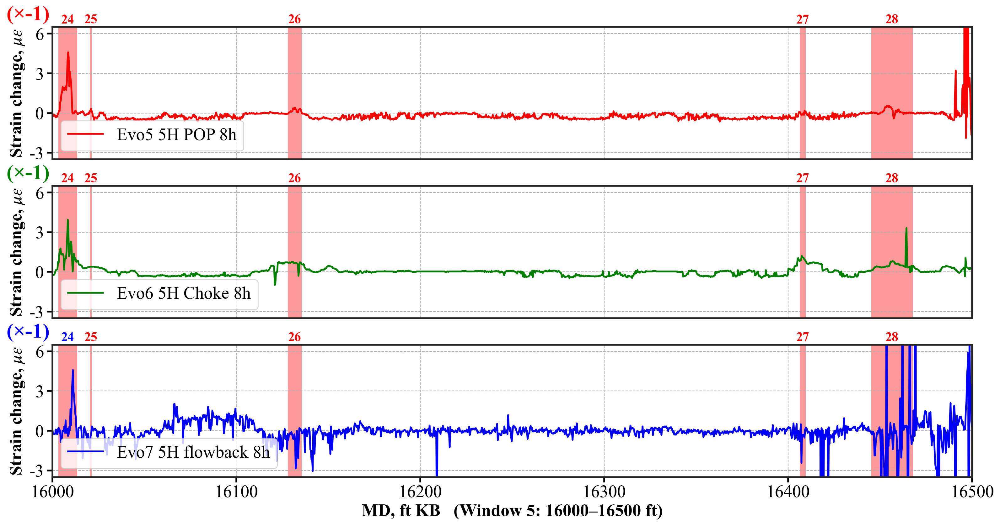

In [7]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'
EVO6_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 6 (choke)/corrected_within_1h_(with_data_wash).h5'
EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration helpers
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift


def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())


def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi))

    return out


def intervals_channel_to_md_labeled(intervals_ch, depth_arr, md_min, md_max):
    """
    Return: [(md_lo, md_hi, label), ...]
    label is assigned by current list order.
    """
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for k, (a, b) in enumerate(intervals_ch, start=1):
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)

        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi, k))

    return out


def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)


def add_interval_labels(ax, labeled_intervals, color, y_axes, fontsize=10,
                        special_ids=None, special_color=None):
    """
    labeled_intervals: [(a, b, label), ...]
    special_ids: labels to recolor
    """
    if special_ids is None:
        special_ids = set()

    for a, b, label in labeled_intervals:
        mid = 0.5 * (a + b)

        this_color = special_color if (label in special_ids and special_color is not None) else color

        ax.text(
            mid, y_axes, f"{label}",
            transform=ax.get_xaxis_transform(),
            ha="center", va="center",
            fontsize=fontsize,
            color=this_color,
            fontweight="bold",
            clip_on=False
        )


def filter_labeled_intervals(labeled_intervals, x0, x1):
    """
    Keep only intervals intersecting [x0, x1], and clip them to the window.
    """
    out = []
    for a, b, label in labeled_intervals:
        lo = max(a, x0)
        hi = min(b, x1)
        if hi > lo:
            out.append((lo, hi, label))
    return out


def filter_plain_intervals(intervals, x0, x1):
    """
    Keep only intervals intersecting [x0, x1], and clip them to the window.
    """
    out = []
    for a, b in intervals:
        lo = max(a, x0)
        hi = min(b, x1)
        if hi > lo:
            out.append((lo, hi))
    return out


# =========================================================
# 2) EVO5 settings
# =========================================================
EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 8]
EVO5_LABEL = "Evo5 5H POP 8h"
EVO5_YLIM = (-3.5, 6.5)
EVO5_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    # (41531,41591), #5
    (42035,42105), #6
    # (43087,43107), #7
    (43128,43180), #8
    (43927,43976), #9
    (44091,44120), #10
    (44138,44161), #11
    (44869,44895), #12
    (44941,45025), #13
    (45739,45754), #14
    (45767,45778), #15
    (45805,45827), #16
    (45859,45912), #17
    (45941,45947), #18
    (45983,45987), #19
    (46706,46784), #20
    (47395,47495), #21
    (47533,47560), #22
    (47611,47625), #23
    (47649,47659), #24
    (48265,48275), #25
    (48531,48562), #26
    (48583,48586), #27
    (48909,48932), #28
    (49753,49763), #29
    (49871,49939), #30
]


# =========================================================
# 2.5) EVO6 settings
# =========================================================
EVO6_DATA_KEY = "strain_corrected"
EVO6_DEPTH_MIN = 12000.0
EVO6_DEPTH_MAX = 16500.0
EVO6_START_TIME = datetime.datetime(2022, 4, 3, 1, 0)
EVO6_OFFSETS_H = [0, 8]
EVO6_LABEL = "Evo6 5H Choke 8h"

EVO6_YLIM = (-3.5, 6.5)
EVO6_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO6 = [
    (36491,36499),
    (38366,38463),
]

EVO6_USE_SHIFT = True
EVO6_SHIFT_Z0 = 12000.0
EVO6_SHIFT_Z1 = 16000.0
EVO6_SHIFT_S0 = -40.0
EVO6_SHIFT_S1 = -50.0


# =========================================================
# 3) EVO7 settings
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0, 8]
EVO7_LABEL = "Evo7 5H flowback 8h"
EVO7_YLIM = (-3.5, 6.5)
EVO7_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO7 = [
    (38364,38434),  #1
    (38869,38922),  #2
    (39593,39605),  #3
    (39653,39659),  #4
    (43122,43159),  #6
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    (47600,47610),  #17a
    (47635,47644),  #17b
    (48522,48540),  #18
]


# =========================================================
# 4) Shared styles
# =========================================================
style_evo5 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "red"
}

style_evo6 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "g"
}

style_evo7 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "#0000FF"
}

# 三行图都统一显示 EVO5 的区间
EVO5_INTERVAL_COLOR = "red"
EVO6_INTERVAL_COLOR = "red"
EVO7_INTERVAL_COLOR = "red"

# 需要特殊改色的编号（按当前显示的 label）
EVO5_SPECIAL_IDS = set()
EVO5_SPECIAL_COLOR = None

EVO6_SPECIAL_IDS = set()
EVO6_SPECIAL_COLOR = None

EVO7_SPECIAL_IDS = {2, 3, 6, 7, 9, 10, 11, 15, 18, 19, 20, 21, 22, 24}
EVO7_SPECIAL_COLOR = "#0000FF"

HIGHLIGHT_ALPHA = 0.4


# =========================================================
# 5) Shared MD range
# =========================================================
MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX


# =========================================================
# 6) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

mask5 = (depth5 >= MD_MIN) & (depth5 <= MD_MAX)
depth5_win = depth5[mask5]

test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

out5 = -1 * (profiles5["P2"] - profiles5["P1"])


# =========================================================
# 7) Load EVO6
# =========================================================
f6 = h5py.File(EVO6_H5, "r")
d6 = f6[EVO6_DATA_KEY][...]
depth6_raw = np.asarray(f6["depth"][...], float)
stamps6 = f6["stamps"]
t6 = decode_stamps_to_datetimeindex(stamps6, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO6] dstrain:", d6.shape, " depth:", depth6_raw.shape, " time:", len(t6))

if EVO6_USE_SHIFT:
    depth6 = shift_depth_piecewise(
        depth6_raw,
        z0=EVO6_SHIFT_Z0,
        z1=EVO6_SHIFT_Z1,
        s0=EVO6_SHIFT_S0,
        s1=EVO6_SHIFT_S1
    )
else:
    depth6 = depth6_raw.copy()

mask6 = (depth6 >= MD_MIN) & (depth6 <= MD_MAX)
depth6_win = depth6[mask6]

test_time6 = [EVO6_START_TIME + datetime.timedelta(hours=h) for h in EVO6_OFFSETS_H]
labels6 = [f"P{i+1}" for i in range(len(test_time6))]

idx6 = {}
for lab, tt in zip(labels6, test_time6):
    idx6[lab] = find_nearest_time_index(t6, pd.to_datetime(tt))

profiles6 = {}
for lab in labels6:
    profiles6[lab] = d6[idx6[lab], mask6]

out6 = -1 * (profiles6["P2"] - profiles6["P1"])


# =========================================================
# 8) Load EVO7 + apply MD calibration
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0)

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

out7 = -1 * (profiles7["P2"] - profiles7["P1"])


# =========================================================
# 9) Convert ONLY EVO5 intervals to MD
#    三个子图统一使用 EVO5 区间
# =========================================================
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals5_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)


# =========================================================
# 10) Build segmented 3x1 figures
# =========================================================
windows = []
for start in np.arange(12000.0, 16500.0, 1000.0):
    end = min(start + 1000.0, MD_MAX)
    if end > start:
        windows.append((start, end))

for iwin, (x0, x1) in enumerate(windows, start=1):

    # 当前窗口内的 EVO5 区间（供三个子图共用）
    win_red_plain   = filter_plain_intervals(intervals5_md, x0, x1)
    win_red_labeled = filter_labeled_intervals(intervals5_md_labeled, x0, x1)

    fig, axes = plt.subplots(
        3, 1,
        figsize=(16, 8.5),
        sharex=True,
        gridspec_kw={"height_ratios": [1, 1, 1]}
    )

    ax5_str, ax6_str, ax7_str = axes

    # ---------------------------------------------------------
    # Row1: EVO5
    # ---------------------------------------------------------
    for (a, b) in win_red_plain:
        ax5_str.axvspan(
            a, b,
            facecolor=EVO5_INTERVAL_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=0
        )

    ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **style_evo5, zorder=2)
    ax5_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
    ax5_str.set_ylim(*EVO5_YLIM)
    ax5_str.set_yticks(EVO5_YTICKS)
    ax5_str.grid(True, linestyle="--", zorder=1)
    ax5_str.legend(loc="lower left")

    ax5_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax5_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color=style_evo5["color"]
    )

    ax5_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

    add_interval_labels(
        ax5_str,
        win_red_labeled,
        color=EVO5_INTERVAL_COLOR,
        y_axes=1.05,
        fontsize=15,
        special_ids=EVO5_SPECIAL_IDS,
        special_color=EVO5_SPECIAL_COLOR
    )

    # ---------------------------------------------------------
    # Row2: EVO6
    # ---------------------------------------------------------
    for (a, b) in win_red_plain:
        ax6_str.axvspan(
            a, b,
            facecolor=EVO6_INTERVAL_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=0
        )

    ax6_str.plot(depth6_win, out6, label=EVO6_LABEL, **style_evo6, zorder=2)
    ax6_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
    ax6_str.set_ylim(*EVO6_YLIM)
    ax6_str.set_yticks(EVO6_YTICKS)
    ax6_str.grid(True, linestyle="--", zorder=1)
    ax6_str.legend(loc="lower left")

    ax6_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax6_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color=style_evo6["color"]
    )

    ax6_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

    add_interval_labels(
        ax6_str,
        win_red_labeled,
        color=EVO6_INTERVAL_COLOR,
        y_axes=1.05,
        fontsize=15,
        special_ids=EVO6_SPECIAL_IDS,
        special_color=EVO6_SPECIAL_COLOR
    )

    # ---------------------------------------------------------
    # Row3: EVO7
    # ---------------------------------------------------------
    for (a, b) in win_red_plain:
        ax7_str.axvspan(
            a, b,
            facecolor=EVO7_INTERVAL_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=0
        )

    ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **style_evo7, zorder=2)
    ax7_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
    ax7_str.set_ylim(*EVO7_YLIM)
    ax7_str.set_yticks(EVO7_YTICKS)
    ax7_str.grid(True, linestyle="--", zorder=1)
    ax7_str.legend(loc="lower left")

    ax7_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax7_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color=style_evo7["color"]
    )

    # 只在最下面显示当前窗口 MD
    if (x1 - x0) >= 900:
        xtick_step = 200
    else:
        xtick_step = 100

    ax7_str.set_xticks(np.arange(x0, x1 + 1e-6, xtick_step))
    ax7_str.set_xlabel(f"MD, ft KB   (Window {iwin}: {int(x0)}–{int(x1)} ft)")
    ax7_str.tick_params(axis="x", top=False, bottom=True, labeltop=False, labelbottom=True, pad=3)

    add_interval_labels(
        ax7_str,
        win_red_labeled,
        color=EVO7_INTERVAL_COLOR,
        y_axes=1.05,
        fontsize=15,
        special_ids=EVO7_SPECIAL_IDS,
        special_color=EVO7_SPECIAL_COLOR
    )

    # ---------------------------------------------------------
    # Shared settings
    # ---------------------------------------------------------
    for ax in axes:
        ax.set_xlim(x0, x1)
        style_full_box(ax, lw=2)

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.2)
    plt.show()


# =========================================================
# 11) Close files
# =========================================================
f5.close()
f6.close()
f7.close()

## V2

[EVO5] dstrain: (7008, 57218)  depth: (57218,)  time: 7008
[EVO6] dstrain: (1458, 57168)  depth: (57168,)  time: 1458
[EVO7] dstrain: (3415, 57204)  depth: (57204,)  time: 3415


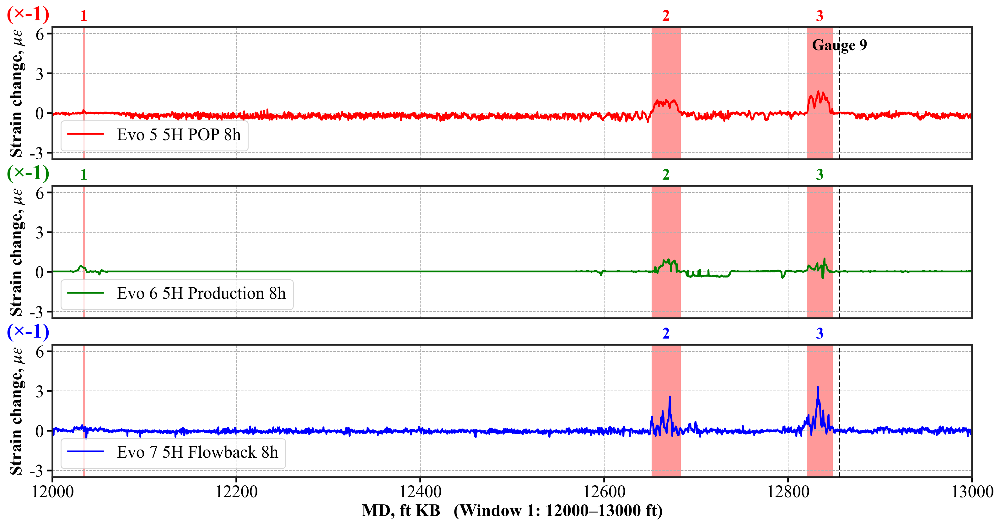

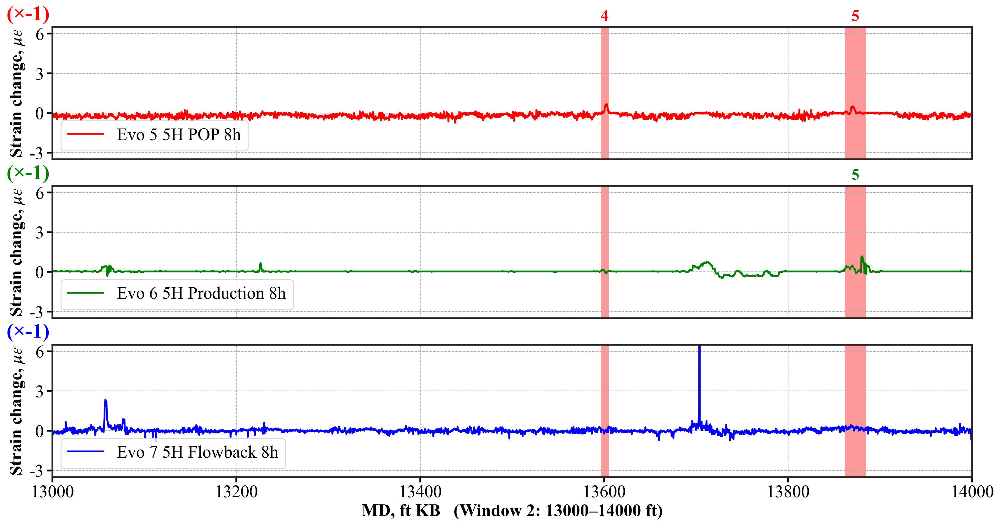

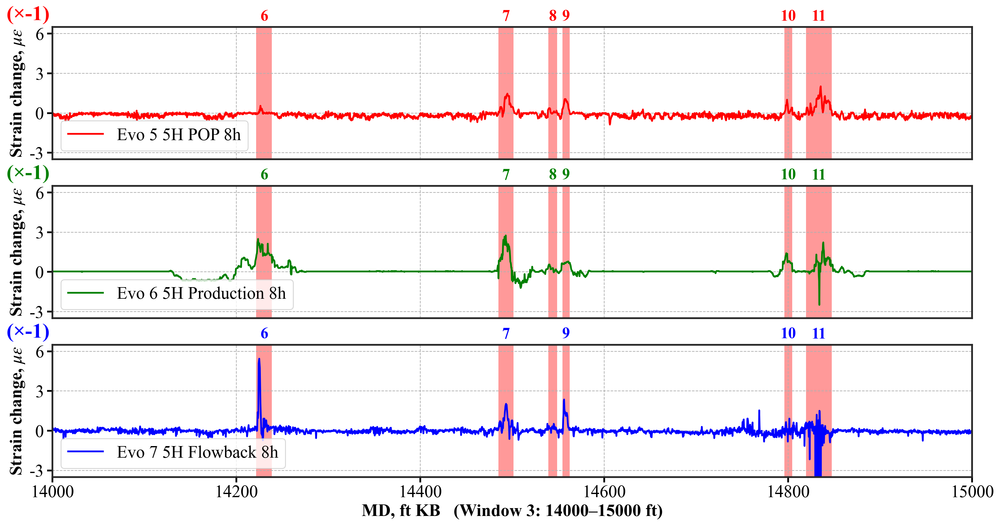

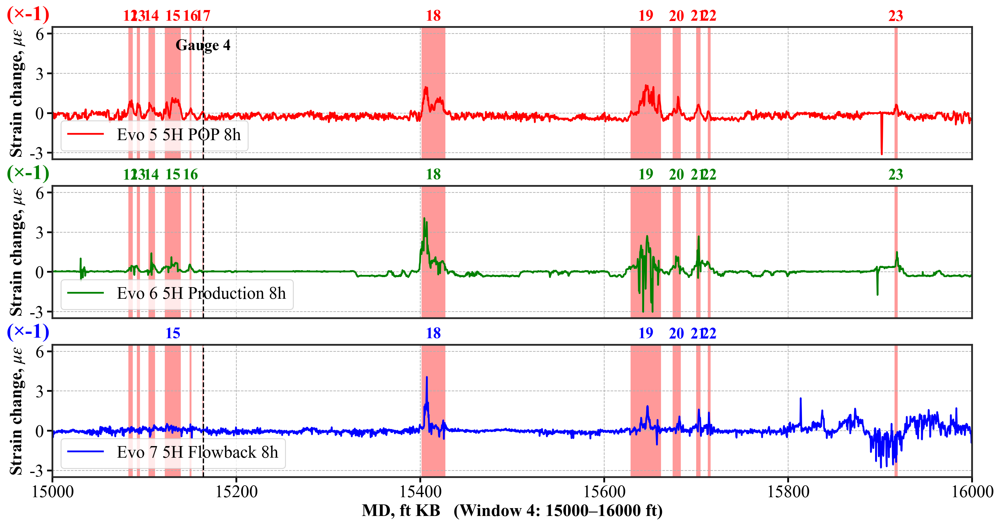

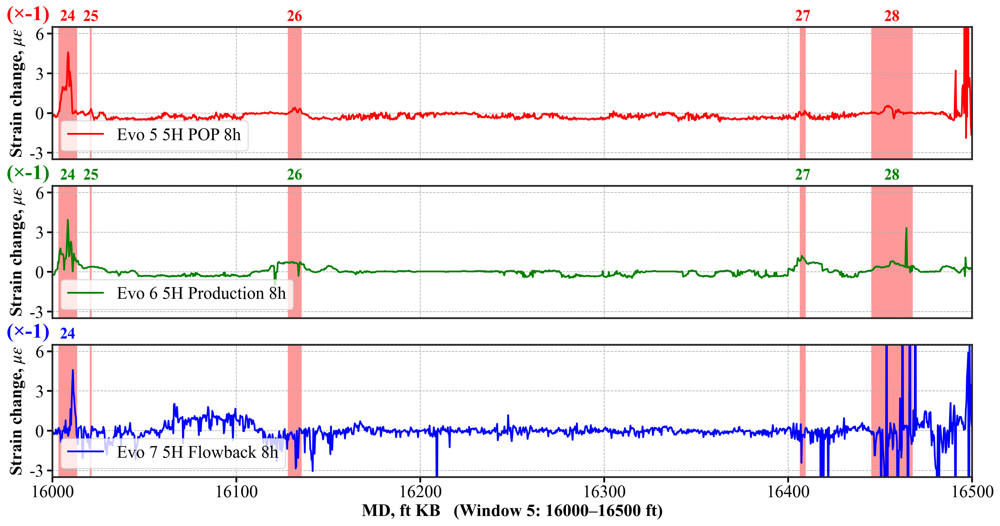

In [26]:
%reload_ext autoreload
%autoreload 2

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

from plot_style import decode_stamps_to_datetimeindex


# =========================================================
# 0) Paths
# =========================================================
EVO5_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/20220707/Evo 5 (POP)/Zgabay A14H - pop - strain change.h5'
EVO6_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 6 (choke)/corrected_within_1h_(with_data_wash).h5'
EVO7_H5 = r'C:/Users/fengxiang.mao/Desktop/Devon data/HFTS-1_Devon/Evo_5_6_7_Sep_2025/Evo 7 (flowback)/corrected_within_1h_(with_data_wash).h5'


# =========================================================
# 1) MD calibration helpers
# =========================================================
def shift_depth_piecewise(depth, z0=12000.0, z1=16000.0, s0=-40.0, s1=-45.0):
    z = np.asarray(depth, dtype=float).reshape(-1)
    shift = np.empty_like(z)

    low  = (z <= z0)
    high = (z >= z1)
    mid  = ~(low | high)

    shift[low]  = s0
    shift[high] = s1
    shift[mid]  = s0 + (s1 - s0) * ((z[mid] - z0) / (z1 - z0))

    return z + shift


def find_nearest_time_index(idx: pd.DatetimeIndex, target: pd.Timestamp) -> int:
    return int(np.abs(idx - target).argmin())


def intervals_channel_to_md(intervals_ch, depth_arr, md_min, md_max):
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for a, b in intervals_ch:
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)
        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi))

    return out


def intervals_channel_to_md_labeled(intervals_ch, depth_arr, md_min, md_max):
    """
    Return: [(md_lo, md_hi, label), ...]
    label is assigned by current list order.
    """
    depth_arr = np.asarray(depth_arr, float)
    ch = np.arange(len(depth_arr))

    out = []
    for k, (a, b) in enumerate(intervals_ch, start=1):
        a = float(a)
        b = float(b)

        a = max(0.0, min(a, len(ch) - 1.0))
        b = max(0.0, min(b, len(ch) - 1.0))

        md_a = float(np.interp(a, ch, depth_arr))
        md_b = float(np.interp(b, ch, depth_arr))

        lo, hi = (md_a, md_b) if md_a <= md_b else (md_b, md_a)
        lo = max(lo, md_min)
        hi = min(hi, md_max)

        if hi > lo:
            out.append((lo, hi, k))

    return out


def style_full_box(ax, lw=2):
    for s in ["left", "bottom", "top", "right"]:
        ax.spines[s].set_visible(True)
        ax.spines[s].set_linewidth(lw)


def add_interval_labels(ax, labeled_intervals, color, y_axes, fontsize=10,
                        special_ids=None, special_color=None,
                        show_only_special=False):
    """
    labeled_intervals: [(a, b, label), ...]
    show_only_special=True 时，只显示 special_ids 里的编号
    """
    if special_ids is None:
        special_ids = set()

    for a, b, label in labeled_intervals:
        if show_only_special and (label not in special_ids):
            continue

        mid = 0.5 * (a + b)
        this_color = special_color if (label in special_ids and special_color is not None) else color

        ax.text(
            mid, y_axes, f"{label}",
            transform=ax.get_xaxis_transform(),
            ha="center", va="center",
            fontsize=fontsize,
            color=this_color,
            fontweight="bold",
            clip_on=False
        )

def filter_labeled_intervals(labeled_intervals, x0, x1):
    out = []
    for a, b, label in labeled_intervals:
        lo = max(a, x0)
        hi = min(b, x1)
        if hi > lo:
            out.append((lo, hi, label))
    return out


def filter_plain_intervals(intervals, x0, x1):
    out = []
    for a, b in intervals:
        lo = max(a, x0)
        hi = min(b, x1)
        if hi > lo:
            out.append((lo, hi))
    return out


# =========================================================
# 2) EVO5 settings
# =========================================================
EVO5_DATA_KEY = "data"
EVO5_DEPTH_MIN = 12000.0
EVO5_DEPTH_MAX = 16500.0
EVO5_START_TIME = datetime.datetime(2022, 3, 15, 9, 0)
EVO5_OFFSETS_H = [0, 8]
EVO5_LABEL = "Evo 5 5H POP 8h"
EVO5_YLIM = (-3.5, 6.5)
EVO5_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO5 = [
    (36491,36499), #1
    (38366,38463), #2
    (38879,38963), #3
    (41231,41258), #4
    # (41531,41591), #5
    (42035,42105), #6
    # (43087,43107), #7
    (43128,43180), #8
    (43927,43976), #9
    (44091,44120), #10
    (44138,44161), #11
    (44869,44895), #12
    (44941,45025), #13
    (45739,45754), #14
    (45767,45778), #15
    (45805,45827), #16
    (45859,45912), #17
    (45941,45947), #18
    (45983,45987), #19
    (46706,46784), #20
    (47395,47495), #21
    (47533,47560), #22
    (47611,47625), #23
    (47649,47659), #24
    (48265,48275), #25
    (48531,48562), #26
    (48583,48586), #27
    (48909,48932), #28
    (49753,49763), #29
    (49871,49939), #30
]


# =========================================================
# 2.5) EVO6 settings
# =========================================================
EVO6_DATA_KEY = "strain_corrected"
EVO6_DEPTH_MIN = 12000.0
EVO6_DEPTH_MAX = 16500.0
EVO6_START_TIME = datetime.datetime(2022, 4, 3, 1, 0)
EVO6_OFFSETS_H = [0, 8]
EVO6_LABEL = "Evo 6 5H Production 8h"
EVO6_YLIM = (-3.5, 6.5)
EVO6_YTICKS = np.arange(-3, 7, 3)

RESP_INTERVALS_EVO6 = [
    (36491,36499),
    (38366,38463),
]

EVO6_USE_SHIFT = True
EVO6_SHIFT_Z0 = 12000.0
EVO6_SHIFT_Z1 = 16000.0
EVO6_SHIFT_S0 = -40.0
EVO6_SHIFT_S1 = -50.0



# =========================================================
# 3) EVO7 settings
# =========================================================
EVO7_DATA_KEY = "strain_corrected"
EVO7_DEPTH_MIN = 12000.0
EVO7_DEPTH_MAX = 16400.0
EVO7_START_TIME = datetime.datetime(2022, 6, 2, 8, 0)
EVO7_OFFSETS_H = [0, 8]
EVO7_LABEL = "Evo 7 5H Flowback 8h"
EVO7_YLIM = (-3.5, 6.5)
EVO7_YTICKS = np.arange(-3, 7, 3)

EVO7_SHIFT_S0 = -40.0
EVO7_SHIFT_S1 = -45.0


RESP_INTERVALS_EVO7 = [
    (38364,38434),  #1
    (38869,38922),  #2
    (39593,39605),  #3
    (39653,39659),  #4
    (43122,43159),  #6
    (43934,43962),  #8
    (44126,44146),  #9
    (44858,44866),  #10
    (44970,45004),  #11
    (45848,45886),  #13
    (46696,46710),  #14
    (47410,47440),  #15
    (47534,47546),  #16
    (47600,47610),  #17a
    (47635,47644),  #17b
    (48522,48540),  #18
]

GAUGE_MDS = {
    "Gauge 4": 15164.13,
    "Gauge 9": 12855.79,
}


# =========================================================
# 4) Shared styles
# =========================================================
style_evo5 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "red"
}

style_evo6 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "g"
}

style_evo7 = {
    "linewidth": 2,
    "alpha": 1,
    "linestyle": "-",
    "color": "#0000FF"
}

# 三行图都统一显示 EVO5 的区间
EVO5_INTERVAL_COLOR = "red"
EVO6_INTERVAL_COLOR = "red"
EVO7_INTERVAL_COLOR = "red"

EVO5_SPECIAL_IDS = set()
EVO5_SPECIAL_COLOR = None

EVO6_SPECIAL_IDS = {1, 2, 3, 5, 
                    6, 7, 8, 9, 10, 
                    11, 12, 13, 14, 15,
                    16, 18, 19, 20,
                    21, 22, 23, 24, 25,
                    26, 27, 28 }

EVO6_SPECIAL_COLOR = "green"

EVO7_SPECIAL_IDS = {2, 3, 6, 7, 9, 10, 11, 15, 18, 19, 20, 21, 22, 24}
EVO7_SPECIAL_COLOR = "#0000FF"

HIGHLIGHT_ALPHA = 0.4


# =========================================================
# 5) Shared MD range
# =========================================================
MD_MIN = EVO5_DEPTH_MIN
MD_MAX = EVO5_DEPTH_MAX


# =========================================================
# 6) Load EVO5
# =========================================================
f5 = h5py.File(EVO5_H5, "r")
d5 = f5[EVO5_DATA_KEY][...]
depth5 = np.asarray(f5["depth"][...], float)
stamps5 = f5["stamps"]
t5 = decode_stamps_to_datetimeindex(stamps5, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO5] dstrain:", d5.shape, " depth:", depth5.shape, " time:", len(t5))

mask5 = (depth5 >= MD_MIN) & (depth5 <= MD_MAX)
depth5_win = depth5[mask5]

test_time5 = [EVO5_START_TIME + datetime.timedelta(hours=h) for h in EVO5_OFFSETS_H]
labels5 = [f"P{i+1}" for i in range(len(test_time5))]

idx5 = {}
for lab, tt in zip(labels5, test_time5):
    idx5[lab] = find_nearest_time_index(t5, pd.to_datetime(tt))

profiles5 = {}
for lab in labels5:
    profiles5[lab] = d5[idx5[lab], mask5]

out5 = -1 * (profiles5["P2"] - profiles5["P1"])


# =========================================================
# 7) Load EVO6
# =========================================================
f6 = h5py.File(EVO6_H5, "r")
d6 = f6[EVO6_DATA_KEY][...]
depth6_raw = np.asarray(f6["depth"][...], float)
stamps6 = f6["stamps"]
t6 = decode_stamps_to_datetimeindex(stamps6, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO6] dstrain:", d6.shape, " depth:", depth6_raw.shape, " time:", len(t6))

if EVO6_USE_SHIFT:
    depth6 = shift_depth_piecewise(
        depth6_raw,
        z0=EVO6_SHIFT_Z0,
        z1=EVO6_SHIFT_Z1,
        s0=EVO6_SHIFT_S0,
        s1=EVO6_SHIFT_S1
    )
else:
    depth6 = depth6_raw.copy()

mask6 = (depth6 >= MD_MIN) & (depth6 <= MD_MAX)
depth6_win = depth6[mask6]

test_time6 = [EVO6_START_TIME + datetime.timedelta(hours=h) for h in EVO6_OFFSETS_H]
labels6 = [f"P{i+1}" for i in range(len(test_time6))]

idx6 = {}
for lab, tt in zip(labels6, test_time6):
    idx6[lab] = find_nearest_time_index(t6, pd.to_datetime(tt))

profiles6 = {}
for lab in labels6:
    profiles6[lab] = d6[idx6[lab], mask6]

out6 = -1 * (profiles6["P2"] - profiles6["P1"])


# =========================================================
# 8) Load EVO7 + apply MD calibration
# =========================================================
f7 = h5py.File(EVO7_H5, "r")
d7 = f7[EVO7_DATA_KEY][...]
depth7_raw = np.asarray(f7["depth"][...], float)
stamps7 = f7["stamps"]
t7 = decode_stamps_to_datetimeindex(stamps7, fmt="%m/%d/%Y %H:%M:%S.%f")

print("[EVO7] dstrain:", d7.shape, " depth:", depth7_raw.shape, " time:", len(t7))

depth7 = shift_depth_piecewise(depth7_raw, z0=12000.0, z1=16000.0, s0=EVO7_SHIFT_S0, s1=EVO7_SHIFT_S1)

mask7 = (depth7 >= MD_MIN) & (depth7 <= MD_MAX)
depth7_win = depth7[mask7]

test_time7 = [EVO7_START_TIME + datetime.timedelta(hours=h) for h in EVO7_OFFSETS_H]
labels7 = [f"P{i+1}" for i in range(len(test_time7))]

idx7 = {}
for lab, tt in zip(labels7, test_time7):
    idx7[lab] = find_nearest_time_index(t7, pd.to_datetime(tt))

profiles7 = {}
for lab in labels7:
    profiles7[lab] = d7[idx7[lab], mask7]

out7 = -1 * (profiles7["P2"] - profiles7["P1"])


# =========================================================
# 9) Convert ONLY EVO5 intervals to MD
#    三个子图统一使用 EVO5 区间
# =========================================================
intervals5_md = intervals_channel_to_md(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)
intervals5_md_labeled = intervals_channel_to_md_labeled(RESP_INTERVALS_EVO5, depth5, MD_MIN, MD_MAX)


# =========================================================
# 10) Build segmented 3x1 figures
# =========================================================
windows = []
for start in np.arange(12000.0, 16500.0, 1000.0):
    end = min(start + 1000.0, MD_MAX)
    if end > start:
        windows.append((start, end))

for iwin, (x0, x1) in enumerate(windows, start=1):

    win_red_plain   = filter_plain_intervals(intervals5_md, x0, x1)
    win_red_labeled = filter_labeled_intervals(intervals5_md_labeled, x0, x1)

    fig, axes = plt.subplots(
        3, 1,
        figsize=(16, 8.5),
        sharex=True,
        gridspec_kw={"height_ratios": [1, 1, 1]}
    )

    ax5_str, ax6_str, ax7_str = axes

    # ---------------------------------------------------------
    # Row1: EVO5
    # ---------------------------------------------------------
    for (a, b) in win_red_plain:
        ax5_str.axvspan(
            a, b,
            facecolor=EVO5_INTERVAL_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=0
        )

    ax5_str.plot(depth5_win, out5, label=EVO5_LABEL, **style_evo5, zorder=2)
    ax5_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
    ax5_str.set_ylim(*EVO5_YLIM)
    ax5_str.set_yticks(EVO5_YTICKS)
    ax5_str.grid(True, linestyle="--", zorder=1)
    ax5_str.legend(loc="lower left", fontsize=20)

    ax5_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax5_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color=style_evo5["color"]
    )

    ax5_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

    add_interval_labels(
        ax5_str,
        win_red_labeled,
        color=EVO5_INTERVAL_COLOR,
        y_axes=1.075,
        fontsize=18,
        special_ids=EVO5_SPECIAL_IDS,
        special_color=EVO5_SPECIAL_COLOR
    )

    # ---------------------------------------------------------
    # Row2: EVO6
    # ---------------------------------------------------------
    for (a, b) in win_red_plain:
        ax6_str.axvspan(
            a, b,
            facecolor=EVO6_INTERVAL_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=0
        )

    ax6_str.plot(depth6_win, out6, label=EVO6_LABEL, **style_evo6, zorder=2)
    ax6_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
    ax6_str.set_ylim(*EVO6_YLIM)
    ax6_str.set_yticks(EVO6_YTICKS)
    ax6_str.grid(True, linestyle="--", zorder=1)
    ax6_str.legend(loc="lower left", fontsize=20)

    ax6_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax6_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color=style_evo6["color"]
    )

    ax6_str.tick_params(axis="x", top=False, bottom=False, labeltop=False, labelbottom=False)

    add_interval_labels(
        ax6_str,
        win_red_labeled,
        color=EVO6_INTERVAL_COLOR,
        y_axes=1.075,
        fontsize=18,
        special_ids=EVO6_SPECIAL_IDS,
        special_color=EVO6_SPECIAL_COLOR,
        show_only_special=True
    )

    # ---------------------------------------------------------
    # Row3: EVO7
    # ---------------------------------------------------------
    for (a, b) in win_red_plain:
        ax7_str.axvspan(
            a, b,
            facecolor=EVO7_INTERVAL_COLOR,
            alpha=HIGHLIGHT_ALPHA,
            edgecolor='none',
            linewidth=0,
            zorder=0
        )

    ax7_str.plot(depth7_win, out7, label=EVO7_LABEL, **style_evo7, zorder=2)
    ax7_str.set_ylabel(r"Strain change, $\mu\varepsilon$")
    ax7_str.set_ylim(*EVO7_YLIM)
    ax7_str.set_yticks(EVO7_YTICKS)
    ax7_str.grid(True, linestyle="--", zorder=1)
    ax7_str.legend(loc="lower left", fontsize=20)

    ax7_str.text(
        -0.05, 1.02, "(×-1)",
        transform=ax7_str.transAxes,
        ha="left", va="bottom",
        fontsize=24, fontweight="bold",
        color=style_evo7["color"]
    )

    if (x1 - x0) >= 900:
        xtick_step = 200
    else:
        xtick_step = 100

    ax7_str.set_xticks(np.arange(x0, x1 + 1e-6, xtick_step))
    ax7_str.set_xlabel(f"MD, ft KB   (Window {iwin}: {int(x0)}–{int(x1)} ft)")
    ax7_str.tick_params(axis="x", top=False, bottom=True, labeltop=False, labelbottom=True, pad=3)

    add_interval_labels(
        ax7_str,
        win_red_labeled,
        color=EVO7_INTERVAL_COLOR,
        y_axes=1.075,
        fontsize=18,
        special_ids=EVO7_SPECIAL_IDS,
        special_color=EVO7_SPECIAL_COLOR,
        show_only_special=True
    )

    # ---------------------------------------------------------
    # Add gauge vertical lines back
    # ---------------------------------------------------------
    for gauge_name, gauge_md in GAUGE_MDS.items():
        if x0 <= gauge_md <= x1:
            for ax in axes:
                ax.axvline(
                    gauge_md,
                    color="black",
                    linestyle="--",
                    linewidth=1.5,
                    zorder=10
                )

            # gauge label only on top subplot
            ax5_str.text(
                gauge_md,
                0.80,
                gauge_name,
                transform=ax5_str.get_xaxis_transform(),
                ha="center",
                va="bottom",
                fontsize=18,
                color="black",
                fontweight="bold"
            )

    # ---------------------------------------------------------
    # Shared settings
    # ---------------------------------------------------------
    for ax in axes:
        ax.set_xlim(x0, x1)
        style_full_box(ax, lw=2)

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.2)
    plt.show()


# =========================================================
# 11) Close files
# =========================================================
f5.close()
f6.close()
f7.close()